# Dipper Review Label Separability

This notebook analyzes the reviewed candidates in `output/runs/runs_march18_bundle_all/review/review.db`.
It focuses on whether `dipper`, `microlensing`, `unknown_interesting`, `flare`, and `ltv` labels can be statistically distinguished from `instrumental` and/or `other` review labels.

It includes:

- reviewed candidate tables by label and status
- group summaries for review metadata and scientific/quality-control metrics
- univariate numeric tests for multiple label contrasts
- categorical/flag association tests
- baseline binary logistic models for several contrasts
- an aggregate interesting-vs-background model
- a multiclass model sanity check
- PCA and z-scored group-profile plots
- rare-label nearest-neighbor analysis
- light-curve plotting helpers and example plots
- a rule sandbox for testing interpretable cuts

The review DB is opened read-only by default.


## Setup

Path discovery lets this run from the repo root or from `malca/notebooks`.


In [21]:
from __future__ import annotations

import os
os.environ.setdefault("MPLCONFIGDIR", "/tmp/malca-mplconfig")

import json
import math
import sqlite3
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from IPython.display import Markdown, display
from scipy import stats
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    average_precision_score,
    balanced_accuracy_score,
    classification_report,
    confusion_matrix,
    precision_recall_curve,
    roc_auc_score,
    roc_curve,
)
from sklearn.model_selection import StratifiedKFold, cross_val_predict, cross_validate
from sklearn.neighbors import NearestNeighbors
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler

sns.set_theme(style="whitegrid", context="notebook")
pd.set_option("display.max_columns", 180)
pd.set_option("display.max_rows", 140)
pd.set_option("display.width", 220)

root_candidates = [Path.cwd(), *Path.cwd().parents]
REPO_ROOT = next(
    (
        p for p in root_candidates
        if (p / "malca").is_dir()
        and (p / "output" / "runs" / "runs_march18_bundle_all" / "review" / "review.db").exists()
    ),
    Path.cwd(),
)
RUN_DIR = REPO_ROOT / "output" / "runs" / "runs_march18_bundle_all"
DB_PATH = RUN_DIR / "review" / "review.db"
RESULTS_DIR = RUN_DIR / "results"
LIGHTCURVE_DIR = RUN_DIR / "bundle_assets" / "lightcurves"

print(f"REPO_ROOT      = {REPO_ROOT}")
print(f"RUN_DIR        = {RUN_DIR}")
print(f"DB_PATH        = {DB_PATH}")
print(f"LIGHTCURVE_DIR = {LIGHTCURVE_DIR}")
print(f"DB exists      = {DB_PATH.exists()}")


REPO_ROOT      = /home/calder/code/malca
RUN_DIR        = /home/calder/code/malca/output/runs/runs_march18_bundle_all
DB_PATH        = /home/calder/code/malca/output/runs/runs_march18_bundle_all/review/review.db
LIGHTCURVE_DIR = /home/calder/code/malca/output/runs/runs_march18_bundle_all/bundle_assets/lightcurves
DB exists      = True


## Load Review DB

The URI opens the SQLite DB in read-only mode when possible. If your local SQLite build does not support URI reads, change `READ_ONLY = False`.


In [22]:
READ_ONLY = True
if not DB_PATH.exists():
    raise FileNotFoundError(DB_PATH)

connect_target = f"file:{DB_PATH}?mode=ro" if READ_ONLY else str(DB_PATH)
connect_kwargs = {"uri": True} if READ_ONLY else {}
with sqlite3.connect(connect_target, **connect_kwargs) as conn:
    reviewed = pd.read_sql_query(
        """
        SELECT
            c.*,
            r.status AS review_status,
            r.interest_score,
            r.event_class,
            r.review_pass,
            r.notes,
            r.reviewer,
            r.updated_at
        FROM candidates c
        JOIN reviews r USING(candidate_id)
        WHERE COALESCE(r.status, '') NOT IN ('', 'unreviewed')
        """,
        conn,
    )
    all_candidates = pd.read_sql_query("SELECT * FROM candidates", conn)
    reviews = pd.read_sql_query("SELECT * FROM reviews", conn)
    app_state = pd.read_sql_query("SELECT * FROM app_state", conn)

reviewed["updated_at"] = pd.to_datetime(reviewed["updated_at"], errors="coerce", utc=True)
for col in ["interest_score", "review_pass"]:
    reviewed[col] = pd.to_numeric(reviewed[col], errors="coerce")

print(f"All candidates in DB: {len(all_candidates):,}")
print(f"Reviewed rows:        {len(reviewed):,}")
print(f"Review rows:          {len(reviews):,}")
print(f"Unreviewed/missing:   {len(all_candidates) - len(reviews):,}")

display(reviewed["event_class"].value_counts(dropna=False).rename_axis("event_class").reset_index(name="n"))
display(pd.crosstab(reviewed["event_class"], reviewed["review_status"], margins=True, dropna=False))
display(app_state.loc[app_state["key"].str.contains("last|input", case=False, na=False)])


All candidates in DB: 9,569
Reviewed rows:        1,368
Review rows:          1,368
Unreviewed/missing:   8,201


,event_class,n
0,unknown_interesting,776
1,instrumental,404
2,other,96
3,ltv,36
4,microlensing,34
5,dipper,19
6,flare,3


review_status,needs_followup,reviewed,All
event_class,,,
dipper,0,19,19
flare,0,3,3
instrumental,0,404,404
ltv,0,36,36
microlensing,2,32,34
other,0,96,96
unknown_interesting,2,774,776
All,4,1364,1368


,key,value,updated_at
0,last_input_file,/home/calder/code/malca/output/runs/runs_march...,2026-03-22T16:02:44.643504+00:00
1,review_last_candidate,94490667944,2026-05-11T00:21:16.313760+00:00


## Label Families And Candidate Tables

The aggregate family definitions are intentionally explicit so you can edit them. `interesting` includes labels you may want to recover; `background` includes labels that usually represent rejection or low-priority outcomes.


In [23]:
LABEL_ORDER = ["dipper", "microlensing", "unknown_interesting", "flare", "ltv", "instrumental", "other"]
INTERESTING_LABELS = ["dipper", "microlensing", "unknown_interesting", "flare", "ltv"]
BACKGROUND_LABELS = ["instrumental", "other"]
RARE_INTERESTING_LABELS = ["dipper", "microlensing", "flare", "ltv"]

reviewed["review_family"] = np.select(
    [reviewed["event_class"].isin(INTERESTING_LABELS), reviewed["event_class"].isin(BACKGROUND_LABELS)],
    ["interesting", "background"],
    default="unmapped",
)
reviewed["is_needs_followup"] = reviewed["review_status"].eq("needs_followup")

KEY_DISPLAY_COLS = [
    "candidate_id", "asas_sn_id", "event_class", "review_family", "review_status", "interest_score", "review_pass",
    "updated_at", "notes", "lc_path",
    "dipper_score", "dipper_n_dips", "dipper_n_valid_dips", "dip_significant", "dip_best_morph",
    "dip_best_log_bf", "dip_best_delta_bic", "dip_best_amp", "dip_best_t0", "dip_count", "dip_run_count",
    "dip_max_run_points", "dip_max_run_duration", "dip_symmetry_score", "dip_is_single_event",
    "jumper_score", "jump_significant", "jump_best_log_bf", "jump_best_amp", "jump_count",
    "microlens_match", "microlens_catalog", "microlens_name", "microlens_te_days", "microlens_sep_arcsec",
    "periodicity_score", "periodicity_is_significant", "periodic_flag", "period_consensus_days", "period_n_sources",
    "phase_quality_score", "lsp_power", "lsp_period", "pdm_snr", "ce_snr",
    "baseline_mag", "n_points", "n_cameras", "stats_time_span_days", "cadence_median_days",
    "stats_photometry_std_mag", "stats_photometry_robust_sigma_mag", "stats_amplitude", "stats_percent_amplitude",
    "stats_variability_reduced_chi2_vs_constant", "stats_variability_stetson_J", "stats_variability_stetson_L",
    "stats_variability_von_neumann_ratio", "stats_skew", "stats_max_slope",
    "catalog_match", "catalog_source", "asassn_var_type", "gaia_var_class", "simbad_otype", "ztf_var_type",
    "vetting_likely_known", "ruwe", "pm_total", "A_v_3d", "ebv_3d",
]
KEY_DISPLAY_COLS = [c for c in KEY_DISPLAY_COLS if c in reviewed.columns]


def candidate_table(label: str | None = None, *, family: str | None = None, max_rows: int = 100, sort_by: str = "interest_score") -> pd.DataFrame:
    data = reviewed.copy()
    if label is not None:
        data = data.loc[data["event_class"].eq(label)].copy()
    if family is not None:
        data = data.loc[data["review_family"].eq(family)].copy()
    sort_cols = [c for c in [sort_by, "updated_at", "candidate_id"] if c in data.columns]
    ascending = [False if c in {"interest_score", "updated_at", "dipper_score", "dip_best_log_bf", "microlens_te_days"} else True for c in sort_cols]
    if sort_cols:
        data = data.sort_values(sort_cols, ascending=ascending)
    return data[KEY_DISPLAY_COLS].head(max_rows)

for label in LABEL_ORDER:
    display(Markdown(f"### {label}: {int((reviewed['event_class'] == label).sum())} reviewed/non-unreviewed"))
    display(candidate_table(label, max_rows=80))


### dipper: 19 reviewed/non-unreviewed

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
657,249109084130,249109084130,dipper,interesting,reviewed,4,2,2026-03-19 05:19:56.656011+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.404836,1,None,-0.282496,6.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.954414,2644.0,9.0,3088.80214,0.521390,0.094767,0.063132,0.177998,0.026403,82.629246,5.907611,5.342541,6.004137,-1.157189,10061.200254,0,,,,Y*O,,0,NaN,None,0.467228,0.150719
33,180388903123,180388903123,dipper,interesting,reviewed,4,2,2026-03-19 04:41:57.365051+00:00,,/home/calder/code/malca/output/runs/runs_march...,-1.040463,69.0,4.0,1,gaussian,None,39.545482,68.450300,8679.175932,54.0,4.0,44.0,144.78118,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.572548,1104.0,5.0,2881.65095,1.020650,0.025575,0.021371,0.053543,0.008988,6.464754,1.166960,1.057203,1.504952,0.827104,6.580769,0,,,,*,,1,NaN,None,0.000000,NaN
1223,498216222923,498216222923,dipper,interesting,reviewed,3,3,2026-03-20 20:06:46.892226+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.332474,52.0,35.0,1,gaussian,None,106.108764,0.022553,8983.783280,16.0,2.0,14.0,26.06195,-0.855440,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.097669,1115.0,3.0,2933.89483,1.019180,0.049686,0.036116,0.098660,0.015499,24.329870,3.329462,2.992795,5.800892,1.275839,5.342637,0,,,,,,0,NaN,None,0.000000,NaN
864,532576054353,532576054353,dipper,interesting,reviewed,2,2,2026-03-20 06:43:15.433996+00:00,,/home/calder/code/malca/output/runs/runs_march...,17.788846,228.0,49.0,1,gaussian,None,23.252725,0.616661,8775.133843,13.0,3.0,6.0,5.05744,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.630545,2380.0,6.0,3086.36401,0.860910,0.030920,0.026697,0.064389,0.009831,9.111915,1.440696,1.370252,1.250369,0.474284,88.816667,0,,,,,,0,NaN,None,0.191468,0.061764
794,446676921101,446676921101,dipper,interesting,reviewed,2,2,2026-03-19 04:43:02.388097+00:00,,/home/calder/code/malca/output/runs/runs_march...,-0.560155,143.0,28.0,1,gaussian,None,88.878621,0.189052,8899.936998,10.0,1.0,10.0,13.01852,-0.613886,1,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.949305,1729.0,5.0,2822.03763,0.940105,0.047936,0.036734,0.097869,0.014537,18.131603,1.922555,1.786259,1.334949,0.961538,7806.900197,0,,,,,,0,NaN,None,0.969858,0.312858
636,223338997633,223338997633,dipper,interesting,reviewed,1,2,2026-03-20 20:49:57.550421+00:00,,/home/calder/code/malca/output/runs/runs_march...,19.852360,60.0,30.0,1,gaussian,None,47.434604,0.773251,10634.376475,8.0,3.0,3.0,12.78929,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.594424,1097.0,6.0,30

### microlensing: 34 reviewed/non-unreviewed

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
554,120259784233,120259784233,microlensing,interesting,reviewed,4,2,2026-03-20 06:30:14.291908+00:00,,/home/calder/code/malca/output/runs/runs_march...,18.615267,73.0,12.0,1,gaussian,None,75.550760,0.803099,9625.052969,6.0,1.0,6.0,58.78362,NaN,1,-1.929648,1,None,-1.403154e+00,54.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.766090,507.0,2.0,2772.64745,1.991685,0.034453,0.029519,0.070772,0.010460,11.453628,1.662557,1.535177,1.130358,-0.891288,0.487721,0,,,,SB*,,0,NaN,None,0.000000,NaN
36,188979054063,188979054063,microlensing,interesting,reviewed,4,2,2026-03-19 05:06:26.081986+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.456060,1,None,-1.210965e-01,60.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.642120,1051.0,7.0,2889.98010,1.000755,0.017853,0.015947,0.036309,0.005693,3.177648,0.306739,0.295359,0.571573,-0.074318,50.624390,0,,,,V*,,1,NaN,None,0.000000,NaN
533,68720699238,68720699238,microlensing,interesting,reviewed,3,2,2026-03-20 21:14:06.076510+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,15.985043,1,None,-1.114719e+03,49.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.441484,621.0,2.0,2788.64074,1.940030,0.021168,0.019274,0.041004,0.007475,4.477934,0.761449,0.727535,0.769864,-0.287270,3.330711,0,,,,,,0,0.933995,None,1.605322,0.517846
258,618475317371,618475317371,microlensing,interesting,reviewed,3,2,2026-03-20 20:56:34.702768+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-2.206947,1,None,-2.028723e-01,40.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.549402,1901.0,5.0,2834.18016,0.851795,0.018708,0.014826,0.040444,0.006136,3.486329,0.414687,0.375806,0.850931,-0.936336,69.690909,0,,,,*,,0,NaN,None,0.000000,NaN
1261,566936418537,566936418537,microlensing,interesting,reviewed,3,2,2026-03-20 20:39:05.193497+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.753366,1,None,-3.249646e+00,76.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.115808,2356.0,6.0,2914.23041,0.779360,0.015464,0.013102,0.032025,0.005083,2.354333,0.185456,0.172006,0.626648,-0.447454,883.300022,0,,,,,,0,NaN,None,1.063906,0.343196
870,541166175153,541166175153,microlensing,interesting,reviewed,3,2,2026-03-20 20:24:47.695830+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.105657,1,None,-1.448235e+02,47.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.573989,1121.0,4.0,2757.77923,1.012815,0.018599,0.

### unknown_interesting: 776 reviewed/non-unreviewed

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
229,584115757436,584115757436,unknown_interesting,interesting,needs_followup,4,1,2026-03-22 17:14:31.648862+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,16.382227,1,None,-0.247181,58.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.669065,1108.0,3.0,2827.97500,1.017280,0.023924,0.014826,0.051347,0.007346,5.723685,0.934841,0.770163,1.735221,-1.597741,6.958515,0,,,DSCT|GDOR|SXPHE,Pu*,,1,NaN,None,1.728203,0.557485
244,601295591834,601295591834,unknown_interesting,interesting,needs_followup,4,1,2026-03-22 17:14:13.951231+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.467168,1,None,-0.238984,47.0,None,None,None,None,None,3.0,None,0,276.440002,1.0,None,None,276.440002,None,None,12.747103,1251.0,4.0,2932.07628,1.000280,0.019434,0.014826,0.042280,0.006702,3.754735,0.637614,0.570634,0.972490,-0.988430,11.435685,1,asassn_var,ROT:,,*,,1,NaN,None,2.240976,0.722895
724,343597961057,343597961057,unknown_interesting,interesting,reviewed,4,1,2026-03-22 16:27:03.037328+00:00,,/home/calder/code/malca/output/runs/runs_march...,22.950320,216.0,15.0,1,noise,None,0.000000,NaN,NaN,16.0,7.0,3.0,31.94654,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,3.0,None,0,2.281300,1.0,None,None,2.281300,None,None,13.571922,1015.0,5.0,2892.99942,1.381735,0.020571,0.017791,0.042577,0.006495,3.837235,0.278058,0.265509,0.500630,0.349002,2.584440,1,ztf_periodic,,,EB*,EA,1,NaN,None,1.278528,0.412428
1366,94490667944,94490667944,unknown_interesting,interesting,reviewed,4,3,2026-03-20 21:25:39.987860+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,21.368117,1,None,-1.470187,49.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.190754,663.0,4.0,2820.59666,1.995670,0.106071,0.068781,0.195250,0.032902,111.688870,7.722535,7.547258,5.366961,-1.242971,1.127983,0,,,,,,0,NaN,None,0.000000,NaN
320,94490663224,94490663224,unknown_interesting,interesting,reviewed,4,2,2026-03-20 21:25:14.987547+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-1.801169,1,None,-0.235393,28.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.614831,696.0,4.0,2875.08932,1.995320,0.024291,0.016310,0.051146,0.006976,5.900428,0.912259,0.810365,1.465125,-1.116971,0.551233,0,,,,Em*,,0,NaN,None,1.360390,0.438836
1364,94490543907,94490543907,unknown_interesting,interesting,reviewed,4,2,2026-03-20 21:24:59.908670+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.766676,1,None,-1.080449,71.0,None,None,None,None,None,NaN,None,0,NaN,0.

### flare: 3 reviewed/non-unreviewed

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
1277,584116151746,584116151746,flare,interesting,reviewed,4,2,2026-03-20 01:57:43.750097+00:00,,/home/calder/code/malca/output/runs/runs_march...,20.413462,115.0,2.0,1,skew_gaussian,None,23.034751,0.014318,8960.078300,118.0,12.0,53.0,167.18873,NaN,0,21.581200,1,None,-5.553832,52.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.289909,894.0,5.0,2882.89762,1.09483,0.022463,0.019219,0.045500,0.006818,4.904324,0.800908,0.745149,0.993334,-0.720642,1.741517,0,,,,,,0,NaN,None,0.493247,0.159112
576,163208930428,163208930428,flare,interesting,reviewed,4,2,2026-03-19 04:56:50.694826+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.711125,1,None,-86.452765,14.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.561159,734.0,2.0,2811.64198,1.94534,0.037700,0.019274,0.082500,0.011208,13.551382,1.683791,1.312324,2.477700,-1.736522,1.616104,0,,,,,,0,NaN,None,0.000000,NaN
566,146029437956,146029437956,flare,interesting,reviewed,2,2,2026-03-19 04:44:06.044892+00:00,,/home/calder/code/malca/output/runs/runs_march...,-0.525363,77.0,10.0,1,gaussian,None,98.541123,0.029590,10064.698653,14.0,2.0,9.0,48.86042,0.839909,0,21.037343,1,None,-0.166645,82.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.557998,997.0,5.0,2887.20580,1.73756,0.126571,0.035585,0.182704,0.027954,154.974899,8.680712,7.525155,15.719182,-0.844398,0.517185,0,,,,*,,0,NaN,None,1.870512,0.603391


### ltv: 36 reviewed/non-unreviewed

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
412,352188082317,352188082317,ltv,interesting,reviewed,4,2,2026-03-20 02:01:39.585016+00:00,,/home/calder/code/malca/output/runs/runs_march...,20.362103,32.0,21.0,1,gaussian,None,47.487575,108.319480,10950.378412,37.0,9.0,9.0,38.87690,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.622000,1015.0,6.0,2997.80568,1.275750,0.079104,0.068360,0.126812,0.017047,62.328804,6.245206,6.632190,6.114575,0.613987,5.027881,0,,,,,,0,2.994734,None,1.194479e-16,3.853159e-17
1130,326418682923,326418682923,ltv,interesting,reviewed,4,2,2026-03-19 08:51:35.261872+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-1.364057,1,None,-1.596679e+00,10.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.139028,1025.0,5.0,2887.19810,1.129710,0.052408,0.034651,0.088607,0.018070,26.664240,3.511844,3.281525,3.801338,-0.937308,3.160526,0,,,,,,0,NaN,None,0.000000e+00,NaN
632,214748792627,214748792627,ltv,interesting,reviewed,4,2,2026-03-19 05:10:19.777130+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.056984,1,None,-6.291831e-02,2.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.722225,1739.0,9.0,2998.11635,0.597820,0.036699,0.036975,0.072731,0.009882,11.875248,1.813857,1.810882,1.051500,-0.091368,5560.199129,0,,,,,,0,NaN,None,0.000000e+00,NaN
1037,163209477162,163209477162,ltv,interesting,reviewed,4,2,2026-03-19 04:57:01.548433+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,2.217345,1,None,-1.336938e+02,5.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,14.298272,1409.0,8.0,2810.59134,0.996385,0.220918,0.279193,0.321215,0.035769,464.672577,20.078822,23.638781,43.872641,-0.131243,6072.800153,0,,ROT:,,*,,1,NaN,None,5.682695e-10,1.833127e-10
859,523986746107,523986746107,ltv,interesting,reviewed,4,2,2026-03-19 04:46:30.330089+00:00,,/home/calder/code/malca/output/runs/runs_march...,-0.104598,37.0,35.0,1,gaussian,None,53.841555,0.080480,8347.668664,18.0,4.0,6.0,7.96374,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.685268,2352.0,5.0,2998.99105,0.734400,0.102818,0.064968,0.197754,0.025283,97.906276,6.721040,6.000290,15.105861,1.324010,5491.200139,0,,,,SB*,,0,NaN,None,1.755301e-01,5.662260e-02
491,584116537767,584116537767,ltv,interesting,reviewed,4,2,2026-03-19 04:35:17.432328+00:00,,/home/calder/code/malca/output/runs/runs_march...,-inf,77.0,0.0,1,gaussian,None,41.269258,218.439518,10176.151074,8.0,1.0,8.0,152.62693,0.987902,1,1.833019,1,None,-7.790655e+00,108.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.036444,1213.0,

### instrumental: 404 reviewed/non-unreviewed

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
288,652835663354,652835663354,instrumental,background,reviewed,4,1,2026-03-22 17:17:08.799442+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,21.975566,1,None,-1.483094,28.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.077922,406.0,1.0,2717.22508,2.956750,0.018334,0.014826,0.039500,0.006624,3.361259,0.460820,0.425696,0.599110,-0.561396,0.071154,0,,,,,,0,NaN,None,0.000000e+00,NaN
521,652835793906,652835793906,instrumental,background,reviewed,4,1,2026-03-22 17:16:46.519255+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,18.157939,1,None,NaN,85.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,11.745182,260.0,1.0,2527.91411,3.915590,0.040009,0.037065,0.084000,0.012941,16.007064,2.453276,2.348520,0.777071,0.407541,0.094921,0,,,,,,0,4.597023,None,1.022192e+00,3.297392e-01
463,532576716601,532576716601,instrumental,background,reviewed,4,1,2026-03-22 17:16:28.939267+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,18.679649,1,None,NaN,23.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,11.981064,214.0,1.0,2819.27831,3.991650,0.031307,0.023722,0.062000,0.008513,9.771858,1.169650,1.085801,0.595788,-1.005257,0.106564,0,,,,*,,0,0.978565,None,2.346547e-01,7.569506e-02
1355,8590239535,8590239535,instrumental,background,reviewed,4,2,2026-03-20 21:23:30.724739+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,20.076527,1,None,NaN,4.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,11.972000,769.0,6.0,2881.22243,1.988270,0.084836,0.081694,0.164000,0.030154,71.970824,4.603617,4.506747,0.834889,0.354977,550.200001,0,,,,,,0,NaN,None,3.934842e-01,1.269304e-01
993,85900470025,85900470025,instrumental,background,reviewed,4,2,2026-03-20 21:23:07.013288+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,20.658935,1,None,NaN,8.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.120143,1281.0,3.0,3089.49666,1.026560,0.099788,0.089270,0.198104,0.031097,98.341092,3.041384,2.892324,0.574390,-0.533048,47.641533,0,,,,*,,0,NaN,None,2.518873e-01,8.125397e-02
989,85899895848,85899895848,instrumental,background,reviewed,4,2,2026-03-20 21:22:33.378217+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,20.274605,1,None,-2.195154,4.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.363666,1561.0,4.0,3092.39336,0.996445,0.055132,0.047792,0.115500,0.018524,29.821269,1.338495,

### other: 96 reviewed/non-unreviewed

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
290,652835815168,652835815168,other,background,reviewed,4,2,2026-03-20 21:09:36.701018+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,22.778900,1,None,-1158.980153,12.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.968122,1204.0,3.0,2898.93249,1.012110,0.033671,0.026236,0.071348,0.011050,11.279854,1.671766,1.504766,1.464951,-1.274765,10.784290,0,,,,,,1,NaN,None,0.000000,NaN
419,386547289419,386547289419,other,background,reviewed,4,3,2026-03-20 20:48:12.024244+00:00,,/home/calder/code/malca/output/runs/runs_march...,19.867276,188.0,11.0,1,noise,None,0.000000,NaN,NaN,42.0,19.0,3.0,19.03125,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.371770,1201.0,6.0,2879.88233,1.003920,0.016800,0.014541,0.034907,0.006143,2.821718,0.263132,0.245890,0.621839,0.612603,28.000000,0,,ROT:,YSO,SB*,,1,1.018635,None,0.243368,0.078506
456,515396207917,515396207917,other,background,reviewed,4,2,2026-03-20 20:18:11.810720+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,20.035418,1,None,NaN,43.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,11.994506,1499.0,4.0,3039.78593,1.004415,0.067994,0.043212,0.122500,0.018599,46.231203,1.944006,1.865348,0.546545,-1.119736,6.603248,0,,,,RR*,,1,1.204014,None,0.163009,0.052583
437,472446626839,472446626839,other,background,reviewed,4,2,2026-03-20 19:51:10.047589+00:00,,/home/calder/code/malca/output/runs/runs_march...,12.493998,191.0,3.0,1,gaussian,None,61.827673,6.055380,8002.641992,38.0,15.0,6.0,59.43981,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.237051,1008.0,4.0,2880.84820,1.059670,0.016183,0.013567,0.033573,0.005483,2.608585,0.140635,0.132582,0.505737,-0.057430,1.784719,0,,,,EB*,,1,0.834857,None,0.601966,0.194183
907,584115779011,584115779011,other,background,reviewed,4,2,2026-03-20 06:39:57.740125+00:00,,/home/calder/code/malca/output/runs/runs_march...,18.042140,363.0,21.0,1,noise,None,0.000000,NaN,NaN,61.0,27.0,5.0,18.02010,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.485041,2093.0,6.0,2927.14622,0.862080,0.019237,0.016162,0.039941,0.006186,3.425171,0.188016,0.174201,0.523319,0.727160,174.475004,0,,,,EB*,,1,NaN,None,0.678550,0.218887
526,652835797559,652835797559,other,background,reviewed,4,2,2026-03-20 06:38:22.372817+00:00,,/home/calder/code/malca/output/runs/runs_march...,18.205948,218.0,12.0,1,skew_gaussian,None,28.763124,15.960912,8198.449693,14.0,6.0,3.0,107.34071,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.273613,1138.0,3.0,2915.44407,1.033430,0.019129,0.014174,0.0

## Review And Label Summary

This separates label frequency from the measured features. `interest_score` and `review_pass` are human-review metadata and are deliberately excluded from the feature models later.


In [24]:
review_summary = (
    reviewed.groupby(["event_class", "review_status"], dropna=False)
    .agg(
        n=("candidate_id", "size"),
        mean_interest=("interest_score", "mean"),
        median_interest=("interest_score", "median"),
        high_interest=("interest_score", lambda s: int((s >= 3).sum())),
        min_updated=("updated_at", "min"),
        max_updated=("updated_at", "max"),
    )
    .sort_values("n", ascending=False)
)
review_summary["high_interest_frac"] = review_summary["high_interest"] / review_summary["n"]
display(review_summary)

display(pd.crosstab(reviewed["event_class"], reviewed["review_pass"], margins=True, dropna=False))
display(pd.crosstab(reviewed["review_family"], reviewed["event_class"], margins=True, dropna=False))


,,n,mean_interest,median_interest,high_interest,min_updated,max_updated,high_interest_frac
event_class,review_status,,,,,,,
unknown_interesting,reviewed,774,3.828165,4.0,729,2026-03-19 04:38:18.257956+00:00,2026-03-22 17:15:30.027911+00:00,0.941860
instrumental,reviewed,404,3.188119,4.0,289,2026-03-19 04:42:23.545941+00:00,2026-03-27 19:50:47.531241+00:00,0.715347
other,reviewed,96,3.135417,4.0,70,2026-03-19 04:38:04.727586+00:00,2026-03-27 19:48:55.775582+00:00,0.729167
ltv,reviewed,36,1.833333,1.0,10,2026-03-19 04:35:17.432328+00:00,2026-03-22 17:12:40.930159+00:00,0.277778
microlensing,reviewed,32,1.750000,1.0,8,2026-03-19 04:59:24.637998+00:00,2026-03-22 17:12:06.041026+00:00,0.250000
dipper,reviewed,19,1.526316,1.0,3,2026-03-19 04:41:57.365051+00:00,2026-03-20 20:49:57.550421+00:00,0.157895
flare,reviewed,3,3.333333,4.0,2,2026-03-19 04:44:06.044892+00:00,2026-03-20 01:57:43.750097+00:00,0.666667
microlensing,needs_followup,2,1.500000,1.5,0,2026-03-22 17:10:51.995179+00:00,2026-03-22 17:18:02.135522+00:00,0.000000
unknown_interesting,needs_followup,2,4.000000,4.0,2,2026-03-22 17:14:13.951231+00:00,2026-03-22 17:14:31.648862+00:00,1.000000


review_pass,1,2,3,4,All
event_class,,,,,
dipper,0,18,1,0,19
flare,0,3,0,0,3
instrumental,5,384,15,0,404
ltv,0,34,2,0,36
microlensing,4,29,1,0,34
other,0,94,2,0,96
unknown_interesting,5,748,22,1,776
All,14,1310,43,1,1368


event_class,dipper,flare,instrumental,ltv,microlensing,other,unknown_interesting,All
review_family,,,,,,,,
background,0,0,404,0,0,96,0,500
interesting,19,3,0,36,34,0,776,868
All,19,3,404,36,34,96,776,1368


## Feature Preparation And Derived Metrics

This builds numeric and low-cardinality categorical feature lists, plus a few derived absolute-value and ratio columns that are often easier to interpret.


In [25]:
analysis = reviewed.copy()

# Derived columns that are useful for event-shape and artifact checks.
for col in [
    "dip_best_amp", "dip_best_log_bf", "dip_best_delta_bic", "jump_best_amp", "jump_best_log_bf",
    "stats_trend_slope_mag_per_year", "stats_max_slope", "ltv_slope", "ltv_trend_slope_mag_per_year",
    "pmra", "pmdec",
]:
    if col in analysis.columns:
        analysis[f"abs_{col}"] = pd.to_numeric(analysis[col], errors="coerce").abs()

if {"pmra", "pmdec"}.issubset(analysis.columns) and "pm_total" not in analysis.columns:
    analysis["pm_total"] = np.sqrt(pd.to_numeric(analysis["pmra"], errors="coerce") ** 2 + pd.to_numeric(analysis["pmdec"], errors="coerce") ** 2)

if {"dip_n_valid", "dip_count"}.issubset(analysis.columns):
    analysis["dip_valid_fraction"] = pd.to_numeric(analysis["dip_n_valid"], errors="coerce") / pd.to_numeric(analysis["dip_count"], errors="coerce")
if {"dipper_n_valid_dips", "dipper_n_dips"}.issubset(analysis.columns):
    analysis["dipper_valid_fraction"] = pd.to_numeric(analysis["dipper_n_valid_dips"], errors="coerce") / pd.to_numeric(analysis["dipper_n_dips"], errors="coerce")
if {"jump_count", "dip_count"}.issubset(analysis.columns):
    analysis["dip_to_jump_count_ratio"] = (pd.to_numeric(analysis["dip_count"], errors="coerce") + 1) / (pd.to_numeric(analysis["jump_count"], errors="coerce") + 1)
if {"stats_file_points_kept_after_filter", "stats_file_points_total"}.issubset(analysis.columns):
    analysis["stats_points_kept_fraction"] = pd.to_numeric(analysis["stats_file_points_kept_after_filter"], errors="coerce") / pd.to_numeric(analysis["stats_file_points_total"], errors="coerce")

EXCLUDE_FEATURES = {
    "interest_score", "review_pass", "updated_at", "candidate_id", "asas_sn_id", "source_path",
    "lc_path", "payload_json", "imported_at", "review_status", "event_class", "notes", "reviewer",
    "review_family", "is_needs_followup",
}

numeric_cols = []
for col in analysis.columns:
    if col in EXCLUDE_FEATURES:
        continue
    s = pd.to_numeric(analysis[col], errors="coerce").replace([np.inf, -np.inf], np.nan)
    if s.notna().sum() >= 25 and s.nunique(dropna=True) > 1:
        numeric_cols.append(col)
        analysis[col] = s

# Keep all model/test inputs finite. Some ratios and catalog-derived fields can carry inf sentinels.
for col in numeric_cols:
    analysis[col] = pd.to_numeric(analysis[col], errors="coerce").replace([np.inf, -np.inf], np.nan)

low_card_cols = []
for col in analysis.columns:
    if col in EXCLUDE_FEATURES or col in numeric_cols:
        continue
    nunique = analysis[col].nunique(dropna=True)
    nonmissing = analysis[col].notna().sum()
    if 2 <= nunique <= 30 and nonmissing >= 25:
        low_card_cols.append(col)

print(f"Numeric analysis columns: {len(numeric_cols)}")
print(f"Low-cardinality categorical columns: {len(low_card_cols)}")
print("Numeric examples:", numeric_cols[:40])
print("Categorical examples:", low_card_cols[:40])


Numeric analysis columns: 232
Low-cardinality categorical columns: 17
Numeric examples: ['catalog_match', 'period_n_sources', 'period_consensus_days', 'period_consensus_agree', 'period_conflict_flag', 'period_consensus_support', 'high_ruwe_flag', 'lsp_period', 'lsp_is_significant', 'dip_significant', 'dip_best_delta_bic', 'dip_best_width_param', 'dip_symmetry_score', 'dip_best_amp', 'dip_best_t0', 'dip_best_alpha', 'dip_bayes_factor', 'dip_best_p', 'dip_best_mag_event', 'dip_trigger_max', 'dip_max_event_prob', 'dip_count', 'dip_run_count', 'dip_max_run_points', 'dip_max_run_duration', 'dip_max_run_sum', 'dip_max_run_max', 'dip_max_run_cameras', 'dip_max_log_bf_local', 'jump_significant', 'jump_best_delta_bic', 'jump_best_width_param', 'jump_best_amp', 'jump_best_t0', 'jump_best_tau', 'jump_bayes_factor', 'jump_best_p', 'jump_best_mag_event', 'jump_trigger_max', 'jump_max_event_prob']
Categorical examples: ['catalog_source', 'period_sources', 'period_primary_source', 'dip_best_morph', '

## Interpretable Metrics By Label

This first table favors event-detection, dip-shape, microlensing, periodicity, photometric-quality, and vetting fields. The full statistical scans follow afterward.


In [26]:
INTERPRETABLE_FEATURES = [
    "dipper_score", "dipper_n_dips", "dipper_n_valid_dips", "dipper_valid_fraction",
    "dip_best_log_bf", "abs_dip_best_log_bf", "dip_best_delta_bic", "abs_dip_best_delta_bic", "dip_best_amp", "abs_dip_best_amp",
    "dip_best_width_param", "dip_symmetry_score", "dip_count", "dip_run_count", "dip_max_run_points",
    "dip_max_run_duration", "dip_max_run_sum", "dip_max_run_max", "dip_max_log_bf_local",
    "dip_inter_event_spacing_median", "dip_amplitude_consistency", "dip_duration_consistency",
    "jumper_score", "jump_best_log_bf", "jump_best_amp", "jump_count", "jump_run_count",
    "microlens_te_days", "microlens_sep_arcsec",
    "periodicity_score", "periodicity_bootstrap_sig", "phase_quality_score", "lsp_power", "lsp_period", "pdm_snr", "ce_snr",
    "stats_file_points_total", "stats_file_points_kept_after_filter", "stats_points_kept_fraction", "n_points", "n_cameras",
    "baseline_mag", "cadence_median_days", "stats_time_span_days", "stats_n_unique_nights", "stats_duty_cycle_fraction",
    "stats_photometry_std_mag", "stats_photometry_robust_sigma_mag", "stats_photometry_IQR_mag",
    "stats_amplitude", "stats_percent_amplitude", "stats_delta_mag_fid", "stats_intrinsic_sigma_mag",
    "stats_variability_reduced_chi2_vs_constant", "stats_variability_von_neumann_ratio", "stats_variability_roms",
    "stats_variability_stetson_I", "stats_variability_stetson_J", "stats_variability_stetson_K", "stats_variability_stetson_L",
    "stats_skew", "stats_gskew", "stats_small_kurtosis", "stats_max_slope", "abs_stats_max_slope",
    "ruwe", "pm_total", "A_v_3d", "ebv_3d", "unwise_w1_zscore", "unwise_w2_zscore", "H_K", "W1_W2",
    "P_eb", "P_cv", "P_starspot", "P_disk",
]
INTERPRETABLE_FEATURES = [c for c in INTERPRETABLE_FEATURES if c in analysis.columns and c in numeric_cols]

def grouped_numeric_summary(features: list[str], group_col: str = "event_class") -> pd.DataFrame:
    rows = []
    for feature in features:
        for label, group in analysis.groupby(group_col, dropna=False):
            x = pd.to_numeric(group[feature], errors="coerce").dropna()
            rows.append({
                "feature": feature,
                group_col: label,
                "n": len(x),
                "missing_frac": 1 - len(x) / max(len(group), 1),
                "mean": x.mean() if len(x) else np.nan,
                "std": x.std(ddof=1) if len(x) > 1 else np.nan,
                "median": x.median() if len(x) else np.nan,
                "q25": x.quantile(0.25) if len(x) else np.nan,
                "q75": x.quantile(0.75) if len(x) else np.nan,
            })
    return pd.DataFrame(rows)

summary_long = grouped_numeric_summary(INTERPRETABLE_FEATURES)
median_profile = summary_long.pivot_table(index="feature", columns="event_class", values="median", aggfunc="first")
label_cols = [c for c in LABEL_ORDER if c in median_profile.columns]
display(median_profile[label_cols])
display(summary_long.head(60))


event_class,dipper,microlensing,unknown_interesting,flare,ltv,instrumental,other
feature,,,,,,,
A_v_3d,1.324236e-01,6.877345e-01,0.000000e+00,4.932471e-01,1.099321e-01,8.970455e-02,1.290387e-01
H_K,1.792130e-01,1.924299e-02,4.166121e-02,-4.878452e-02,7.934427e-02,5.222717e-02,5.600071e-02
abs_dip_best_amp,2.124418e-01,9.148242e+01,3.466608e-01,2.195364e-02,3.937284e-01,3.226174e-01,3.345595e-01
abs_dip_best_delta_bic,3.954548e+01,0.000000e+00,0.000000e+00,2.303475e+01,0.000000e+00,0.000000e+00,0.000000e+00
abs_stats_max_slope,9.846640e+00,8.197435e+00,7.666047e+00,1.616104e+00,1.191500e+01,2.112502e+01,1.301408e+01
baseline_mag,1.276140e+01,1.311426e+01,1.315003e+01,1.355800e+01,1.292795e+01,1.278754e+01,1.310870e+01
cadence_median_days,1.035615e+00,1.048665e+00,1.049143e+00,1.737560e+00,1.018005e+00,1.043635e+00,1.032520e+00
dip_amplitude_consistency,9.322321e-11,2.637773e-10,4.093625e-10,2.216730e-08,1.300842e-09,3.786093e-09,2.579418e-10
dip_best_amp,2.124418e-01,9.148242e+01,3.466608e-01,2.195364e-02,3.937284e-01,3.226174e-01,3.345595e-01


,feature,event_class,n,missing_frac,mean,std,median,q25,q75
0,dipper_score,dipper,19,0.000000,12.368309,9.839097e+00,17.788846,0.217355,20.556919
1,dipper_score,flare,3,0.000000,6.629366,1.194027e+01,0.000000,-0.262682,10.206731
2,dipper_score,instrumental,404,0.000000,8.953929,1.007287e+01,0.000000,0.000000,20.077905
3,dipper_score,ltv,35,0.027778,12.924409,1.007806e+01,19.534391,0.000000,20.465093
4,dipper_score,microlensing,34,0.000000,1.685362,5.503372e+00,0.000000,0.000000,0.000000
5,dipper_score,other,96,0.000000,10.736124,1.081619e+01,12.838486,0.000000,21.450054
6,dipper_score,unknown_interesting,776,0.000000,14.810386,8.825715e+00,19.467977,1.242274,20.810169
7,dipper_n_dips,dipper,19,0.000000,84.789474,5.994496e+01,69.000000,59.500000,90.500000
8,dipper_n_dips,flare,3,0.000000,64.000000,5.859181e+01,77.000000,38.500000,96.000000
9,dipper_n_dips,instrumental,404,0.000000,67.366337,8.640912e+01,0.000000,0.000000,130.250000


## Z-Scored Group Profiles

This heatmap shows which labels sit high/low relative to the reviewed set median for interpretable metrics. It is a quick way to see whether, for example, dippers are event-shape outliers while microlensing rows are catalog/vetting outliers.


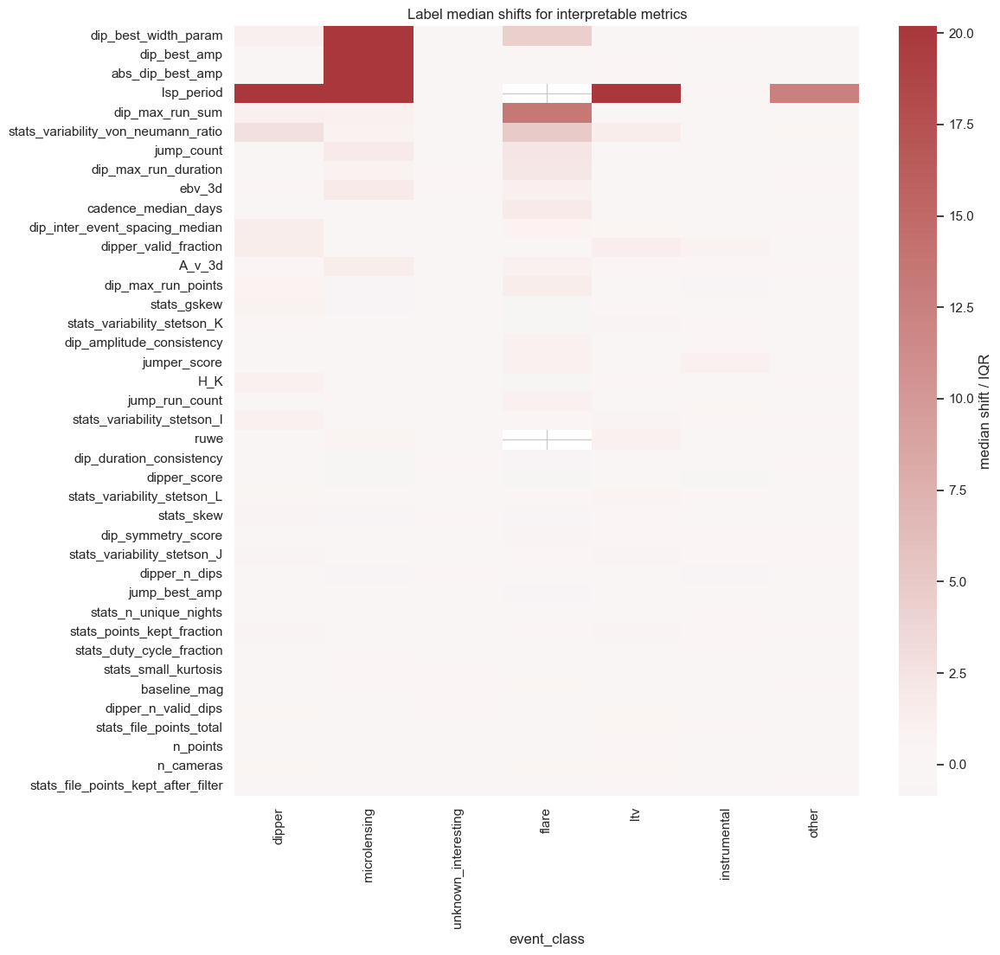

event_class,dipper,microlensing,unknown_interesting,flare,ltv,instrumental,other
dip_best_width_param,1.170727,576.157625,-5.870011e-02,4.547724,-0.068408,1.144092e-01,-3.309532e-02
dip_best_amp,-0.160682,124.273156,2.230655e-02,-0.420386,0.086477,-1.047326e-02,5.808219e-03
abs_dip_best_amp,-0.160682,124.273156,2.230655e-02,-0.420386,0.086477,-1.047326e-02,5.808219e-03
lsp_period,43.552116,28.036632,-6.083824e-02,NaN,61.009452,7.226784e-02,1.253651e+01
dip_max_run_sum,1.250000,1.000000,-1.544259e-08,13.499999,-0.500000,2.135069e-08,6.552346e-08
stats_variability_von_neumann_ratio,2.724839,0.900368,-7.252982e-02,4.981432,1.578122,7.485850e-03,4.290097e-01
jump_count,-0.095238,1.880952,-9.523810e-02,2.380952,-0.095238,2.380952e-01,0.000000e+00
dip_max_run_duration,-0.220847,0.867128,5.160108e-02,2.166528,-0.469725,-1.816325e-01,5.477853e-02
ebv_3d,0.257971,1.841637,1.344097e-01,1.140783,-0.254362,-1.847608e-01,2.699373e-01
cadence_median_days,-0.027370,0.007324,8.593932e-03,1.838822,-0.074188,-6.048320e-03,-3.559868e-02


In [27]:
profile_features = [c for c in INTERPRETABLE_FEATURES if analysis[c].notna().sum() >= 25]
profile = analysis.groupby("event_class")[profile_features].median(numeric_only=True).T
profile = profile[[c for c in LABEL_ORDER if c in profile.columns]]
all_medians = analysis[profile_features].median(numeric_only=True)
all_iqr = analysis[profile_features].quantile(0.75, numeric_only=True) - analysis[profile_features].quantile(0.25, numeric_only=True)
all_iqr = all_iqr.replace(0, np.nan)
z_profile = profile.sub(all_medians, axis=0).div(all_iqr, axis=0).replace([np.inf, -np.inf], np.nan)

show_features = z_profile.abs().max(axis=1).sort_values(ascending=False).head(40).index.tolist()
fig, ax = plt.subplots(figsize=(12, max(8, 0.28 * len(show_features))))
sns.heatmap(z_profile.loc[show_features], cmap="vlag", center=0, robust=True, ax=ax, cbar_kws={"label": "median shift / IQR"})
ax.set_title("Label median shifts for interpretable metrics")
fig.tight_layout()
plt.show()

display(z_profile.loc[show_features])


## Numeric Univariate Tests For Planned Contrasts

Each contrast computes Mann-Whitney U, KS, Cliff's delta, Cohen's d, and FDR q-values. The `positive` side is the first label set in each contrast.


In [28]:
def bh_fdr(p_values: pd.Series) -> pd.Series:
    p = pd.to_numeric(p_values, errors="coerce")
    out = pd.Series(np.nan, index=p.index, dtype=float)
    valid = p.dropna().sort_values()
    if valid.empty:
        return out
    m = len(valid)
    ranks = np.arange(1, m + 1)
    q = valid.to_numpy() * m / ranks
    q = np.minimum.accumulate(q[::-1])[::-1]
    out.loc[valid.index] = np.clip(q, 0, 1)
    return out

def cliffs_delta(x: np.ndarray, y: np.ndarray) -> float:
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    x = x[np.isfinite(x)]
    y = y[np.isfinite(y)]
    if len(x) == 0 or len(y) == 0:
        return np.nan
    diff = x[:, None] - y[None, :]
    return float((np.sum(diff > 0) - np.sum(diff < 0)) / diff.size)

def cohen_d(x: np.ndarray, y: np.ndarray) -> float:
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    x = x[np.isfinite(x)]
    y = y[np.isfinite(y)]
    if len(x) < 2 or len(y) < 2:
        return np.nan
    pooled = math.sqrt(((len(x) - 1) * np.var(x, ddof=1) + (len(y) - 1) * np.var(y, ddof=1)) / (len(x) + len(y) - 2))
    if pooled == 0:
        return np.nan
    return float((np.mean(x) - np.mean(y)) / pooled)

CONTRASTS = {
    "dipper_vs_instrumental": (["dipper"], ["instrumental"]),
    "dipper_vs_other": (["dipper"], ["other"]),
    "microlensing_vs_instrumental": (["microlensing"], ["instrumental"]),
    "microlensing_vs_other": (["microlensing"], ["other"]),
    "unknown_interesting_vs_instrumental": (["unknown_interesting"], ["instrumental"]),
    "interesting_vs_background": (INTERESTING_LABELS, BACKGROUND_LABELS),
    "rare_interesting_vs_background": (RARE_INTERESTING_LABELS, BACKGROUND_LABELS),
}

def numeric_contrast_tests(name: str, positive_labels: list[str], negative_labels: list[str], *, min_n: int = 8) -> pd.DataFrame:
    subset = analysis.loc[analysis["event_class"].isin(positive_labels + negative_labels)].copy()
    is_pos = subset["event_class"].isin(positive_labels)
    rows = []
    for feature in numeric_cols:
        x = subset.loc[is_pos, feature].dropna().astype(float)
        y = subset.loc[~is_pos, feature].dropna().astype(float)
        if len(x) < min_n or len(y) < min_n or x.nunique() < 2 or y.nunique() < 2:
            continue
        try:
            mwu_p = stats.mannwhitneyu(x, y, alternative="two-sided").pvalue
        except Exception:
            mwu_p = np.nan
        try:
            ks_p = stats.ks_2samp(x, y).pvalue
        except Exception:
            ks_p = np.nan
        rows.append({
            "contrast": name,
            "feature": feature,
            "n_positive": len(x),
            "n_negative": len(y),
            "positive_median": x.median(),
            "negative_median": y.median(),
            "median_diff_pos_minus_neg": x.median() - y.median(),
            "positive_q25": x.quantile(0.25),
            "positive_q75": x.quantile(0.75),
            "negative_q25": y.quantile(0.25),
            "negative_q75": y.quantile(0.75),
            "mwu_p": mwu_p,
            "ks_p": ks_p,
            "cliffs_delta": cliffs_delta(x.to_numpy(), y.to_numpy()),
            "cohen_d": cohen_d(x.to_numpy(), y.to_numpy()),
            "positive_missing_frac": 1 - len(x) / max(is_pos.sum(), 1),
            "negative_missing_frac": 1 - len(y) / max((~is_pos).sum(), 1),
        })
    result = pd.DataFrame(rows)
    if not result.empty:
        result["mwu_q"] = bh_fdr(result["mwu_p"])
        result["ks_q"] = bh_fdr(result["ks_p"])
        result["abs_cliffs_delta"] = result["cliffs_delta"].abs()
        result["abs_cohen_d"] = result["cohen_d"].abs()
        result = result.sort_values(["mwu_q", "abs_cliffs_delta"], ascending=[True, False])
    return result

test_tables = {name: numeric_contrast_tests(name, pos, neg) for name, (pos, neg) in CONTRASTS.items()}
for name, table in test_tables.items():
    display(Markdown(f"### {name}"))
    display(table.head(30))

all_numeric_tests = pd.concat([t for t in test_tables.values() if not t.empty], ignore_index=True)


### dipper_vs_instrumental

,contrast,feature,n_positive,n_negative,positive_median,negative_median,median_diff_pos_minus_neg,positive_q25,positive_q75,negative_q25,negative_q75,mwu_p,ks_p,cliffs_delta,cohen_d,positive_missing_frac,negative_missing_frac,mwu_q,ks_q,abs_cliffs_delta,abs_cohen_d
6,dipper_vs_instrumental,dip_best_delta_bic,19,404,3.954548e+01,0.000000e+00,3.954548e+01,2.435728e+01,5.583436e+01,0.000000e+00,0.000000,4.556107e-23,6.058383e-15,0.878843,3.336230,0.0,0.000000,4.419424e-21,2.938316e-13,0.878843,3.336230
188,dipper_vs_instrumental,abs_dip_best_delta_bic,19,404,3.954548e+01,0.000000e+00,3.954548e+01,2.435728e+01,5.583436e+01,0.000000e+00,0.000000,4.556107e-23,6.058383e-15,0.878843,3.336230,0.0,0.000000,4.419424e-21,2.938316e-13,0.878843,3.336230
28,dipper_vs_instrumental,jump_trigger_max,19,404,9.995028e-01,1.000000e+00,-4.972061e-04,9.696605e-01,1.000000e+00,1.000000e+00,1.000000,9.464146e-16,2.472232e-10,-0.759510,-1.364026,0.0,0.000000,4.590111e-14,2.997581e-09,0.759510,1.364026
29,dipper_vs_instrumental,jump_max_event_prob,19,404,9.995028e-01,1.000000e+00,-4.972061e-04,9.696605e-01,1.000000e+00,1.000000e+00,1.000000,9.464146e-16,2.472232e-10,-0.759510,-1.364026,0.0,0.000000,4.590111e-14,2.997581e-09,0.759510,1.364026
115,dipper_vs_instrumental,stats_variability_von_neumann_ratio,19,404,1.624373e+00,5.968097e-01,1.027563e+00,1.254381e+00,3.856057e+00,5.523475e-01,0.693817,9.453298e-13,1.128257e-21,0.968734,2.167910,0.0,0.000000,3.099548e-11,1.094409e-19,0.968734,2.167910
117,dipper_vs_instrumental,stats_variability_lag1_autocorr,19,404,6.921857e-01,1.607262e-01,5.314594e-01,6.013666e-01,8.701845e-01,9.338082e-02,0.277567,9.586232e-13,1.128257e-21,0.968473,3.444479,0.0,0.000000,3.099548e-11,1.094409e-19,0.968473,3.444479
23,dipper_vs_instrumental,jump_significant,19,404,0.000000e+00,1.000000e+00,-1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000,3.457355e-12,2.416676e-08,-0.663887,-1.734250,0.0,0.000000,9.581811e-11,1.875341e-07,0.663887,1.734250
135,dipper_vs_instrumental,stats_con,19,404,2.100000e+01,1.000000e+00,2.000000e+01,9.000000e+00,4.500000e+01,0.000000e+00,2.250000,1.451033e-11,1.503083e-12,0.887051,3.233996,0.0,0.000000,3.518754e-10,3.239980e-11,0.887051,3.233996
152,dipper_vs_instrumental,stats_sf_ml_gamma,19,404,2.059603e-01,4.422324e-02,1.617371e-01,1.570950e-01,2.481787e-01,1.979694e-02,0.079376,2.845407e-11,2.368022e-14,0.903075,3.114325,0.0,0.000000,6.133433e-10,9.187924e-13,0.903075,3.114325
178,dipper_vs_instrumental,stats_psi_cs,19,404,2.679202e-01,1.331085e-01,1.348116e-01,2.404005e-01,3.332058e-01,9.831247e-02,0.182473,6.596932e-11,1.187117e-12,0.886139,2.336358,0.0,0.000000,1.163459e-09,3.239980e-11,0.886139,2.336358


### dipper_vs_other

,contrast,feature,n_positive,n_negative,positive_median,negative_median,median_diff_pos_minus_neg,positive_q25,positive_q75,negative_q25,negative_q75,mwu_p,ks_p,cliffs_delta,cohen_d,positive_missing_frac,negative_missing_frac,mwu_q,ks_q,abs_cliffs_delta,abs_cohen_d
6,dipper_vs_other,dip_best_delta_bic,19,96,39.545482,0.000000,39.545482,24.357281,55.834357,0.000000,0.000000,2.905361e-10,2.065487e-09,0.774671,1.669634,0.000000,0.000000,2.818200e-08,2.003523e-07,0.774671,1.669634
188,dipper_vs_other,abs_dip_best_delta_bic,19,96,39.545482,0.000000,39.545482,24.357281,55.834357,0.000000,0.000000,2.905361e-10,2.065487e-09,0.774671,1.669634,0.000000,0.000000,2.818200e-08,2.003523e-07,0.774671,1.669634
25,dipper_vs_other,jump_bayes_factor,19,96,28.102262,647.628526,-619.526265,15.008924,126.825527,231.378751,1816.495905,1.324497e-07,1.621516e-07,-0.768640,-0.276108,0.000000,0.000000,8.565079e-06,6.291481e-06,0.768640,0.276108
139,dipper_vs_other,stats_gskew,19,96,0.188435,0.006604,0.181832,0.139445,0.277351,-0.307987,0.073415,2.437259e-07,1.619699e-08,0.752193,1.264535,0.000000,0.000000,1.182071e-05,1.047405e-06,0.752193,1.264535
150,dipper_vs_other,stats_rcs,19,96,0.278901,0.126651,0.152250,0.202768,0.333206,0.070229,0.178256,3.634839e-07,1.661596e-06,0.741228,1.597031,0.000000,0.000000,1.410317e-05,4.604996e-05,0.741228,1.597031
76,dipper_vs_other,vetting_likely_known,19,96,0.000000,1.000000,-1.000000,0.000000,0.500000,1.000000,1.000000,5.819317e-07,4.090545e-05,-0.559759,-1.415387,0.000000,0.000000,1.881579e-05,7.214234e-04,0.559759,1.415387
132,dipper_vs_other,stats_trend_r2,19,96,0.186420,0.014388,0.172032,0.068695,0.366582,0.003152,0.056676,2.380175e-06,4.266917e-06,0.687500,1.554910,0.000000,0.000000,6.596485e-05,1.034727e-04,0.687500,1.554910
146,dipper_vs_other,stats_skew,19,96,1.004998,0.177814,0.827184,0.785024,1.196957,-1.236620,0.620643,3.696369e-06,1.365734e-07,0.674342,1.152386,0.000000,0.000000,8.963694e-05,6.291481e-06,0.674342,1.152386
191,dipper_vs_other,dipper_valid_fraction,18,52,0.432861,0.142652,0.290209,0.287485,0.524454,0.059465,0.191986,1.180830e-05,1.070741e-06,0.697650,1.465183,0.052632,0.458333,2.545345e-04,3.462064e-05,0.697650,1.465183
17,dipper_vs_other,dip_max_run_points,19,96,6.000000,2.000000,4.000000,3.000000,9.500000,0.000000,4.000000,2.432802e-05,6.547050e-04,0.594298,1.241164,0.000000,0.000000,4.719636e-04,5.117822e-03,0.594298,1.241164


### microlensing_vs_instrumental

,contrast,feature,n_positive,n_negative,positive_median,negative_median,median_diff_pos_minus_neg,positive_q25,positive_q75,negative_q25,negative_q75,mwu_p,ks_p,cliffs_delta,cohen_d,positive_missing_frac,negative_missing_frac,mwu_q,ks_q,abs_cliffs_delta,abs_cohen_d
17,microlensing_vs_instrumental,jump_best_delta_bic,34,404,96.054912,0.000000,96.054912,44.841499,174.223152,0.000000,0.000000,7.549821e-31,5.081090e-28,0.967676,4.076038,0.0,0.000000,1.449566e-28,9.755692e-26,0.967676,4.076038
181,microlensing_vs_instrumental,stats_iar_phi,34,404,0.999955,0.996867,0.003088,0.999901,0.999989,0.982674,0.999254,5.905097e-19,1.029484e-23,0.918026,0.379178,0.0,0.000000,3.932353e-17,6.588695e-22,0.918026,0.379178
124,microlensing_vs_instrumental,stats_variability_string_length_resid_mean_step,34,404,0.017927,0.053341,-0.035414,0.016011,0.021179,0.032605,0.084383,6.144301e-19,4.249988e-24,-0.917589,-0.578633,0.0,0.000000,3.932353e-17,4.079988e-22,0.917589,0.578633
73,microlensing_vs_instrumental,vetting_likely_known,34,404,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,2.618626e-18,4.829806e-04,0.355125,1.713393,0.0,0.000000,1.256941e-16,1.220161e-03,0.355125,1.713393
28,microlensing_vs_instrumental,jump_max_run_points,34,404,31.000000,3.000000,28.000000,15.000000,53.500000,2.000000,5.000000,5.007950e-18,5.982676e-18,0.883809,3.728445,0.0,0.000000,1.923053e-16,2.297348e-16,0.883809,3.728445
156,microlensing_vs_instrumental,stats_harmonics_reduced_chi2,34,404,3.229895,28.914767,-25.684871,2.821554,5.248249,10.871856,70.766505,3.868524e-17,5.447085e-18,-0.868812,-0.284348,0.0,0.000000,1.237928e-15,2.297348e-16,0.868812,0.284348
176,microlensing_vs_instrumental,stats_harmonics_mse,34,404,0.000364,0.002946,-0.002582,0.000278,0.000562,0.001165,0.007453,8.032147e-17,1.422873e-17,-0.859930,-0.212117,0.0,0.000000,2.203103e-15,4.553193e-16,0.859930,0.212117
30,microlensing_vs_instrumental,jump_max_run_sum,34,332,30.999999,4.000000,26.999999,14.999999,53.499999,2.000000,7.000000,1.519512e-16,1.449371e-16,0.857991,3.411852,0.0,0.178218,3.646828e-15,3.975418e-15,0.857991,3.411852
108,microlensing_vs_instrumental,stats_clipped_std_mag_3sigma_about_median,34,404,0.017603,0.046669,-0.029066,0.015888,0.022881,0.031669,0.078281,6.173576e-15,2.686667e-15,-0.805183,-0.502300,0.0,0.000000,1.317030e-13,5.158401e-14,0.805183,0.502300
32,microlensing_vs_instrumental,jump_max_run_cameras,34,404,3.000000,2.000000,1.000000,2.000000,4.000000,2.000000,2.000000,9.877073e-15,1.672375e-09,0.667807,1.808079,0.0,0.000000,1.896398e-13,9.444002e-09,0.667807,1.808079


### microlensing_vs_other

,contrast,feature,n_positive,n_negative,positive_median,negative_median,median_diff_pos_minus_neg,positive_q25,positive_q75,negative_q25,negative_q75,mwu_p,ks_p,cliffs_delta,cohen_d,positive_missing_frac,negative_missing_frac,mwu_q,ks_q,abs_cliffs_delta,abs_cohen_d
28,microlensing_vs_other,jump_max_run_points,34,96,31.000000,2.000000,29.000000,15.000000,53.500000,0.000000,11.250000,5.567184e-10,6.976861e-09,0.704044,1.102932,0.000000,0.000000,1.074466e-07,4.488447e-07,0.704044,1.102932
17,microlensing_vs_other,jump_best_delta_bic,34,96,96.054912,0.000000,96.054912,44.841499,174.223152,0.000000,52.033073,3.032271e-08,1.020366e-08,0.622549,0.664304,0.000000,0.000000,2.926142e-06,4.923268e-07,0.622549,0.664304
44,microlensing_vs_other,jumper_n_jumps,34,96,88.500000,17.000000,71.500000,56.500000,114.750000,0.000000,70.250000,8.021596e-08,1.627455e-08,0.609681,0.920701,0.000000,0.000000,5.160560e-06,5.234982e-07,0.609681,0.920701
32,microlensing_vs_other,jump_max_run_cameras,34,96,3.000000,2.000000,1.000000,2.000000,4.000000,0.000000,2.000000,1.730898e-07,1.501677e-05,0.581189,1.006830,0.000000,0.000000,8.351581e-06,9.660788e-05,0.581189,1.006830
7,microlensing_vs_other,dip_bayes_factor,34,96,160.715772,1008.410293,-847.694521,94.124266,269.990190,331.611637,3631.468253,2.302230e-07,2.353307e-09,-0.598652,-0.450112,0.000000,0.000000,8.886608e-06,2.851208e-07,0.598652,0.450112
29,microlensing_vs_other,jump_max_run_duration,34,53,101.320220,31.949820,69.370400,55.633707,163.465800,6.992440,55.855790,2.926953e-07,4.170560e-07,0.654828,1.280724,0.000000,0.447917,9.415033e-06,8.049180e-06,0.654828,1.280724
0,microlensing_vs_other,catalog_match,34,96,0.000000,1.000000,-1.000000,0.000000,0.000000,0.000000,1.000000,4.140273e-07,1.895868e-06,-0.507353,-1.125079,0.000000,0.000000,9.988408e-06,2.032792e-05,0.507353,1.125079
4,microlensing_vs_other,lsp_is_significant,34,96,0.000000,1.000000,-1.000000,0.000000,0.000000,0.000000,1.000000,4.140273e-07,1.895868e-06,-0.507353,-1.125079,0.000000,0.000000,9.988408e-06,2.032792e-05,0.507353,1.125079
1,microlensing_vs_other,period_n_sources,34,96,0.000000,1.000000,-1.000000,0.000000,0.000000,0.000000,1.000000,4.918512e-07,1.895868e-06,-0.518382,-1.062926,0.000000,0.000000,1.054748e-05,2.032792e-05,0.518382,1.062926
36,microlensing_vs_other,jump_inter_event_spacing_median,20,36,26.339115,308.532870,-282.193755,15.901486,70.847185,192.789258,436.813935,1.248711e-06,2.094136e-06,-0.788889,-1.121254,0.411765,0.625000,2.178346e-05,2.127201e-05,0.788889,1.121254


### unknown_interesting_vs_instrumental

,contrast,feature,n_positive,n_negative,positive_median,negative_median,median_diff_pos_minus_neg,positive_q25,positive_q75,negative_q25,negative_q75,mwu_p,ks_p,cliffs_delta,cohen_d,positive_missing_frac,negative_missing_frac,mwu_q,ks_q,abs_cliffs_delta,abs_cohen_d
32,unknown_interesting_vs_instrumental,jump_best_p,776,404,0.272773,0.045545,0.227227,0.136436,0.500000,0.045545,0.045545,9.128628e-111,1.946679e-119,0.778561,1.529727,0.000000,0.000000,2.017427e-108,2.637098e-117,0.778561,1.529727
57,unknown_interesting_vs_instrumental,jumper_score,776,403,0.000000,19.897588,-19.897588,0.000000,0.000000,18.049668,20.960483,1.342649e-98,2.386514e-119,-0.695102,-1.953310,0.000000,0.002475,1.483627e-96,2.637098e-117,0.695102,1.953310
58,unknown_interesting_vs_instrumental,jumper_n_jumps,776,404,0.000000,136.000000,-136.000000,0.000000,28.000000,78.750000,191.000000,2.446792e-97,2.781862e-112,-0.689860,-1.595110,0.000000,0.000000,1.802470e-95,2.049305e-110,0.689860,1.595110
59,unknown_interesting_vs_instrumental,jumper_n_valid_jumps,776,404,0.000000,33.000000,-33.000000,0.000000,13.000000,16.750000,48.000000,2.264217e-82,2.059770e-74,-0.633443,-1.263178,0.000000,0.000000,1.250980e-80,9.104185e-73,0.633443,1.263178
206,unknown_interesting_vs_instrumental,stats_iar_phi,776,404,0.999839,0.996867,0.002972,0.999404,0.999948,0.982674,0.999254,9.988648e-81,1.302724e-76,0.674160,0.483662,0.000000,0.000000,4.414983e-79,7.197551e-75,0.674160,0.483662
148,unknown_interesting_vs_instrumental,stats_variability_string_length_resid_mean_step,776,404,0.022785,0.053341,-0.030556,0.018407,0.031988,0.032605,0.084383,1.504763e-76,1.095057e-66,-0.656170,-0.712484,0.000000,0.000000,5.542544e-75,3.025095e-65,0.656170,0.712484
13,unknown_interesting_vs_instrumental,dip_bayes_factor,776,404,2571.820657,367.434245,2204.386413,1015.006311,5666.878775,68.808903,997.934226,8.091178e-72,4.987687e-64,0.635048,0.668250,0.000000,0.000000,2.554501e-70,1.102279e-62,0.635048,0.668250
181,unknown_interesting_vs_instrumental,stats_harmonics_reduced_chi2,776,404,5.055950,28.914767,-23.858817,3.069340,12.932727,10.871856,70.766505,1.269509e-67,1.608952e-57,-0.615711,-0.402799,0.000000,0.000000,3.507019e-66,1.975435e-56,0.615711,0.402799
201,unknown_interesting_vs_instrumental,stats_harmonics_mse,776,404,0.000537,0.002946,-0.002409,0.000315,0.001368,0.001165,0.007453,1.349070e-66,3.942269e-58,-0.610889,-0.319708,0.000000,0.000000,3.312717e-65,5.124950e-57,0.610889,0.319708
130,unknown_interesting_vs_instrumental,stats_clipped_std_mag_3sigma_about_median,776,404,0.021617,0.046669,-0.025051,0.016049,0.035527,0.031669,0.078281,5.473845e-62,2.107688e-53,-0.588752,-0.585145,0.000000,0.000000,1.209720e-60,2.451574e-52,0.588752,0.585145


### interesting_vs_background

,contrast,feature,n_positive,n_negative,positive_median,negative_median,median_diff_pos_minus_neg,positive_q25,positive_q75,negative_q25,negative_q75,mwu_p,ks_p,cliffs_delta,cohen_d,positive_missing_frac,negative_missing_frac,mwu_q,ks_q,abs_cliffs_delta,abs_cohen_d
35,interesting_vs_background,jump_best_p,868,500,0.250050,0.045545,0.204505,0.090991,0.454555,0.045545,0.090991,5.166133e-82,2.556647e-82,0.610889,1.092327,0.0,0.000,1.188211e-79,1.960096e-80,0.610889,1.092327
60,interesting_vs_background,jumper_score,868,499,0.000000,19.495462,-19.495462,0.000000,0.000000,0.000000,20.828953,1.781404e-81,7.848431e-95,-0.580354,-1.462304,0.0,0.002,2.048614e-79,1.805139e-92,0.580354,1.462304
61,interesting_vs_background,jumper_n_jumps,868,500,0.000000,119.000000,-119.000000,0.000000,36.250000,20.750000,182.250000,9.156542e-81,5.328646e-85,-0.577297,-1.218935,0.0,0.000,7.020016e-79,6.127943e-83,0.577297,1.218935
62,interesting_vs_background,jumper_n_valid_jumps,868,500,0.000000,29.000000,-29.000000,0.000000,13.000000,7.750000,46.000000,5.189394e-73,4.348759e-68,-0.548182,-1.052930,0.0,0.000,2.983901e-71,2.500536e-66,0.548182,1.052930
215,interesting_vs_background,stats_iar_phi,868,500,0.999843,0.997823,0.002020,0.999407,0.999951,0.986853,0.999537,1.031119e-69,2.470010e-66,0.572187,0.393758,0.0,0.000,4.743149e-68,1.136205e-64,0.572187,0.393758
157,interesting_vs_background,stats_variability_string_length_resid_mean_step,868,500,0.022777,0.046648,-0.023871,0.018267,0.032041,0.028826,0.080579,1.542184e-67,6.186400e-59,-0.563055,-0.643075,0.0,0.000,5.911705e-66,1.778590e-57,0.563055,0.643075
190,interesting_vs_background,stats_harmonics_reduced_chi2,868,500,5.117752,23.302017,-18.184265,3.076532,13.057403,9.613651,68.602309,3.386173e-64,8.134016e-54,-0.548548,-0.364248,0.0,0.000,1.112600e-62,2.078693e-52,0.548548,0.364248
210,interesting_vs_background,stats_harmonics_mse,868,500,0.000550,0.002452,-0.001902,0.000319,0.001362,0.001023,0.007271,2.980753e-63,1.908145e-53,-0.544378,-0.290320,0.0,0.000,8.569666e-62,4.388734e-52,0.544378,0.290320
137,interesting_vs_background,stats_clipped_std_mag_3sigma_about_median,868,500,0.022339,0.044320,-0.021981,0.016355,0.036787,0.028815,0.076939,1.050073e-54,2.554079e-44,-0.505092,-0.550343,0.0,0.000,2.683519e-53,2.937191e-43,0.505092,0.550343
130,interesting_vs_background,stats_photometry_robust_sigma_mag,868,500,0.022239,0.043737,-0.021498,0.016221,0.037065,0.028431,0.075631,4.653167e-52,1.877471e-41,-0.492293,-0.537628,0.0,0.000,9.729348e-51,1.877471e-40,0.492293,0.537628


### rare_interesting_vs_background

,contrast,feature,n_positive,n_negative,positive_median,negative_median,median_diff_pos_minus_neg,positive_q25,positive_q75,negative_q25,negative_q75,mwu_p,ks_p,cliffs_delta,cohen_d,positive_missing_frac,negative_missing_frac,mwu_q,ks_q,abs_cliffs_delta,abs_cohen_d
137,rare_interesting_vs_background,stats_variability_von_neumann_ratio,92,500,1.204741e+00,6.009908e-01,6.037498e-01,7.595163e-01,2.409029e+00,5.509145e-01,0.739821,4.967255e-24,2.594751e-22,0.662783,0.447000,0.000000,0.000,5.899296e-22,2.841253e-20,0.662783,0.447000
139,rare_interesting_vs_background,stats_variability_lag1_autocorr,92,500,5.844271e-01,1.671168e-01,4.173103e-01,3.410829e-01,7.923115e-01,9.099874e-02,0.323968,5.387485e-24,1.961264e-22,0.662261,1.336037,0.000000,0.000,5.899296e-22,2.841253e-20,0.662261,1.336037
172,rare_interesting_vs_background,stats_rcs,92,500,2.376889e-01,1.228908e-01,1.147981e-01,1.656218e-01,2.962792e-01,8.480830e-02,0.174527,3.082254e-23,7.490588e-19,0.650957,1.470521,0.000000,0.000,2.250045e-21,3.280877e-17,0.650957,1.470521
201,rare_interesting_vs_background,stats_psi_eta,92,500,9.505865e-01,1.686093e+00,-7.355061e-01,5.950583e-01,1.437783e+00,1.409738e+00,1.858389,9.614835e-23,1.111576e-19,-0.643478,-1.398064,0.000000,0.000,5.264122e-21,6.085876e-18,0.643478,1.398064
203,rare_interesting_vs_background,stats_gp_drw_tau,90,470,1.350555e+00,1.330517e-02,1.337250e+00,3.036829e-01,1.008933e+01,2.159363e-03,0.116152,5.568862e-20,7.198745e-22,0.608558,0.488838,0.021739,0.060,2.155738e-18,5.255084e-20,0.608558,0.488838
150,rare_interesting_vs_background,stats_variability_lomb_scargle_peak_power,92,500,2.909527e-01,8.341550e-02,2.075372e-01,1.343631e-01,4.491325e-01,3.954811e-02,0.166763,5.906132e-20,3.352616e-15,0.599565,1.206046,0.000000,0.000,2.155738e-18,6.674753e-14,0.599565,1.206046
200,rare_interesting_vs_background,stats_psi_cs,92,500,2.471184e-01,1.396759e-01,1.074425e-01,1.750966e-01,3.153636e-01,1.005753e-01,0.195206,1.207399e-19,8.017909e-18,0.594478,1.202596,0.000000,0.000,3.777433e-18,2.926537e-16,0.594478,1.202596
204,rare_interesting_vs_background,stats_iar_phi,92,500,9.998782e-01,9.978230e-01,2.055194e-03,9.994892e-01,9.999712e-01,9.868532e-01,0.999537,1.597372e-19,2.215992e-17,0.592457,0.234908,0.000000,0.000,4.372806e-18,6.932890e-16,0.592457,0.234908
147,rare_interesting_vs_background,stats_variability_string_length_resid_mean_step,92,500,2.240689e-02,4.664820e-02,-2.424131e-02,1.754015e-02,3.234505e-02,2.882591e-02,0.080579,2.483916e-18,1.588404e-14,-0.572478,-0.475967,0.000000,0.000,6.044196e-17,2.675850e-13,0.572478,0.475967
151,rare_interesting_vs_background,stats_variability_lomb_scargle_fap,92,500,1.090064e-74,9.526178e-16,-9.526178e-16,1.432042e-153,6.264460e-28,4.254507e-42,0.000029,2.073056e-17,1.519985e-13,-0.556522,-0.307977,0.000000,0.000,4.539994e-16,2.080479e-12,0.556522,0.307977


## Visualize Top Features By Contrast

Use these plots to connect statistical rankings to actual label distributions.


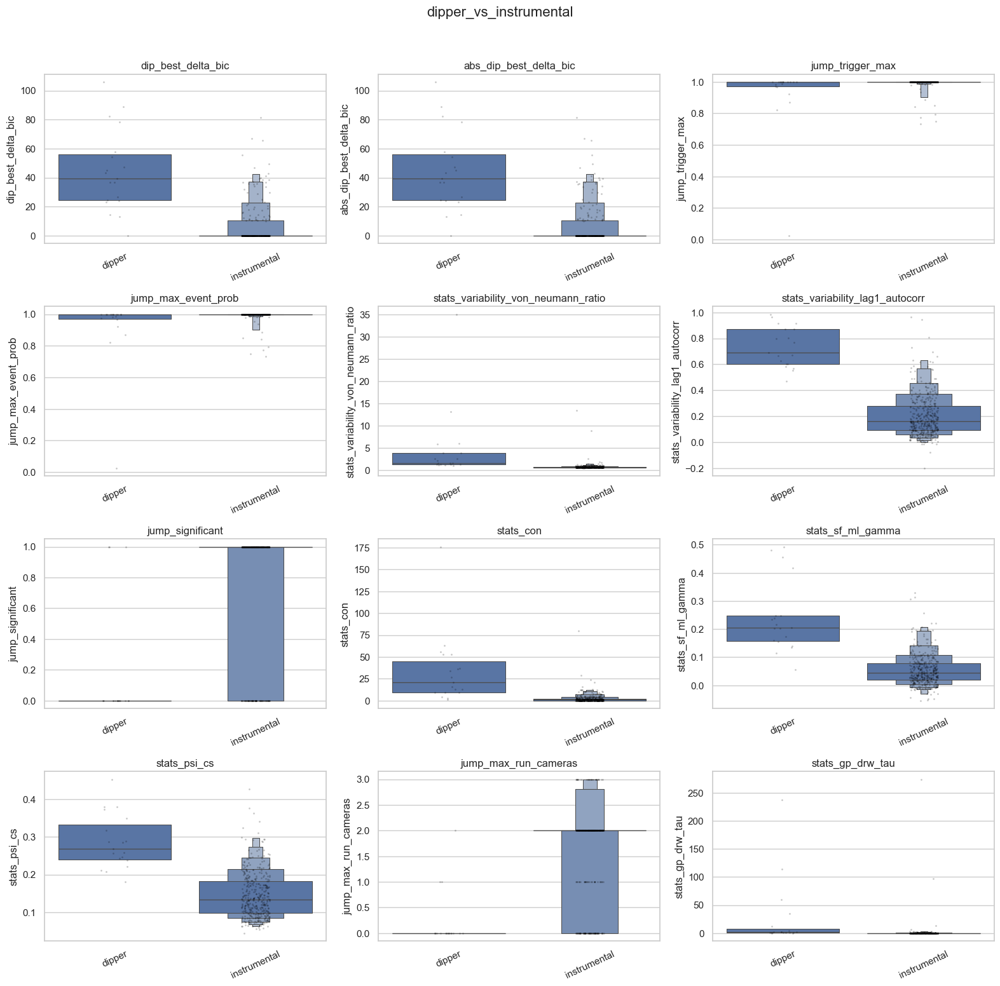

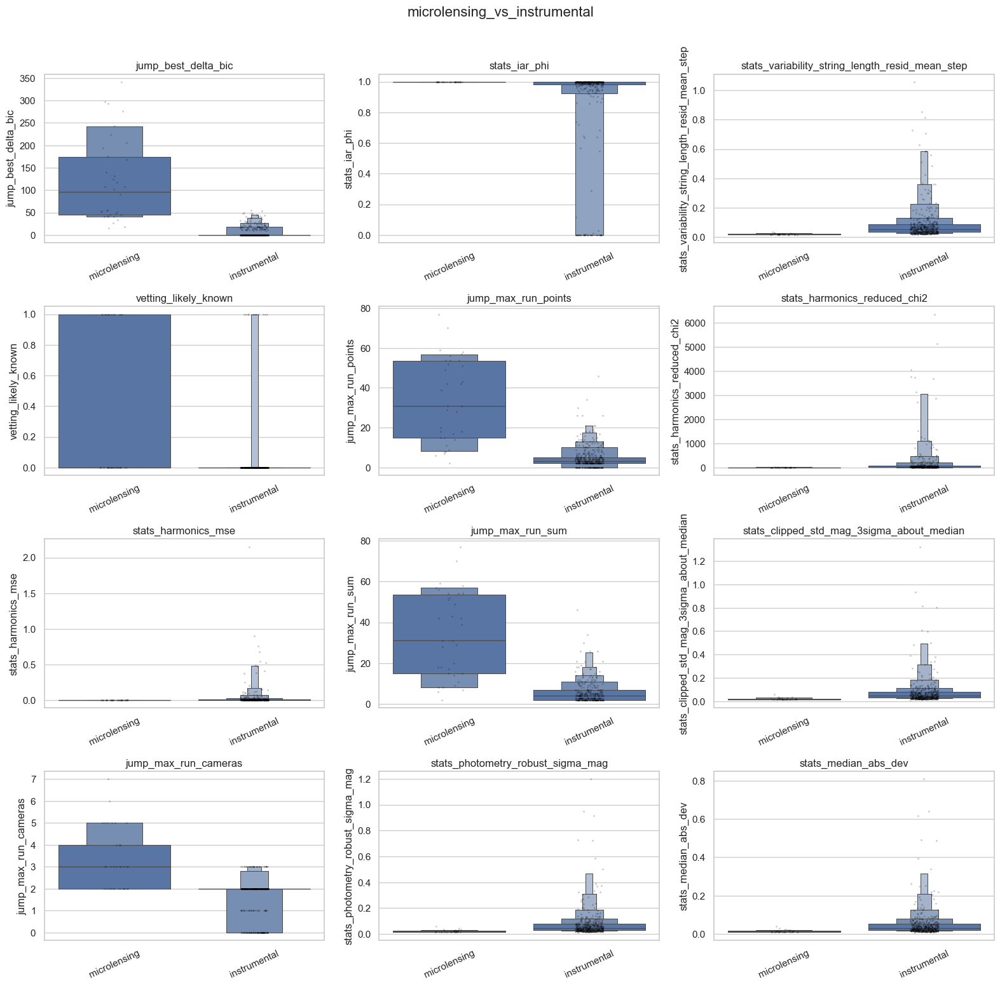

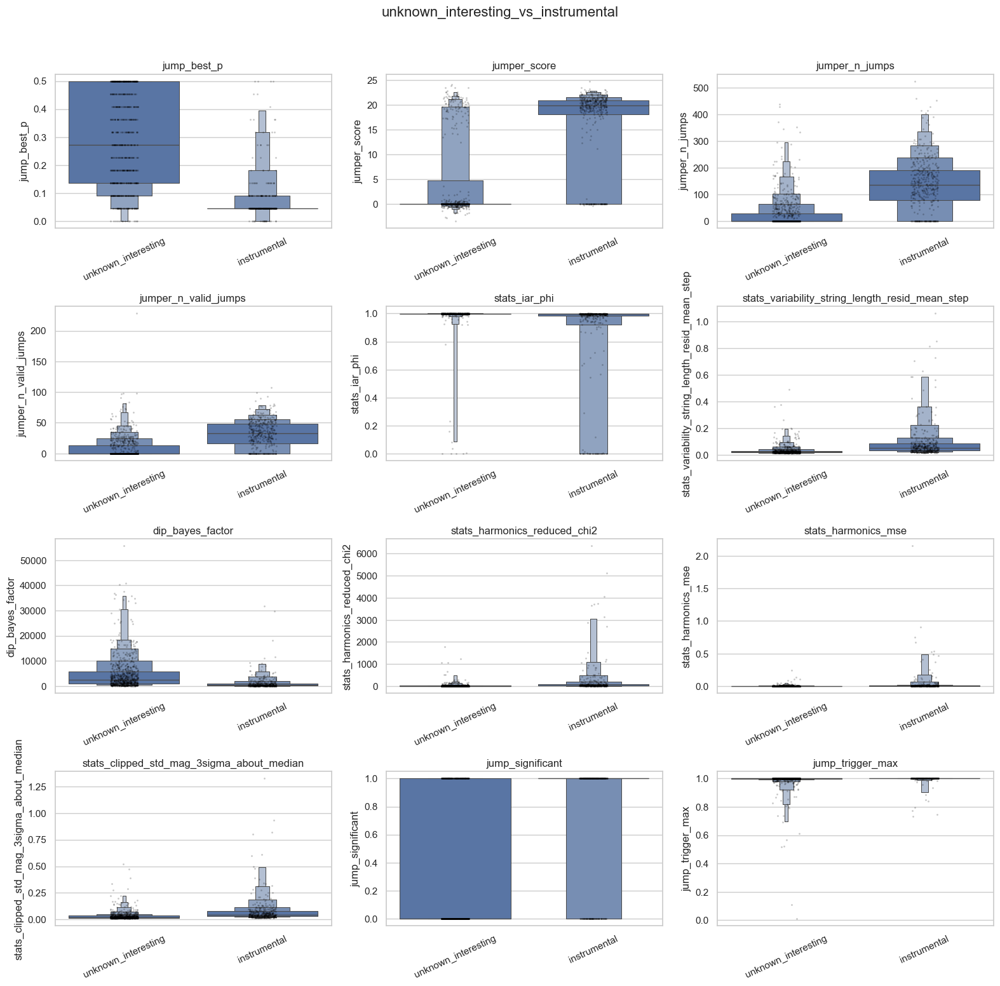

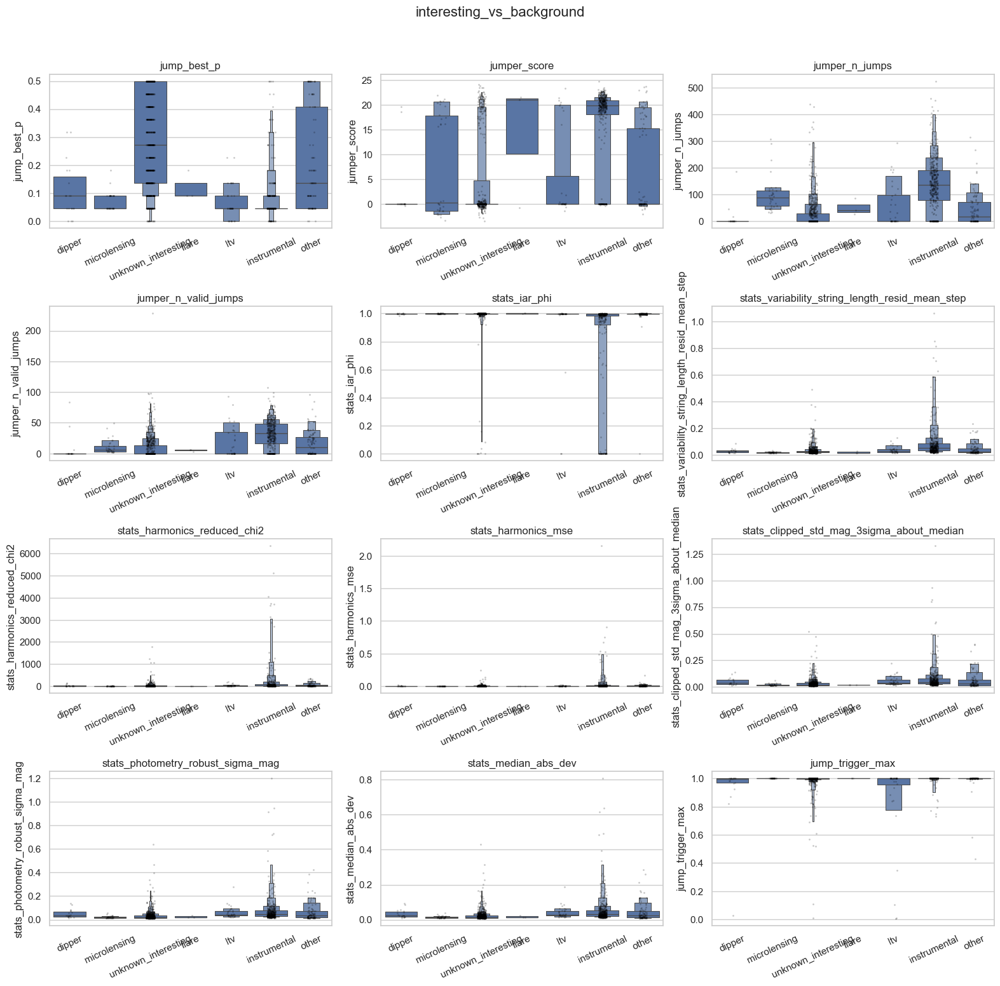

In [29]:
def plot_contrast_features(contrast_name: str, max_features: int = 12) -> None:
    table = test_tables.get(contrast_name)
    if table is None or table.empty:
        print(f"No table for {contrast_name}")
        return
    pos, neg = CONTRASTS[contrast_name]
    features = table.head(max_features)["feature"].tolist()
    subset = analysis.loc[analysis["event_class"].isin(pos + neg)].copy()
    label_order = pos + neg
    subset["event_class"] = pd.Categorical(subset["event_class"], label_order, ordered=True)
    ncols = 3
    nrows = math.ceil(len(features) / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(5.3 * ncols, 3.8 * nrows), squeeze=False)
    for ax, feature in zip(axes.ravel(), features):
        sns.boxenplot(data=subset, x="event_class", y=feature, order=label_order, ax=ax, showfliers=False)
        sns.stripplot(data=subset, x="event_class", y=feature, order=label_order, ax=ax, color="black", alpha=0.22, size=2)
        ax.set_xlabel("")
        ax.tick_params(axis="x", rotation=25)
        ax.set_title(feature)
    for ax in axes.ravel()[len(features):]:
        ax.axis("off")
    fig.suptitle(contrast_name, y=1.02, fontsize=16)
    fig.tight_layout()
    plt.show()

for contrast_name in ["dipper_vs_instrumental", "microlensing_vs_instrumental", "unknown_interesting_vs_instrumental", "interesting_vs_background"]:
    plot_contrast_features(contrast_name, max_features=12)


## All-Class Feature Grids

These use the same high-ranked features from the pairwise/aggregate tests, but plot every reviewed class on the x-axis. This is useful for checking whether a feature is truly dipper-specific, microlensing-specific, generally interesting, or just separating one class from instrumentals. Small classes such as `flare` should be read qualitatively.

/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, rotation=32, ha="right")
/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, rotation=32, ha="right")
/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, rotation=32, ha="right")
/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, rotation=32, ha="right")
/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fi

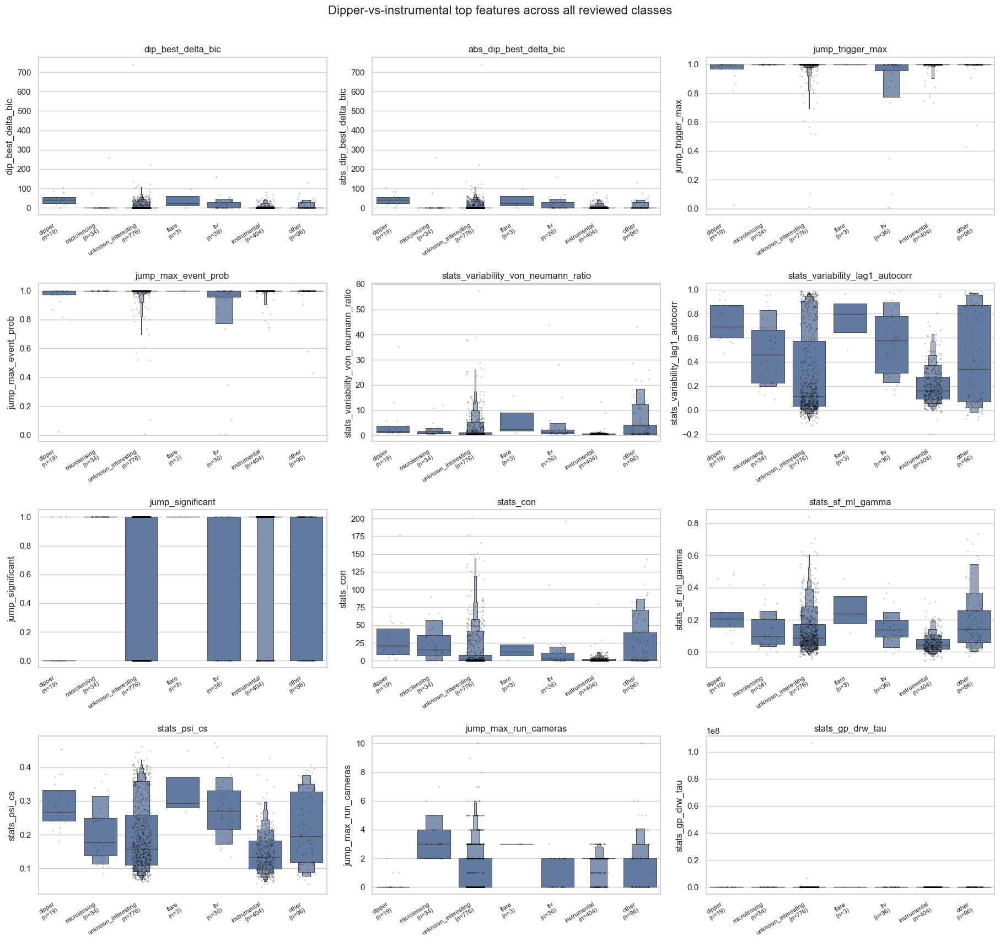

/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, rotation=32, ha="right")
/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, rotation=32, ha="right")
/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, rotation=32, ha="right")
/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, rotation=32, ha="right")
/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fi

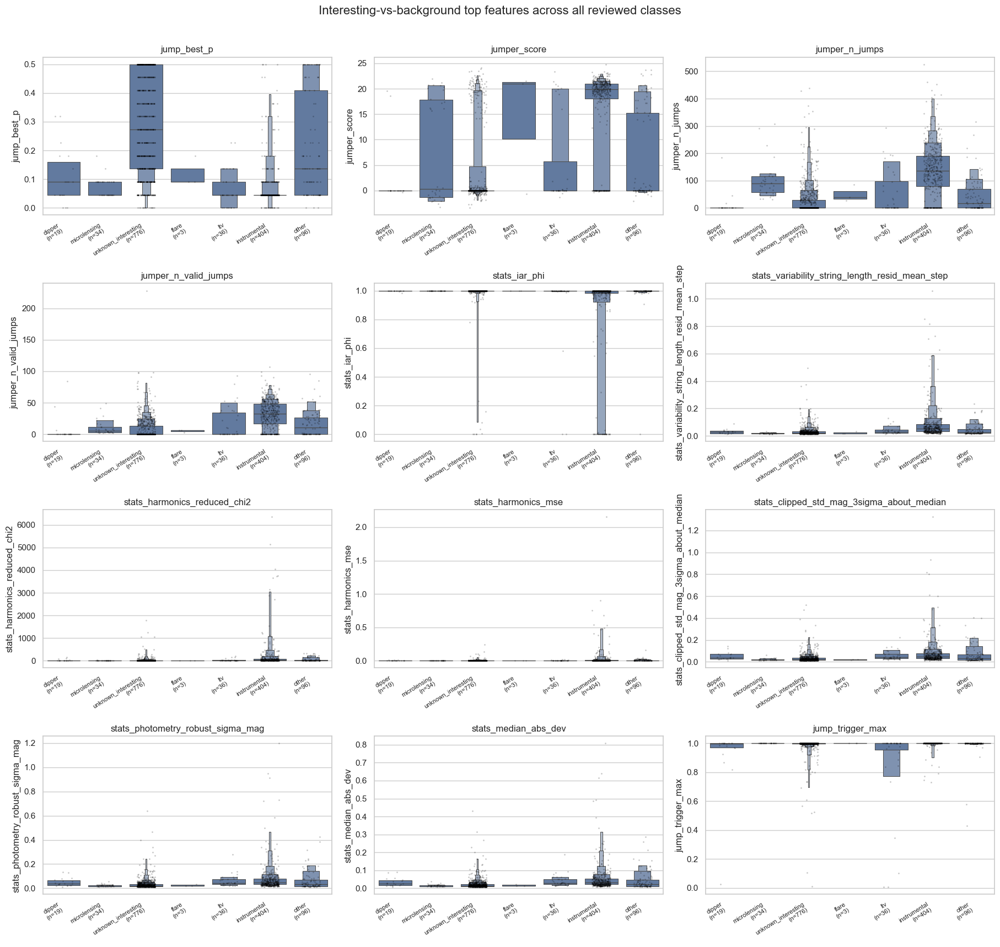

/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, rotation=32, ha="right")
/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, rotation=32, ha="right")
/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, rotation=32, ha="right")
/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_labels, rotation=32, ha="right")
/tmp/ipykernel_1894740/4176093875.py:65: UserWarning: set_ticklabels() should only be used with a fi

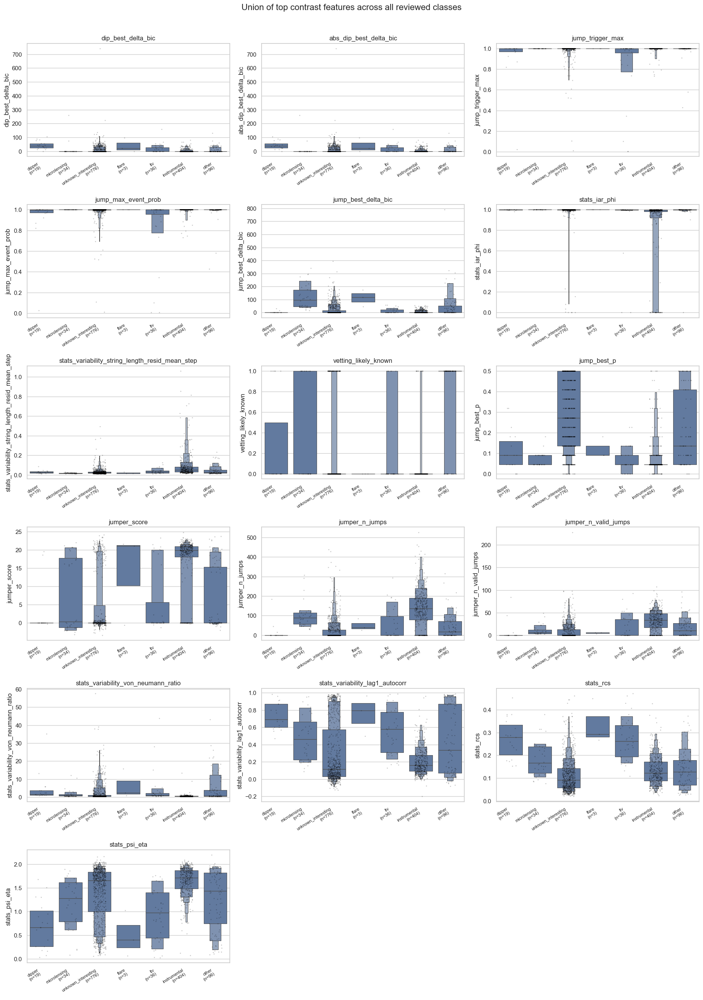

In [30]:
ALL_CLASS_ORDER = [label for label in LABEL_ORDER if label in set(analysis["event_class"].dropna())]


def _dedupe_features(features: list[str]) -> list[str]:
    out = []
    for feature in features:
        if feature in analysis.columns and feature not in out:
            out.append(feature)
    return out


def plot_all_class_feature_grid(
    features: list[str],
    *,
    title: str,
    max_features: int = 12,
    class_order: list[str] | None = None,
    show_points: bool = True,
) -> None:
    class_order = class_order or ALL_CLASS_ORDER
    features = _dedupe_features(list(features))[:max_features]
    if not features:
        print("No usable features to plot.")
        return

    plot_data = analysis.loc[analysis["event_class"].isin(class_order), ["event_class"] + features].copy()
    plot_data["event_class"] = pd.Categorical(plot_data["event_class"], class_order, ordered=True)

    counts = plot_data["event_class"].value_counts().reindex(class_order).fillna(0).astype(int)
    x_labels = [f"{label}\n(n={counts[label]:,})" for label in class_order]

    ncols = 3
    nrows = math.ceil(len(features) / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(6.1 * ncols, 4.25 * nrows), squeeze=False)

    for ax, feature in zip(axes.ravel(), features):
        feature_data = plot_data[["event_class", feature]].dropna().copy()
        if feature_data.empty:
            ax.set_title(f"{feature} (all missing)")
            ax.axis("off")
            continue
        sns.boxenplot(
            data=feature_data,
            x="event_class",
            y=feature,
            order=class_order,
            ax=ax,
            showfliers=False,
            color="#5878a9",
        )
        if show_points:
            sns.stripplot(
                data=feature_data,
                x="event_class",
                y=feature,
                order=class_order,
                ax=ax,
                color="black",
                alpha=0.22,
                size=2,
                jitter=0.22,
            )
        ax.set_title(feature)
        ax.set_xlabel("")
        ax.set_xticklabels(x_labels, rotation=32, ha="right")
        ax.tick_params(axis="x", labelsize=8)

    for ax in axes.ravel()[len(features):]:
        ax.axis("off")

    fig.suptitle(title, y=1.01, fontsize=16)
    fig.tight_layout()
    plt.show()


# Same idea as your dipper-vs-instrumental grid, but with every class shown.
dipper_top_features = test_tables["dipper_vs_instrumental"].head(12)["feature"].tolist()
plot_all_class_feature_grid(
    dipper_top_features,
    title="Dipper-vs-instrumental top features across all reviewed classes",
)

# Aggregate-interesting features can show whether unknown_interesting/ltv/microlensing share structure.
interesting_top_features = test_tables["interesting_vs_background"].head(12)["feature"].tolist()
plot_all_class_feature_grid(
    interesting_top_features,
    title="Interesting-vs-background top features across all reviewed classes",
)

# A compact union across several contrasts is often the most diagnostic all-class view.
contrast_feature_union = []
for contrast_name in [
    "dipper_vs_instrumental",
    "microlensing_vs_instrumental",
    "unknown_interesting_vs_instrumental",
    "rare_interesting_vs_background",
]:
    table = test_tables.get(contrast_name)
    if table is not None and not table.empty:
        contrast_feature_union.extend(table.head(4)["feature"].tolist())
plot_all_class_feature_grid(
    contrast_feature_union,
    title="Union of top contrast features across all reviewed classes",
    max_features=16,
)


## Categorical And Flag Association Tests

This scans low-cardinality flags/catalog fields for each contrast. Binary 2x2 tables get Fisher's exact test; all categorical tables get Cramer's V.


In [31]:
def cramers_v(table: pd.DataFrame) -> float:
    table = table.loc[table.sum(axis=1) > 0, table.sum(axis=0) > 0]
    if table.shape[0] < 2 or table.shape[1] < 2:
        return np.nan
    chi2 = stats.chi2_contingency(table, correction=False)[0]
    n = table.to_numpy().sum()
    r, k = table.shape
    return float(np.sqrt((chi2 / n) / max(min(k - 1, r - 1), 1)))

def categorical_contrast_tests(name: str, positive_labels: list[str], negative_labels: list[str]) -> pd.DataFrame:
    subset = analysis.loc[analysis["event_class"].isin(positive_labels + negative_labels)].copy()
    subset["contrast_label"] = np.where(subset["event_class"].isin(positive_labels), "positive", "negative")
    rows = []
    for col in low_card_cols:
        s = subset[["contrast_label", col]].dropna().copy()
        if s.empty or s[col].nunique(dropna=True) < 2:
            continue
        table = pd.crosstab(s["contrast_label"], s[col])
        fisher_p = np.nan
        odds_ratio = np.nan
        if table.shape == (2, 2):
            try:
                odds_ratio, fisher_p = stats.fisher_exact(table.to_numpy())
            except Exception:
                pass
        rows.append({
            "contrast": name,
            "feature": col,
            "n": int(table.to_numpy().sum()),
            "n_values": int(table.shape[1]),
            "cramers_v": cramers_v(table),
            "fisher_p_if_binary": fisher_p,
            "odds_ratio_if_binary": odds_ratio,
            "values": ", ".join(map(str, table.columns[:10])),
        })
    result = pd.DataFrame(rows)
    if not result.empty:
        result["fisher_q_if_binary"] = bh_fdr(result["fisher_p_if_binary"])
        result = result.sort_values(["fisher_q_if_binary", "cramers_v"], ascending=[True, False], na_position="last")
    return result

cat_tables = {name: categorical_contrast_tests(name, pos, neg) for name, (pos, neg) in CONTRASTS.items()}
for name, table in cat_tables.items():
    display(Markdown(f"### {name}"))
    display(table.head(30))

IMPORTANT_CATS = [
    "dip_significant", "dip_best_morph", "dip_is_single_event", "jump_significant", "jump_best_morph",
    "microlens_match", "microlens_catalog", "catalog_match", "catalog_source", "periodic_flag",
    "periodicity_is_significant", "lsp_is_significant", "pdm_is_significant", "ce_is_significant",
    "phase_plot_ready", "high_ruwe_flag", "high_pm_flag", "vetting_likely_known",
    "asassn_var_type", "gaia_var_class", "simbad_otype", "ztf_var_type", "tns_type", "alerce_lc_class",
    "trigger_mode", "trigger_type", "yso_class", "final_class",
]
IMPORTANT_CATS = [c for c in IMPORTANT_CATS if c in analysis.columns]
for col in IMPORTANT_CATS:
    display(Markdown(f"### {col}"))
    display(pd.crosstab(analysis["event_class"], analysis[col], margins=True, dropna=False))
    display(pd.crosstab(analysis["event_class"], analysis[col], normalize="index", dropna=False).round(3))


### dipper_vs_instrumental

,contrast,feature,n,n_values,cramers_v,fisher_p_if_binary,odds_ratio_if_binary,values,fisher_q_if_binary
6,dipper_vs_instrumental,vsx_class,6,2,1.000000,0.166667,0.000000,"INT:, VAR",0.500000
14,dipper_vs_instrumental,baseline_source,423,2,0.041382,0.371648,2.438272,"gp_sho, gp_sho,median_fallback",0.557471
11,dipper_vs_instrumental,gaia_var_flag,423,2,0.018328,1.000000,0.000000,"False, True",1.000000
3,dipper_vs_instrumental,dip_best_morph,423,4,0.449043,NaN,NaN,"gaussian, noise, none, skew_gaussian",NaN
4,dipper_vs_instrumental,jump_best_morph,423,4,0.341994,NaN,NaN,"fred, noise, none, paczynski",NaN
9,dipper_vs_instrumental,asassn_var_type,423,4,0.329061,NaN,NaN,", ROT:, VAR, YSO",NaN
12,dipper_vs_instrumental,alerce_lc_class,423,3,0.317825,NaN,NaN,", Periodic, Stochastic",NaN
7,dipper_vs_instrumental,sfr_name,423,4,0.225143,NaN,NaN,", Lupus (pos only), Perseus, Scorpius-Centauru...",NaN
0,dipper_vs_instrumental,catalog_source,423,3,0.126585,NaN,NaN,", asassn_var, vsx",NaN
1,dipper_vs_instrumental,period_sources,423,3,0.126585,NaN,NaN,", asassn_var, vsx",NaN


### dipper_vs_other

,contrast,feature,n,n_values,cramers_v,fisher_p_if_binary,odds_ratio_if_binary,values,fisher_q_if_binary
12,dipper_vs_other,gaia_var_flag,115,2,0.258340,0.003138,0.000000,"False, True",0.015692
7,dipper_vs_other,sfr_name,115,2,0.210526,0.165217,inf,", Perseus",0.413043
15,dipper_vs_other,alerce_stamp_class,115,2,0.106208,0.257780,2.705882,", VS",0.429634
8,dipper_vs_other,cluster_name,115,2,0.041667,1.000000,0.000000,", NGC_659",1.000000
16,dipper_vs_other,baseline_source,115,2,0.019968,1.000000,1.277778,"gp_sho, gp_sho,median_fallback",1.000000
6,dipper_vs_other,vsx_class,27,13,1.000000,NaN,NaN,"BE:, CST, EA/SD, EA/SD:, EA:, GCAS:, INT:, L:,...",NaN
3,dipper_vs_other,dip_best_morph,115,4,0.572438,NaN,NaN,"gaussian, noise, none, skew_gaussian",NaN
1,dipper_vs_other,period_sources,115,8,0.390309,NaN,NaN,", asassn_var, asassn_var|ztf_periodic, gaia_eb...",NaN
0,dipper_vs_other,catalog_source,115,5,0.389905,NaN,NaN,", asassn_var, gaia_eb, vsx, ztf_periodic",NaN
2,dipper_vs_other,period_primary_source,115,5,0.389905,NaN,NaN,", asassn_var, gaia_eb, vsx, ztf_periodic",NaN


### microlensing_vs_instrumental

,contrast,feature,n,n_values,cramers_v,fisher_p_if_binary,odds_ratio_if_binary,values,fisher_q_if_binary
11,microlensing_vs_instrumental,gaia_var_flag,438,2,0.235184,0.000905,17.822222,"False, True",0.002714
12,microlensing_vs_instrumental,alerce_lc_class,438,2,0.164896,0.077626,inf,", Periodic",0.116438
14,microlensing_vs_instrumental,baseline_source,438,2,0.042019,1.000000,0.000000,"gp_sho, gp_sho,median_fallback",1.000000
6,microlensing_vs_instrumental,vsx_class,12,5,0.597614,NaN,NaN,"GCAS:, Microlens, VAR, VAR:, ZAND",NaN
4,microlensing_vs_instrumental,jump_best_morph,438,4,0.531253,NaN,NaN,"fred, noise, none, paczynski",NaN
9,microlensing_vs_instrumental,asassn_var_type,438,6,0.302179,NaN,NaN,", DCEP, GCAS:, ROT:, VAR, YSO",NaN
10,microlensing_vs_instrumental,gaia_var_class,438,5,0.297854,NaN,NaN,", DSCT|GDOR|SXPHE, RS, SYST, YSO",NaN
3,microlensing_vs_instrumental,dip_best_morph,438,4,0.204329,NaN,NaN,"gaussian, noise, none, skew_gaussian",NaN
0,microlensing_vs_instrumental,catalog_source,438,3,0.199741,NaN,NaN,", asassn_var, vsx",NaN
1,microlensing_vs_instrumental,period_sources,438,3,0.199741,NaN,NaN,", asassn_var, vsx",NaN


### microlensing_vs_other

,contrast,feature,n,n_values,cramers_v,fisher_p_if_binary,odds_ratio_if_binary,values,fisher_q_if_binary
12,microlensing_vs_other,gaia_var_flag,130,2,0.186242,0.039432,0.308046,"False, True",0.197158
7,microlensing_vs_other,sfr_name,130,2,0.147945,0.261538,inf,", Cygnus X (pos only)",0.653846
16,microlensing_vs_other,baseline_source,130,2,0.106035,0.572324,0.000000,"gp_sho, gp_sho,median_fallback",0.953873
8,microlensing_vs_other,cluster_name,130,2,0.052397,1.000000,0.000000,", NGC_659",1.000000
15,microlensing_vs_other,alerce_stamp_class,130,2,0.028006,1.000000,0.696970,", VS",1.000000
6,microlensing_vs_other,vsx_class,33,15,0.661178,NaN,NaN,"BE:, CST, EA/SD, EA/SD:, EA:, GCAS:, L:, M:, M...",NaN
4,microlensing_vs_other,jump_best_morph,130,4,0.475910,NaN,NaN,"fred, noise, none, paczynski",NaN
1,microlensing_vs_other,period_sources,130,8,0.468600,NaN,NaN,", asassn_var, asassn_var|ztf_periodic, gaia_eb...",NaN
0,microlensing_vs_other,catalog_source,130,5,0.453994,NaN,NaN,", asassn_var, gaia_eb, vsx, ztf_periodic",NaN
2,microlensing_vs_other,period_primary_source,130,5,0.453994,NaN,NaN,", asassn_var, gaia_eb, vsx, ztf_periodic",NaN


### unknown_interesting_vs_instrumental

,contrast,feature,n,n_values,cramers_v,fisher_p_if_binary,odds_ratio_if_binary,values,fisher_q_if_binary
11,unknown_interesting_vs_instrumental,ztf_var_type,1180,2,0.021014,1.000000,inf,", EA",1.0
13,unknown_interesting_vs_instrumental,gaia_eb_morph,1180,2,0.021014,1.000000,inf,", TWOGAUSSIANS_WITH_ELLIPSOIDAL_ON_ECLIPSE1",1.0
12,unknown_interesting_vs_instrumental,gaia_var_flag,1180,2,0.014033,0.696488,0.692573,"False, True",1.0
16,unknown_interesting_vs_instrumental,baseline_source,1180,2,0.009908,0.828368,0.865090,"gp_sho, gp_sho,median_fallback",1.0
4,unknown_interesting_vs_instrumental,jump_best_morph,1180,4,0.658896,NaN,NaN,"fred, noise, none, paczynski",NaN
3,unknown_interesting_vs_instrumental,dip_best_morph,1180,4,0.330172,NaN,NaN,"gaussian, noise, none, skew_gaussian",NaN
1,unknown_interesting_vs_instrumental,period_sources,1180,7,0.324558,NaN,NaN,", asassn_var, asassn_var|ztf_periodic, gaia_eb...",NaN
0,unknown_interesting_vs_instrumental,catalog_source,1180,5,0.324239,NaN,NaN,", asassn_var, gaia_eb, vsx, ztf_periodic",NaN
2,unknown_interesting_vs_instrumental,period_primary_source,1180,5,0.324239,NaN,NaN,", asassn_var, gaia_eb, vsx, ztf_periodic",NaN
5,unknown_interesting_vs_instrumental,population,1180,3,0.182673,NaN,NaN,"thick_disk_candidate, thin_disk_candidate, unk...",NaN


### interesting_vs_background

,contrast,feature,n,n_values,cramers_v,fisher_p_if_binary,odds_ratio_if_binary,values,fisher_q_if_binary
12,interesting_vs_background,gaia_var_flag,1368,2,0.146500,2.158092e-07,0.170455,"False, True",4.316183e-07
16,interesting_vs_background,baseline_source,1368,2,0.017030,5.731059e-01,0.793303,"gp_sho, gp_sho,median_fallback",5.731059e-01
4,interesting_vs_background,jump_best_morph,1368,4,0.567780,NaN,NaN,"fred, noise, none, paczynski",NaN
6,interesting_vs_background,vsx_class,82,21,0.561578,NaN,NaN,"BE:, CST, EA/DM:, EA/SD, EA/SD:, EA:, EB:, ED:...",NaN
3,interesting_vs_background,dip_best_morph,1368,4,0.286612,NaN,NaN,"gaussian, noise, none, skew_gaussian",NaN
1,interesting_vs_background,period_sources,1368,9,0.228627,NaN,NaN,", asassn_var, asassn_var|ztf_periodic, gaia_eb...",NaN
0,interesting_vs_background,catalog_source,1368,5,0.211215,NaN,NaN,", asassn_var, gaia_eb, vsx, ztf_periodic",NaN
2,interesting_vs_background,period_primary_source,1368,5,0.211215,NaN,NaN,", asassn_var, gaia_eb, vsx, ztf_periodic",NaN
9,interesting_vs_background,asassn_var_type,1368,14,0.189788,NaN,NaN,", DCEP, EA, EW, GCAS:, M, M:, ROT, ROT:, SR",NaN
10,interesting_vs_background,gaia_var_class,1368,8,0.175230,NaN,NaN,", BE|GCAS|SDOR|WR, DSCT|GDOR|SXPHE, ECL, LPV, ...",NaN


### rare_interesting_vs_background

,contrast,feature,n,n_values,cramers_v,fisher_p_if_binary,odds_ratio_if_binary,values,fisher_q_if_binary
16,rare_interesting_vs_background,baseline_source,592,2,0.014765,0.724899,1.262748,"gp_sho, gp_sho,median_fallback",1.0
12,rare_interesting_vs_background,gaia_var_flag,592,2,0.001800,1.000000,1.020349,"False, True",1.0
6,rare_interesting_vs_background,vsx_class,40,16,0.659706,NaN,NaN,"BE:, CST, EA/SD, EA/SD:, EA:, GCAS:, INT:, L:,...",NaN
4,rare_interesting_vs_background,jump_best_morph,592,4,0.353385,NaN,NaN,"fred, noise, none, paczynski",NaN
3,rare_interesting_vs_background,dip_best_morph,592,4,0.252642,NaN,NaN,"gaussian, noise, none, skew_gaussian",NaN
10,rare_interesting_vs_background,gaia_var_class,592,8,0.170275,NaN,NaN,", BE|GCAS|SDOR|WR, DSCT|GDOR|SXPHE, ECL, LPV, ...",NaN
7,rare_interesting_vs_background,sfr_name,592,6,0.169019,NaN,NaN,", Cygnus X (pos only), Lupus (pos only), Orion...",NaN
9,rare_interesting_vs_background,asassn_var_type,592,13,0.166640,NaN,NaN,", DCEP, EW, GCAS:, M, M:, ROT, ROT:, SR, UGSS",NaN
14,rare_interesting_vs_background,alerce_lc_class,592,5,0.158022,NaN,NaN,", CEP, Periodic, Stochastic, YSO",NaN
8,rare_interesting_vs_background,cluster_name,592,9,0.106571,NaN,NaN,", NGC_2447, NGC_3532, NGC_6322, NGC_659, NGC_6...",NaN


### dip_significant

dip_significant,0,1,All
event_class,,,
dipper,1,18,19
flare,1,2,3
instrumental,218,186,404
ltv,11,25,36
microlensing,31,3,34
other,44,52,96
unknown_interesting,166,610,776
All,472,896,1368


dip_significant,0,1
event_class,,
dipper,0.053,0.947
flare,0.333,0.667
instrumental,0.540,0.460
ltv,0.306,0.694
microlensing,0.912,0.088
other,0.458,0.542
unknown_interesting,0.214,0.786


### dip_best_morph

dip_best_morph,gaussian,noise,none,skew_gaussian,All
event_class,,,,,
dipper,16,0,1,2,19
flare,1,0,1,1,3
instrumental,47,132,218,7,404
ltv,13,10,11,2,36
microlensing,2,1,31,0,34
other,19,31,44,2,96
unknown_interesting,154,427,166,29,776
All,252,601,472,43,1368


dip_best_morph,gaussian,noise,none,skew_gaussian
event_class,,,,
dipper,0.842,0.000,0.053,0.105
flare,0.333,0.000,0.333,0.333
instrumental,0.116,0.327,0.540,0.017
ltv,0.361,0.278,0.306,0.056
microlensing,0.059,0.029,0.912,0.000
other,0.198,0.323,0.458,0.021
unknown_interesting,0.198,0.550,0.214,0.037


### dip_is_single_event

dip_is_single_event,0,1,All
event_class,,,
dipper,13,6,19
flare,2,1,3
instrumental,138,266,404
ltv,16,20,36
microlensing,1,33,34
other,45,51,96
unknown_interesting,578,198,776
All,793,575,1368


dip_is_single_event,0,1
event_class,,
dipper,0.684,0.316
flare,0.667,0.333
instrumental,0.342,0.658
ltv,0.444,0.556
microlensing,0.029,0.971
other,0.469,0.531
unknown_interesting,0.745,0.255


### jump_significant

jump_significant,0,1,All
event_class,,,
dipper,16,3,19
flare,0,3,3
instrumental,72,332,404
ltv,19,17,36
microlensing,0,34,34
other,43,53,96
unknown_interesting,533,243,776
All,683,685,1368


jump_significant,0,1
event_class,,
dipper,0.842,0.158
flare,0.000,1.000
instrumental,0.178,0.822
ltv,0.528,0.472
microlensing,0.000,1.000
other,0.448,0.552
unknown_interesting,0.687,0.313


### jump_best_morph

jump_best_morph,fred,noise,none,paczynski,All
event_class,,,,,
dipper,0,1,16,2,19
flare,0,0,0,3,3
instrumental,36,234,72,62,404
ltv,1,5,19,11,36
microlensing,1,0,0,33,34
other,3,7,43,43,96
unknown_interesting,3,44,533,196,776
All,44,291,683,350,1368


jump_best_morph,fred,noise,none,paczynski
event_class,,,,
dipper,0.000,0.053,0.842,0.105
flare,0.000,0.000,0.000,1.000
instrumental,0.089,0.579,0.178,0.153
ltv,0.028,0.139,0.528,0.306
microlensing,0.029,0.000,0.000,0.971
other,0.031,0.073,0.448,0.448
unknown_interesting,0.004,0.057,0.687,0.253


### microlens_match

microlens_match,NaN,All
event_class,,
dipper,19,19
flare,3,3
instrumental,404,404
ltv,36,36
microlensing,34,34
other,96,96
unknown_interesting,776,776
All,0,1368


microlens_match,NaN
event_class,
dipper,1.0
flare,1.0
instrumental,1.0
ltv,1.0
microlensing,1.0
other,1.0
unknown_interesting,1.0


### microlens_catalog

microlens_catalog,NaN,All
event_class,,
dipper,19,19
flare,3,3
instrumental,404,404
ltv,36,36
microlensing,34,34
other,96,96
unknown_interesting,776,776
All,0,1368


microlens_catalog,NaN
event_class,
dipper,1.0
flare,1.0
instrumental,1.0
ltv,1.0
microlensing,1.0
other,1.0
unknown_interesting,1.0


### catalog_match

catalog_match,0,1,All
event_class,,,
dipper,17,2,19
flare,3,0,3
instrumental,396,8,404
ltv,34,2,36
microlensing,30,4,34
other,36,60,96
unknown_interesting,549,227,776
All,1065,303,1368


catalog_match,0,1
event_class,,
dipper,0.895,0.105
flare,1.000,0.000
instrumental,0.980,0.020
ltv,0.944,0.056
microlensing,0.882,0.118
other,0.375,0.625
unknown_interesting,0.707,0.293


### catalog_source

catalog_source,,asassn_var,gaia_eb,vsx,ztf_periodic,All
event_class,,,,,,
dipper,17,2,0,0,0,19
flare,3,0,0,0,0,3
instrumental,396,7,0,1,0,404
ltv,34,2,0,0,0,36
microlensing,30,2,0,2,0,34
other,36,39,8,10,3,96
unknown_interesting,549,212,1,11,3,776
All,1065,264,9,24,6,1368


catalog_source,,asassn_var,gaia_eb,vsx,ztf_periodic
event_class,,,,,
dipper,0.895,0.105,0.000,0.000,0.000
flare,1.000,0.000,0.000,0.000,0.000
instrumental,0.980,0.017,0.000,0.002,0.000
ltv,0.944,0.056,0.000,0.000,0.000
microlensing,0.882,0.059,0.000,0.059,0.000
other,0.375,0.406,0.083,0.104,0.031
unknown_interesting,0.707,0.273,0.001,0.014,0.004


### periodic_flag

periodic_flag,0,All
event_class,,
dipper,19,19
flare,3,3
instrumental,404,404
ltv,36,36
microlensing,34,34
other,96,96
unknown_interesting,776,776
All,1368,1368


periodic_flag,0
event_class,
dipper,1.0
flare,1.0
instrumental,1.0
ltv,1.0
microlensing,1.0
other,1.0
unknown_interesting,1.0


### periodicity_is_significant

periodicity_is_significant,NaN,All
event_class,,
dipper,19,19
flare,3,3
instrumental,404,404
ltv,36,36
microlensing,34,34
other,96,96
unknown_interesting,776,776
All,0,1368


periodicity_is_significant,NaN
event_class,
dipper,1.0
flare,1.0
instrumental,1.0
ltv,1.0
microlensing,1.0
other,1.0
unknown_interesting,1.0


### lsp_is_significant

lsp_is_significant,0,1,All
event_class,,,
dipper,17,2,19
flare,3,0,3
instrumental,396,8,404
ltv,34,2,36
microlensing,30,4,34
other,36,60,96
unknown_interesting,549,227,776
All,1065,303,1368


lsp_is_significant,0,1
event_class,,
dipper,0.895,0.105
flare,1.000,0.000
instrumental,0.980,0.020
ltv,0.944,0.056
microlensing,0.882,0.118
other,0.375,0.625
unknown_interesting,0.707,0.293


### pdm_is_significant

pdm_is_significant,NaN,All
event_class,,
dipper,19,19
flare,3,3
instrumental,404,404
ltv,36,36
microlensing,34,34
other,96,96
unknown_interesting,776,776
All,0,1368


pdm_is_significant,NaN
event_class,
dipper,1.0
flare,1.0
instrumental,1.0
ltv,1.0
microlensing,1.0
other,1.0
unknown_interesting,1.0


### ce_is_significant

ce_is_significant,NaN,All
event_class,,
dipper,19,19
flare,3,3
instrumental,404,404
ltv,36,36
microlensing,34,34
other,96,96
unknown_interesting,776,776
All,0,1368


ce_is_significant,NaN
event_class,
dipper,1.0
flare,1.0
instrumental,1.0
ltv,1.0
microlensing,1.0
other,1.0
unknown_interesting,1.0


### phase_plot_ready

phase_plot_ready,0,All
event_class,,
dipper,19,19
flare,3,3
instrumental,404,404
ltv,36,36
microlensing,34,34
other,96,96
unknown_interesting,776,776
All,1368,1368


phase_plot_ready,0
event_class,
dipper,1.0
flare,1.0
instrumental,1.0
ltv,1.0
microlensing,1.0
other,1.0
unknown_interesting,1.0


### high_ruwe_flag

high_ruwe_flag,0,1,All
event_class,,,
dipper,18,1,19
flare,3,0,3
instrumental,391,13,404
ltv,31,5,36
microlensing,33,1,34
other,94,2,96
unknown_interesting,764,12,776
All,1334,34,1368


high_ruwe_flag,0,1
event_class,,
dipper,0.947,0.053
flare,1.000,0.000
instrumental,0.968,0.032
ltv,0.861,0.139
microlensing,0.971,0.029
other,0.979,0.021
unknown_interesting,0.985,0.015


### high_pm_flag

high_pm_flag,NaN,All
event_class,,
dipper,19,19
flare,3,3
instrumental,404,404
ltv,36,36
microlensing,34,34
other,96,96
unknown_interesting,776,776
All,0,1368


high_pm_flag,NaN
event_class,
dipper,1.0
flare,1.0
instrumental,1.0
ltv,1.0
microlensing,1.0
other,1.0
unknown_interesting,1.0


### vetting_likely_known

vetting_likely_known,0,1,All
event_class,,,
dipper,14,5,19
flare,3,0,3
instrumental,393,11,404
ltv,30,6,36
microlensing,21,13,34
other,17,79,96
unknown_interesting,684,92,776
All,1162,206,1368


vetting_likely_known,0,1
event_class,,
dipper,0.737,0.263
flare,1.000,0.000
instrumental,0.973,0.027
ltv,0.833,0.167
microlensing,0.618,0.382
other,0.177,0.823
unknown_interesting,0.881,0.119


### asassn_var_type

asassn_var_type,,DCEP,EA,EW,GCAS:,M,M:,ROT,ROT:,SR,UGSS,VAR,WR,YSO,All
event_class,,,,,,,,,,,,,,,
dipper,16,0,0,0,0,0,0,0,1,0,0,0,0,2,19
flare,3,0,0,0,0,0,0,0,0,0,0,0,0,0,3
instrumental,398,0,0,0,0,0,0,0,4,0,0,2,0,0,404
ltv,33,0,0,0,0,0,0,0,2,0,0,1,0,0,36
microlensing,29,1,0,0,1,0,0,0,1,0,0,1,0,1,34
other,50,0,0,2,4,2,1,3,7,17,1,4,1,4,96
unknown_interesting,728,0,1,0,3,0,0,0,26,1,0,16,0,1,776
All,1257,1,1,2,8,2,1,3,41,18,1,24,1,8,1368


asassn_var_type,,DCEP,EA,EW,GCAS:,M,M:,ROT,ROT:,SR,UGSS,VAR,WR,YSO
event_class,,,,,,,,,,,,,,
dipper,0.842,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.053,0.000,0.00,0.000,0.00,0.105
flare,1.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.00,0.000,0.00,0.000
instrumental,0.985,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.010,0.000,0.00,0.005,0.00,0.000
ltv,0.917,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.056,0.000,0.00,0.028,0.00,0.000
microlensing,0.853,0.029,0.000,0.000,0.029,0.000,0.00,0.000,0.029,0.000,0.00,0.029,0.00,0.029
other,0.521,0.000,0.000,0.021,0.042,0.021,0.01,0.031,0.073,0.177,0.01,0.042,0.01,0.042
unknown_interesting,0.938,0.000,0.001,0.000,0.004,0.000,0.00,0.000,0.034,0.001,0.00,0.021,0.00,0.001


### gaia_var_class

gaia_var_class,,BE|GCAS|SDOR|WR,DSCT|GDOR|SXPHE,ECL,LPV,RS,SYST,YSO,All
event_class,,,,,,,,,
dipper,19,0,0,0,0,0,0,0,19
flare,3,0,0,0,0,0,0,0,3
instrumental,401,0,1,0,0,0,0,2,404
ltv,34,0,0,0,0,1,0,1,36
microlensing,30,0,2,0,0,1,1,0,34
other,67,2,0,8,13,4,0,2,96
unknown_interesting,772,0,1,1,0,0,0,2,776
All,1326,2,4,9,13,6,1,7,1368


gaia_var_class,,BE|GCAS|SDOR|WR,DSCT|GDOR|SXPHE,ECL,LPV,RS,SYST,YSO
event_class,,,,,,,,
dipper,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
flare,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
instrumental,0.993,0.000,0.002,0.000,0.000,0.000,0.000,0.005
ltv,0.944,0.000,0.000,0.000,0.000,0.028,0.000,0.028
microlensing,0.882,0.000,0.059,0.000,0.000,0.029,0.029,0.000
other,0.698,0.021,0.000,0.083,0.135,0.042,0.000,0.021
unknown_interesting,0.995,0.000,0.001,0.001,0.000,0.000,0.000,0.003


### simbad_otype

simbad_otype,,*,**,AB*,BY*,Be*,Be?,CV*,EB*,EB?,Em*,HB*,HS?,IR,LP*,LP?,Mi*,No*,Or*,PM*,Pe*,Pu*,RG*,RR*,RS*,Rad,SB*,Sy*,TT*,V*,WR*,X,Y*?,Y*O,cC*,ev,mm,All
event_class,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
dipper,8,5,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,2,1,0,0,0,19
flare,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
instrumental,314,63,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,5,0,1,1,1,0,0,10,0,1,1,0,1,0,3,0,0,0,404
ltv,22,10,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,36
microlensing,16,10,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,1,2,0,34
other,29,9,0,1,1,0,0,1,23,1,5,0,0,0,9,2,5,0,0,0,0,0,1,2,1,0,3,0,0,1,1,0,0,1,0,0,0,96
unknown_interesting,614,88,1,0,0,1,1,0,8,8,10,1,3,1,2,0,2,1,0,4,3,1,0,2,0,1,15,0,1,5,0,1,0,1,0,0,1,776
All,1005,186,3,1,1,1,1,1,32,10,18,1,4,1,11,2,7,1,1,9,3,2,2,5,1,1,30,1,3,9,1,2,2,6,1,2,1,1368


simbad_otype,,*,**,AB*,BY*,Be*,Be?,CV*,EB*,EB?,Em*,HB*,HS?,IR,LP*,LP?,Mi*,No*,Or*,PM*,Pe*,Pu*,RG*,RR*,RS*,Rad,SB*,Sy*,TT*,V*,WR*,X,Y*?,Y*O,cC*,ev,mm
event_class,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
dipper,0.421,0.263,0.000,0.00,0.00,0.000,0.000,0.00,0.000,0.000,0.053,0.000,0.053,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.053,0.000,0.00,0.000,0.105,0.053,0.000,0.000,0.000
flare,0.667,0.333,0.000,0.00,0.00,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000
instrumental,0.777,0.156,0.005,0.00,0.00,0.000,0.000,0.00,0.000,0.002,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.012,0.000,0.002,0.002,0.002,0.00,0.000,0.025,0.000,0.002,0.002,0.00,0.002,0.000,0.007,0.000,0.000,0.000
ltv,0.611,0.278,0.000,0.00,0.00,0.000,0.000,0.00,0.000,0.000,0.028,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.028,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.028,0.000,0.000,0.028,0.00,0.000,0.000,0.000,0.000,0.000,0.000
microlensing,0.471,0.294,0.000,0.00,0.00,0.000,0.000,0.00,0.029,0.000,0.029,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.029,0.029,0.000,0.029,0.00,0.000,0.000,0.000,0.029,0.059,0.000
other,0.302,0.094,0.000,0.01,0.01,0.000,0.000,0.01,0.240,0.010,0.052,0.000,0.000,0.000,0.094,0.021,0.052,0.000,0.000,0.000,0.000,0.000,0.010,0.021,0.01,0.000,0.031,0.000,0.000,0.010,0.01,0.000,0.000,0.010,0.000,0.000,0.000
unknown_interesting,0.791,0.113,0.001,0.00,0.00,0.001,0.001,0.00,0.010,0.010,0.013,0.001,0.004,0.001,0.003,0.000,0.003,0.001,0.000,0.005,0.004,0.001,0.000,0.003,0.00,0.001,0.019,0.000,0.001,0.006,0.00,0.001,0.000,0.001,0.000,0.000,0.001


### ztf_var_type

ztf_var_type,,BYDra,EA,EW,RSCVN,All
event_class,,,,,,
dipper,19,0,0,0,0,19
flare,3,0,0,0,0,3
instrumental,404,0,0,0,0,404
ltv,36,0,0,0,0,36
microlensing,34,0,0,0,0,34
other,92,1,1,1,1,96
unknown_interesting,775,0,1,0,0,776
All,1363,1,2,1,1,1368


ztf_var_type,,BYDra,EA,EW,RSCVN
event_class,,,,,
dipper,1.000,0.00,0.000,0.00,0.00
flare,1.000,0.00,0.000,0.00,0.00
instrumental,1.000,0.00,0.000,0.00,0.00
ltv,1.000,0.00,0.000,0.00,0.00
microlensing,1.000,0.00,0.000,0.00,0.00
other,0.958,0.01,0.010,0.01,0.01
unknown_interesting,0.999,0.00,0.001,0.00,0.00


### tns_type

tns_type,,All
event_class,,
dipper,19,19
flare,3,3
instrumental,404,404
ltv,36,36
microlensing,34,34
other,96,96
unknown_interesting,776,776
All,1368,1368


tns_type,
event_class,
dipper,1.0
flare,1.0
instrumental,1.0
ltv,1.0
microlensing,1.0
other,1.0
unknown_interesting,1.0


### alerce_lc_class

alerce_lc_class,,CEP,CV/Nova,Periodic,Stochastic,YSO,All
event_class,,,,,,,
dipper,17,0,0,1,1,0,19
flare,3,0,0,0,0,0,3
instrumental,404,0,0,0,0,0,404
ltv,35,0,0,0,0,1,36
microlensing,33,0,0,1,0,0,34
other,93,1,0,2,0,0,96
unknown_interesting,765,0,6,4,1,0,776
All,1350,1,6,8,2,1,1368


alerce_lc_class,,CEP,CV/Nova,Periodic,Stochastic,YSO
event_class,,,,,,
dipper,0.895,0.00,0.000,0.053,0.053,0.000
flare,1.000,0.00,0.000,0.000,0.000,0.000
instrumental,1.000,0.00,0.000,0.000,0.000,0.000
ltv,0.972,0.00,0.000,0.000,0.000,0.028
microlensing,0.971,0.00,0.000,0.029,0.000,0.000
other,0.969,0.01,0.000,0.021,0.000,0.000
unknown_interesting,0.986,0.00,0.008,0.005,0.001,0.000


### trigger_mode

trigger_mode,posterior_prob,All
event_class,,
dipper,19,19
flare,3,3
instrumental,404,404
ltv,36,36
microlensing,34,34
other,96,96
unknown_interesting,776,776
All,1368,1368


trigger_mode,posterior_prob
event_class,
dipper,1.0
flare,1.0
instrumental,1.0
ltv,1.0
microlensing,1.0
other,1.0
unknown_interesting,1.0


### trigger_type

trigger_type,NaN,All
event_class,,
dipper,19,19
flare,3,3
instrumental,404,404
ltv,36,36
microlensing,34,34
other,96,96
unknown_interesting,776,776
All,0,1368


trigger_type,NaN
event_class,
dipper,1.0
flare,1.0
instrumental,1.0
ltv,1.0
microlensing,1.0
other,1.0
unknown_interesting,1.0


### yso_class

yso_class,unknown,All
event_class,,
dipper,19,19
flare,3,3
instrumental,404,404
ltv,36,36
microlensing,34,34
other,96,96
unknown_interesting,776,776
All,1368,1368


yso_class,unknown
event_class,
dipper,1.0
flare,1.0
instrumental,1.0
ltv,1.0
microlensing,1.0
other,1.0
unknown_interesting,1.0


### final_class

final_class,NaN,All
event_class,,
dipper,19,19
flare,3,3
instrumental,404,404
ltv,36,36
microlensing,34,34
other,96,96
unknown_interesting,776,776
All,0,1368


final_class,NaN
event_class,
dipper,1.0
flare,1.0
instrumental,1.0
ltv,1.0
microlensing,1.0
other,1.0
unknown_interesting,1.0


## Baseline Binary Models

The helper below fits cross-validated logistic regression for each contrast. It uses class weights and excludes review metadata. High performance means the current feature set contains label signal; it does not prove the label is physically clean.


### dipper_vs_instrumental: positive=['dipper'], negative=['instrumental']

Rows=423; positives=19; negatives=404; numeric=197; categorical=14; folds=5


,mean,std
roc_auc,0.868480,0.138069
average_precision,0.544868,0.231871
balanced_accuracy,0.804290,0.137838
f1,0.560000,0.178575


ROC AUC: 0.861
Average precision: 0.501
Balanced accuracy @ threshold: 0.803


,pred_negative,pred_positive
true_negative,394,10
true_positive,7,12


              precision    recall  f1-score   support

    negative       0.98      0.98      0.98       404
    positive       0.55      0.63      0.59        19

    accuracy                           0.96       423
   macro avg       0.76      0.80      0.78       423
weighted avg       0.96      0.96      0.96       423



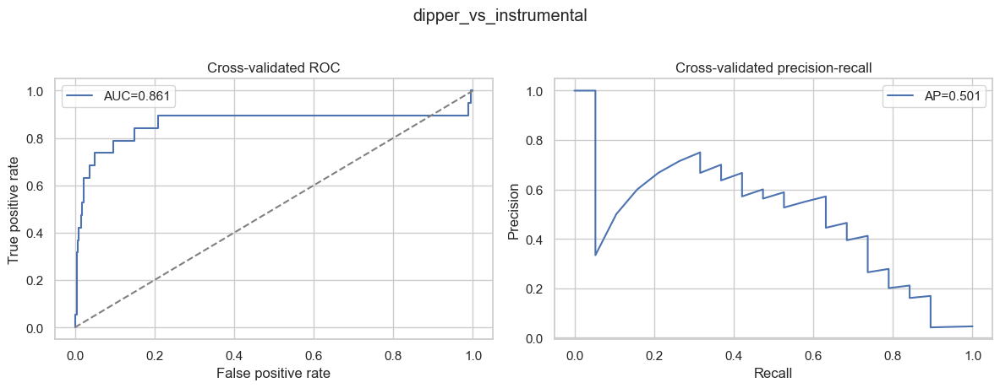

Top positive/negative coefficients

,feature,coef_positive,abs_coef
70,num__H_K,0.876245,0.876245
156,num__stats_sf_ml_gamma,0.789390,0.789390
18,num__dip_max_run_cameras,0.730138,0.730138
35,num__dip_is_single_event,0.636145,0.636145
138,num__stats_con,0.586283,0.586283
49,num__radial_velocity,0.453253,0.453253
173,num__stats_harmonics_r61,0.432881,0.432881
57,num__tmass_j,0.430864,0.430864
59,num__tmass_h,0.389250,0.389250
135,num__stats_trend_r2,0.365667,0.365667


### dipper_vs_other: positive=['dipper'], negative=['other']

Rows=115; positives=19; negatives=96; numeric=207; categorical=16; folds=5


,mean,std
roc_auc,0.954386,0.034199
average_precision,0.860516,0.103009
balanced_accuracy,0.865877,0.069120
f1,0.763492,0.124245


ROC AUC: 0.95
Average precision: 0.838
Balanced accuracy @ threshold: 0.869


,pred_negative,pred_positive
true_negative,91,5
true_positive,4,15


              precision    recall  f1-score   support

    negative       0.96      0.95      0.95        96
    positive       0.75      0.79      0.77        19

    accuracy                           0.92       115
   macro avg       0.85      0.87      0.86       115
weighted avg       0.92      0.92      0.92       115



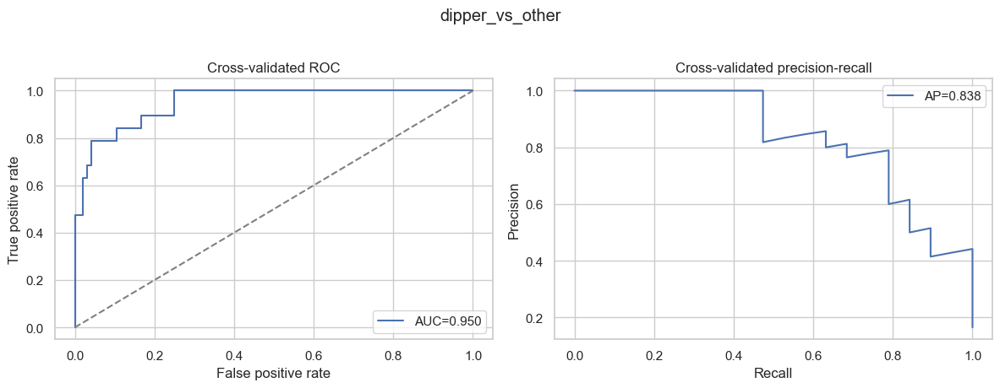

Top positive/negative coefficients

,feature,coef_positive,abs_coef
163,num__stats_rcs,0.464815,0.464815
76,num__H_K,0.398746,0.398746
50,num__dipper_n_valid_dips,0.353917,0.353917
145,num__stats_trend_r2,0.346645,0.346645
204,num__dipper_valid_fraction,0.337431,0.337431
130,num__stats_variability_lag1_autocorr,0.322400,0.322400
82,num__mass50,0.302353,0.302353
22,num__dip_max_run_cameras,0.300530,0.300530
141,num__stats_variability_lomb_scargle_peak_power,0.252950,0.252950
186,num__stats_harmonics_phase_4,0.250085,0.250085


### microlensing_vs_instrumental: positive=['microlensing'], negative=['instrumental']

Rows=438; positives=34; negatives=404; numeric=195; categorical=14; folds=5


,mean,std
roc_auc,0.991417,0.018223
average_precision,0.924286,0.159507
balanced_accuracy,0.960359,0.040633
f1,0.876134,0.053627


ROC AUC: 0.989
Average precision: 0.867
Balanced accuracy @ threshold: 0.962


,pred_negative,pred_positive
true_negative,397,7
true_positive,2,32


              precision    recall  f1-score   support

    negative       0.99      0.98      0.99       404
    positive       0.82      0.94      0.88        34

    accuracy                           0.98       438
   macro avg       0.91      0.96      0.93       438
weighted avg       0.98      0.98      0.98       438



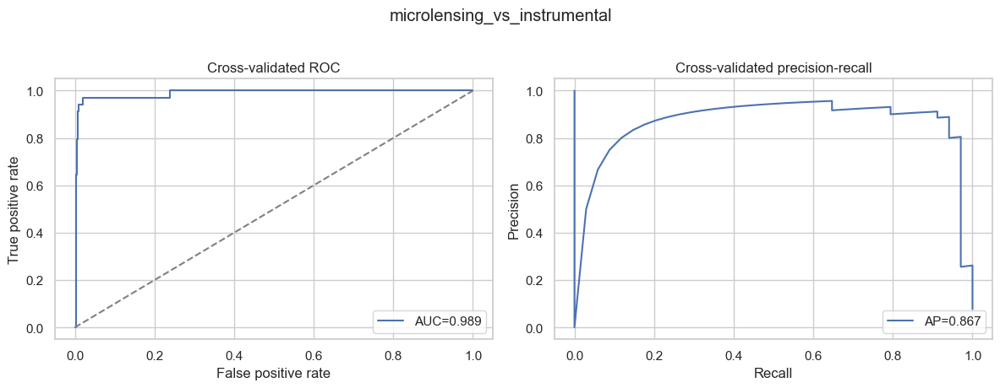

Top positive/negative coefficients

,feature,coef_positive,abs_coef
47,num__radial_velocity,0.612992,0.612992
29,num__jump_max_run_points,0.604671,0.604671
31,num__jump_max_run_sum,0.585366,0.585366
21,num__jump_best_delta_bic,0.578951,0.578951
136,num__stats_con,0.560796,0.560796
211,cat__jump_best_morph_paczynski,0.552149,0.552149
33,num__jump_max_run_cameras,0.506808,0.506808
172,num__stats_harmonics_r71,0.493460,0.493460
8,num__dip_best_p,0.400958,0.400958
36,num__jump_is_single_event,0.379669,0.379669


### unknown_interesting_vs_instrumental: positive=['unknown_interesting'], negative=['instrumental']

Rows=1,180; positives=776; negatives=404; numeric=202; categorical=16; folds=5


,mean,std
roc_auc,0.948195,0.018471
average_precision,0.961997,0.015769
balanced_accuracy,0.904571,0.018873
f1,0.934187,0.012712


ROC AUC: 0.947
Average precision: 0.958
Balanced accuracy @ threshold: 0.905


,pred_negative,pred_positive
true_negative,354,50
true_positive,52,724


              precision    recall  f1-score   support

    negative       0.87      0.88      0.87       404
    positive       0.94      0.93      0.93       776

    accuracy                           0.91      1180
   macro avg       0.90      0.90      0.90      1180
weighted avg       0.91      0.91      0.91      1180



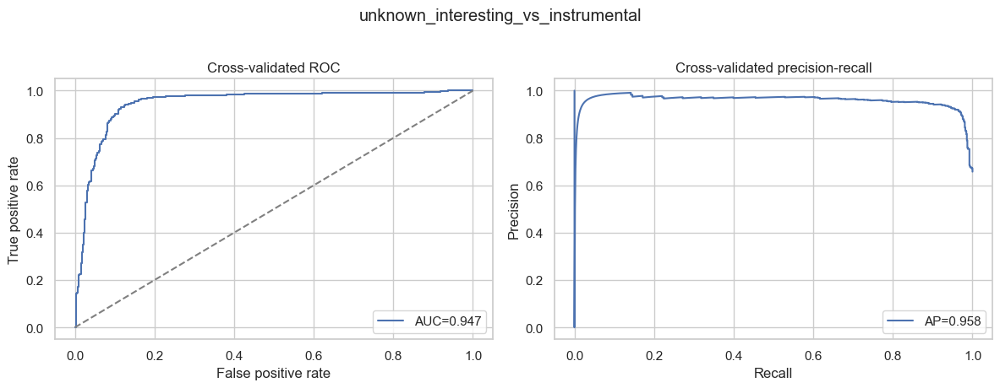

Top positive/negative coefficients

,feature,coef_positive,abs_coef
132,num__stats_variability_string_length_resid_total,1.694909,1.694909
154,num__stats_skew,1.689761,1.689761
201,num__stats_points_kept_fraction,1.274308,1.274308
226,cat__jump_best_morph_paczynski,0.946058,0.946058
161,num__stats_sf_ml_gamma,0.911241,0.911241
22,num__jump_best_delta_bic,0.890691,0.890691
41,num__jump_is_single_event,0.855165,0.855165
143,num__stats_con,0.828679,0.828679
1,num__period_n_sources,0.812989,0.812989
8,num__dip_bayes_factor,0.800335,0.800335


### interesting_vs_background: positive=['dipper', 'microlensing', 'unknown_interesting', 'flare', 'ltv'], negative=['instrumental', 'other']

Rows=1,368; positives=868; negatives=500; numeric=202; categorical=16; folds=5


,mean,std
roc_auc,0.895220,0.006250
average_precision,0.912487,0.015356
balanced_accuracy,0.843655,0.005524
f1,0.881818,0.007702


ROC AUC: 0.894
Average precision: 0.91
Balanced accuracy @ threshold: 0.844


,pred_negative,pred_positive
true_negative,407,93
true_positive,110,758


              precision    recall  f1-score   support

    negative       0.79      0.81      0.80       500
    positive       0.89      0.87      0.88       868

    accuracy                           0.85      1368
   macro avg       0.84      0.84      0.84      1368
weighted avg       0.85      0.85      0.85      1368



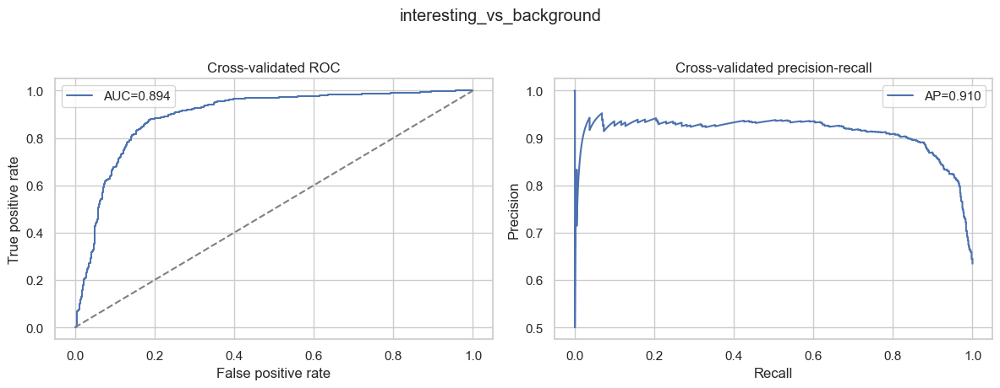

Top positive/negative coefficients

,feature,coef_positive,abs_coef
132,num__stats_variability_string_length_resid_total,2.000956,2.000956
154,num__stats_skew,1.376688,1.376688
228,cat__jump_best_morph_paczynski,1.302318,1.302318
253,cat__asassn_var_type_,1.080389,1.080389
125,num__stats_variability_lag1_autocorr,0.936291,0.936291
24,num__jump_best_p,0.899080,0.899080
34,num__jump_max_run_cameras,0.893516,0.893516
261,cat__asassn_var_type_ROT:,0.785238,0.785238
211,cat__period_sources_gaia_eb|asassn_var,0.738471,0.738471
255,cat__asassn_var_type_EA,0.738471,0.738471


### rare_interesting_vs_background: positive=['dipper', 'microlensing', 'flare', 'ltv'], negative=['instrumental', 'other']

Rows=592; positives=92; negatives=500; numeric=200; categorical=16; folds=5


,mean,std
roc_auc,0.902749,0.034149
average_precision,0.671659,0.125602
balanced_accuracy,0.813509,0.034872
f1,0.660852,0.061454


ROC AUC: 0.906
Average precision: 0.642
Balanced accuracy @ threshold: 0.813


,pred_negative,pred_positive
true_negative,460,40
true_positive,27,65


              precision    recall  f1-score   support

    negative       0.94      0.92      0.93       500
    positive       0.62      0.71      0.66        92

    accuracy                           0.89       592
   macro avg       0.78      0.81      0.80       592
weighted avg       0.89      0.89      0.89       592



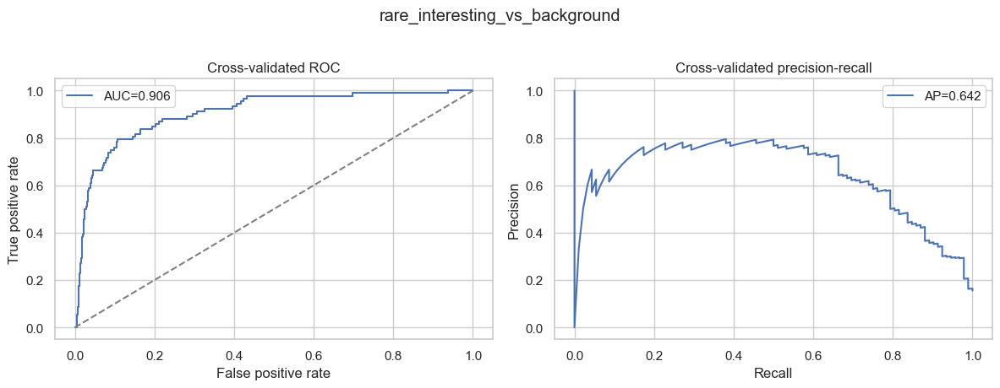

Top positive/negative coefficients

,feature,coef_positive,abs_coef
46,num__dipper_n_valid_dips,1.543591,1.543591
225,cat__jump_best_morph_paczynski,1.479156,1.479156
123,num__stats_variability_lag1_autocorr,1.418696,1.418696
34,num__jump_max_run_cameras,1.020492,1.020492
50,num__radial_velocity,0.983067,0.983067
53,num__logg_gspphot,0.945434,0.945434
162,num__stats_harmonics_a0,0.883536,0.883536
25,num__jump_best_mag_event,0.864080,0.864080
36,num__dip_is_single_event,0.854526,0.854526
9,num__dip_best_p,0.750996,0.750996


In [32]:
def make_onehot_encoder():
    try:
        return OneHotEncoder(handle_unknown="ignore", sparse_output=False)
    except TypeError:
        return OneHotEncoder(handle_unknown="ignore", sparse=False)

def select_model_features(data: pd.DataFrame, *, min_nonmissing_frac: float = 0.35, max_cats: int = 16) -> tuple[list[str], list[str]]:
    model_numeric = []
    for col in numeric_cols:
        if col in EXCLUDE_FEATURES:
            continue
        if col not in data.columns:
            continue
        if data[col].notna().mean() >= min_nonmissing_frac and data[col].nunique(dropna=True) > 1:
            model_numeric.append(col)
    model_categorical = []
    for col in low_card_cols:
        if col in EXCLUDE_FEATURES:
            continue
        if col not in data.columns:
            continue
        nunique = data[col].nunique(dropna=True)
        if data[col].notna().mean() >= min_nonmissing_frac and 1 < nunique <= max_cats:
            model_categorical.append(col)
    return model_numeric, model_categorical

def fit_binary_logit_contrast(name: str, positive_labels: list[str], negative_labels: list[str], *, threshold: float = 0.5) -> dict[str, object] | None:
    data = analysis.loc[analysis["event_class"].isin(positive_labels + negative_labels)].copy()
    y = data["event_class"].isin(positive_labels).astype(int)
    pos_n = int(y.sum())
    neg_n = int((1 - y).sum())
    if pos_n < 10 or neg_n < 10:
        print(f"Skipping {name}: pos={pos_n}, neg={neg_n}")
        return None
    model_numeric, model_categorical = select_model_features(data)
    X_cols = model_numeric + model_categorical
    preprocess = ColumnTransformer(
        transformers=[
            ("num", Pipeline([("impute", SimpleImputer(strategy="median")), ("scale", StandardScaler())]), model_numeric),
            ("cat", Pipeline([("impute", SimpleImputer(strategy="most_frequent")), ("onehot", make_onehot_encoder())]), model_categorical),
        ],
        remainder="drop",
    )
    model = Pipeline([
        ("prep", preprocess),
        ("clf", LogisticRegression(max_iter=4000, class_weight="balanced", solver="liblinear")),
    ])
    n_splits = min(5, pos_n, neg_n)
    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    scoring = ["roc_auc", "average_precision", "balanced_accuracy", "f1"]
    cv_scores = cross_validate(model, data[X_cols], y, cv=cv, scoring=scoring)
    proba = cross_val_predict(model, data[X_cols], y, cv=cv, method="predict_proba")[:, 1]
    pred = (proba >= threshold).astype(int)
    score_summary = pd.DataFrame({
        metric.replace("test_", ""): [cv_scores[metric].mean(), cv_scores[metric].std(ddof=1)]
        for metric in cv_scores
        if metric.startswith("test_")
    }, index=["mean", "std"]).T
    model.fit(data[X_cols], y)
    try:
        feature_names = model.named_steps["prep"].get_feature_names_out()
    except Exception:
        feature_names = np.array(X_cols, dtype=object)
    coefs = model.named_steps["clf"].coef_[0]
    coef_table = pd.DataFrame({"feature": feature_names, "coef_positive": coefs})
    coef_table["abs_coef"] = coef_table["coef_positive"].abs()
    coef_table = coef_table.sort_values("abs_coef", ascending=False)
    scored = data[["candidate_id", "asas_sn_id", "event_class", "review_status", "interest_score", "review_pass", "notes", "lc_path"] + [c for c in KEY_DISPLAY_COLS if c not in {"candidate_id", "asas_sn_id", "event_class", "review_status", "interest_score", "review_pass", "notes", "lc_path"}]].copy()
    scored["cv_positive_probability"] = proba
    result = {
        "name": name,
        "positive_labels": positive_labels,
        "negative_labels": negative_labels,
        "data": data,
        "y": y,
        "proba": proba,
        "pred": pred,
        "score_summary": score_summary,
        "coef_table": coef_table,
        "scored": scored,
        "model": model,
        "model_numeric": model_numeric,
        "model_categorical": model_categorical,
    }
    display(Markdown(f"### {name}: positive={positive_labels}, negative={negative_labels}"))
    print(f"Rows={len(data):,}; positives={pos_n:,}; negatives={neg_n:,}; numeric={len(model_numeric)}; categorical={len(model_categorical)}; folds={n_splits}")
    display(score_summary)
    print("ROC AUC:", round(roc_auc_score(y, proba), 3))
    print("Average precision:", round(average_precision_score(y, proba), 3))
    print("Balanced accuracy @ threshold:", round(balanced_accuracy_score(y, pred), 3))
    display(pd.DataFrame(confusion_matrix(y, pred), index=["true_negative", "true_positive"], columns=["pred_negative", "pred_positive"]))
    print(classification_report(y, pred, target_names=["negative", "positive"]))
    fig, axes = plt.subplots(1, 2, figsize=(12, 4.5))
    fpr, tpr, _ = roc_curve(y, proba)
    axes[0].plot(fpr, tpr, label=f"AUC={roc_auc_score(y, proba):.3f}")
    axes[0].plot([0, 1], [0, 1], linestyle="--", color="gray")
    axes[0].set_xlabel("False positive rate")
    axes[0].set_ylabel("True positive rate")
    axes[0].set_title("Cross-validated ROC")
    axes[0].legend()
    precision, recall, _ = precision_recall_curve(y, proba)
    axes[1].plot(recall, precision, label=f"AP={average_precision_score(y, proba):.3f}")
    axes[1].set_xlabel("Recall")
    axes[1].set_ylabel("Precision")
    axes[1].set_title("Cross-validated precision-recall")
    axes[1].legend()
    fig.suptitle(name, y=1.02)
    fig.tight_layout()
    plt.show()
    display(Markdown("Top positive/negative coefficients"))
    display(pd.concat([coef_table.sort_values("coef_positive", ascending=False).head(20), coef_table.sort_values("coef_positive", ascending=True).head(20)]))
    return result

binary_models = {}
for contrast_name in [
    "dipper_vs_instrumental",
    "dipper_vs_other",
    "microlensing_vs_instrumental",
    "unknown_interesting_vs_instrumental",
    "interesting_vs_background",
    "rare_interesting_vs_background",
]:
    pos, neg = CONTRASTS[contrast_name]
    result = fit_binary_logit_contrast(contrast_name, pos, neg)
    if result is not None:
        binary_models[contrast_name] = result


## Random Forest Check For Aggregate Interesting Vs Background

This captures nonlinear interactions and gives a second feature-ranking view. If logistic and random forest agree on feature families, the signal is more credible.


Rows=1,368; positives=868; negatives=500; features=212
ROC AUC: 0.919
Average precision: 0.938


,feature,importance
45,num__jumper_score,0.043214
46,num__jumper_n_jumps,0.042196
24,num__jump_best_p,0.033139
187,num__stats_iar_phi,0.026234
47,num__jumper_n_valid_jumps,0.024307
222,cat__jump_best_morph_noise,0.018871
35,num__jump_max_log_bf_local,0.018396
129,num__stats_variability_string_length_resid_mea...,0.017879
32,num__jump_max_run_sum,0.016979
157,num__stats_sf_ml_gamma,0.016770


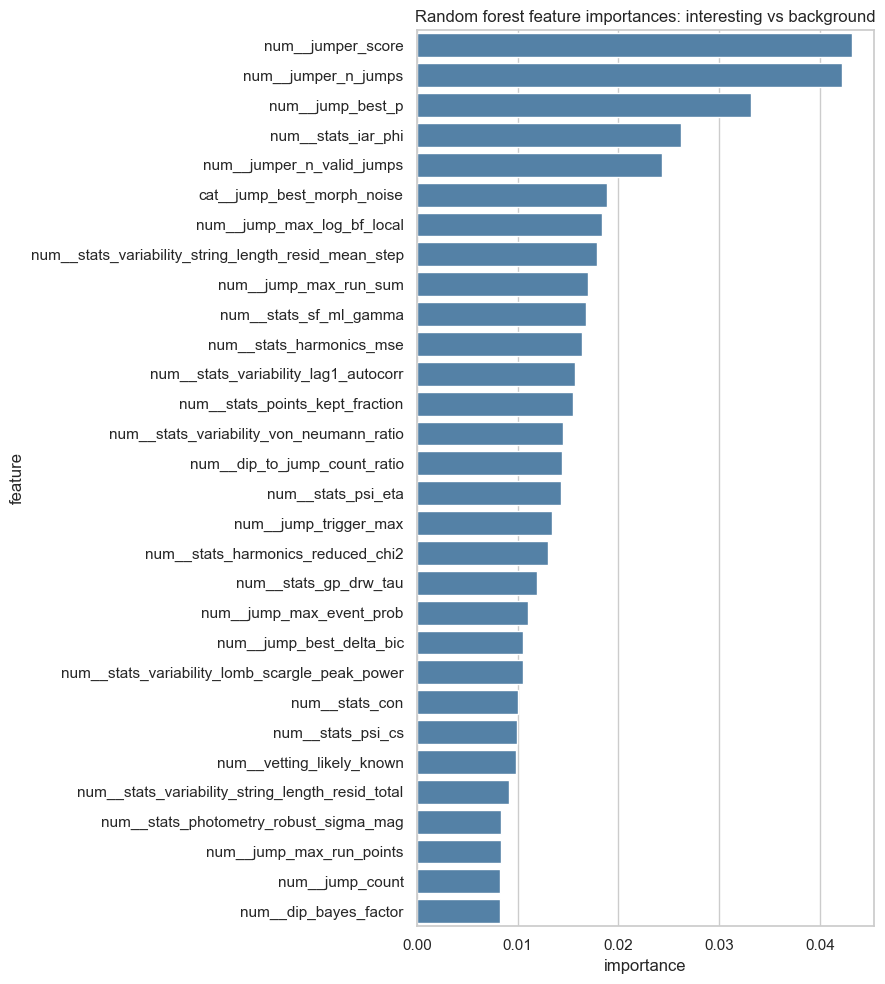

In [33]:
rf_name = "interesting_vs_background"
pos, neg = CONTRASTS[rf_name]
rf_data = analysis.loc[analysis["event_class"].isin(pos + neg)].copy()
rf_y = rf_data["event_class"].isin(pos).astype(int)
rf_numeric, rf_categorical = select_model_features(rf_data, min_nonmissing_frac=0.45, max_cats=12)
rf_cols = rf_numeric + rf_categorical
rf_preprocess = ColumnTransformer(
    transformers=[
        ("num", Pipeline([("impute", SimpleImputer(strategy="median"))]), rf_numeric),
        ("cat", Pipeline([("impute", SimpleImputer(strategy="most_frequent")), ("onehot", make_onehot_encoder())]), rf_categorical),
    ],
    remainder="drop",
)
rf_model = Pipeline([
    ("prep", rf_preprocess),
    ("clf", RandomForestClassifier(n_estimators=250, min_samples_leaf=4, class_weight="balanced_subsample", random_state=42, n_jobs=-1)),
])
rf_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
rf_proba = cross_val_predict(rf_model, rf_data[rf_cols], rf_y, cv=rf_cv, method="predict_proba")[:, 1]
print(f"Rows={len(rf_data):,}; positives={int(rf_y.sum()):,}; negatives={int((1-rf_y).sum()):,}; features={len(rf_cols)}")
print("ROC AUC:", round(roc_auc_score(rf_y, rf_proba), 3))
print("Average precision:", round(average_precision_score(rf_y, rf_proba), 3))
rf_model.fit(rf_data[rf_cols], rf_y)
try:
    rf_feature_names = rf_model.named_steps["prep"].get_feature_names_out()
except Exception:
    rf_feature_names = np.array(rf_cols, dtype=object)
rf_importance = pd.DataFrame({
    "feature": rf_feature_names,
    "importance": rf_model.named_steps["clf"].feature_importances_,
}).sort_values("importance", ascending=False)
display(rf_importance.head(50))

fig, ax = plt.subplots(figsize=(9, 10))
sns.barplot(data=rf_importance.head(30), y="feature", x="importance", ax=ax, color="steelblue")
ax.set_title("Random forest feature importances: interesting vs background")
fig.tight_layout()
plt.show()


## Multiclass Sanity Check

This asks whether a baseline model can separate the major reviewed labels simultaneously. Small labels like `flare` are excluded unless enough rows exist.


/home/calder/miniforge3/envs/malca/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/calder/miniforge3/envs/malca/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/calder/miniforge3/envs/malca/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/calder/miniforge3/envs/malca/lib/python3.10/site-packages/sklearn/l

Labels: ['unknown_interesting', 'instrumental', 'other', 'ltv', 'microlensing', 'dipper']
Rows=1,365; folds=5; numeric=200; categorical=14
Balanced accuracy: 0.531
                     precision    recall  f1-score   support

             dipper       0.16      0.21      0.18        19
       instrumental       0.86      0.83      0.85       404
                ltv       0.21      0.39      0.27        36
       microlensing       0.35      0.47      0.40        34
              other       0.35      0.49      0.41        96
unknown_interesting       0.88      0.79      0.83       776

           accuracy                           0.76      1365
          macro avg       0.47      0.53      0.49      1365
       weighted avg       0.79      0.76      0.77      1365



,pred_unknown_interesting,pred_instrumental,pred_other,pred_ltv,pred_microlensing,pred_dipper
true_unknown_interesting,616,35,71,20,24,10
true_instrumental,33,337,10,19,2,3
true_other,34,6,47,3,4,2
true_ltv,6,9,1,14,0,6
true_microlensing,11,2,4,1,16,0
true_dipper,2,2,2,9,0,4


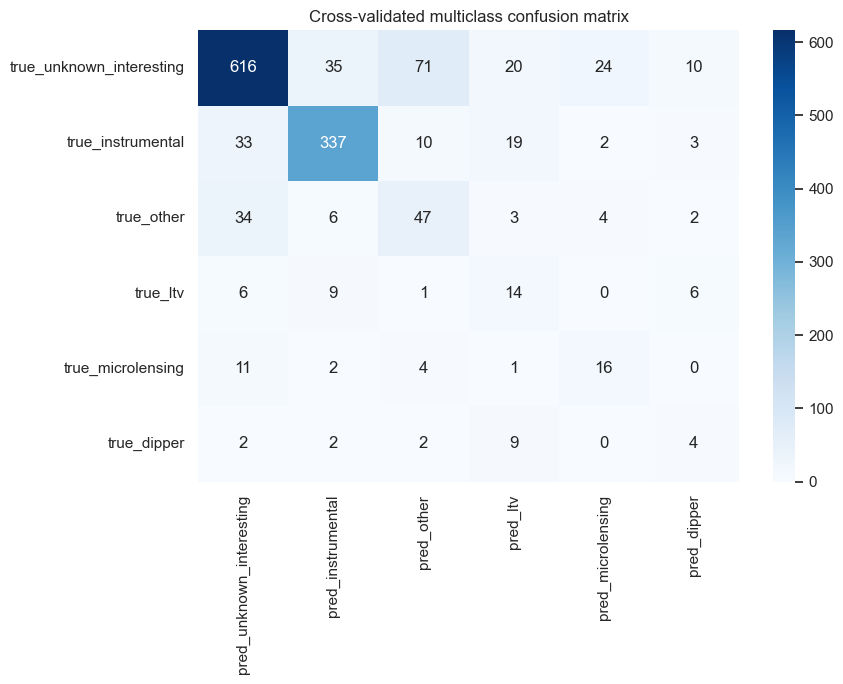

In [34]:
MIN_CLASS_FOR_MULTICLASS = 15
multi_labels = reviewed["event_class"].value_counts()
multi_labels = multi_labels[multi_labels >= MIN_CLASS_FOR_MULTICLASS].index.tolist()
multi_data = analysis.loc[analysis["event_class"].isin(multi_labels)].copy()
multi_y = multi_data["event_class"].astype(str)
multi_numeric, multi_categorical = select_model_features(multi_data, min_nonmissing_frac=0.40, max_cats=12)
multi_cols = multi_numeric + multi_categorical
multi_preprocess = ColumnTransformer(
    transformers=[
        ("num", Pipeline([("impute", SimpleImputer(strategy="median")), ("scale", StandardScaler())]), multi_numeric),
        ("cat", Pipeline([("impute", SimpleImputer(strategy="most_frequent")), ("onehot", make_onehot_encoder())]), multi_categorical),
    ],
    remainder="drop",
)
multi_model = Pipeline([
    ("prep", multi_preprocess),
    ("clf", LogisticRegression(max_iter=5000, class_weight="balanced", solver="lbfgs", multi_class="auto")),
])
min_count = int(multi_y.value_counts().min())
n_splits = min(5, min_count)
cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
multi_pred = cross_val_predict(multi_model, multi_data[multi_cols], multi_y, cv=cv)
print(f"Labels: {multi_labels}")
print(f"Rows={len(multi_data):,}; folds={n_splits}; numeric={len(multi_numeric)}; categorical={len(multi_categorical)}")
print("Balanced accuracy:", round(balanced_accuracy_score(multi_y, multi_pred), 3))
print(classification_report(multi_y, multi_pred))
cm = pd.DataFrame(confusion_matrix(multi_y, multi_pred, labels=multi_labels), index=[f"true_{x}" for x in multi_labels], columns=[f"pred_{x}" for x in multi_labels])
display(cm)
fig, ax = plt.subplots(figsize=(9, 7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=ax)
ax.set_title("Cross-validated multiclass confusion matrix")
fig.tight_layout()
plt.show()


## PCA Views

The first PCA uses top aggregate-separating features. The second emphasizes dip/microlensing/event-shape fields.


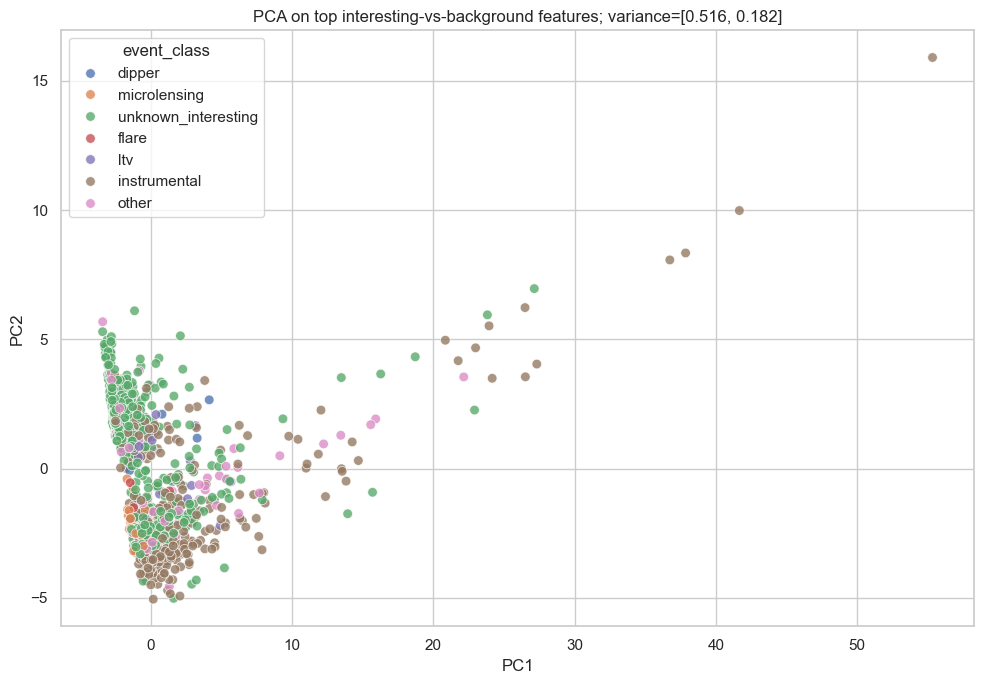

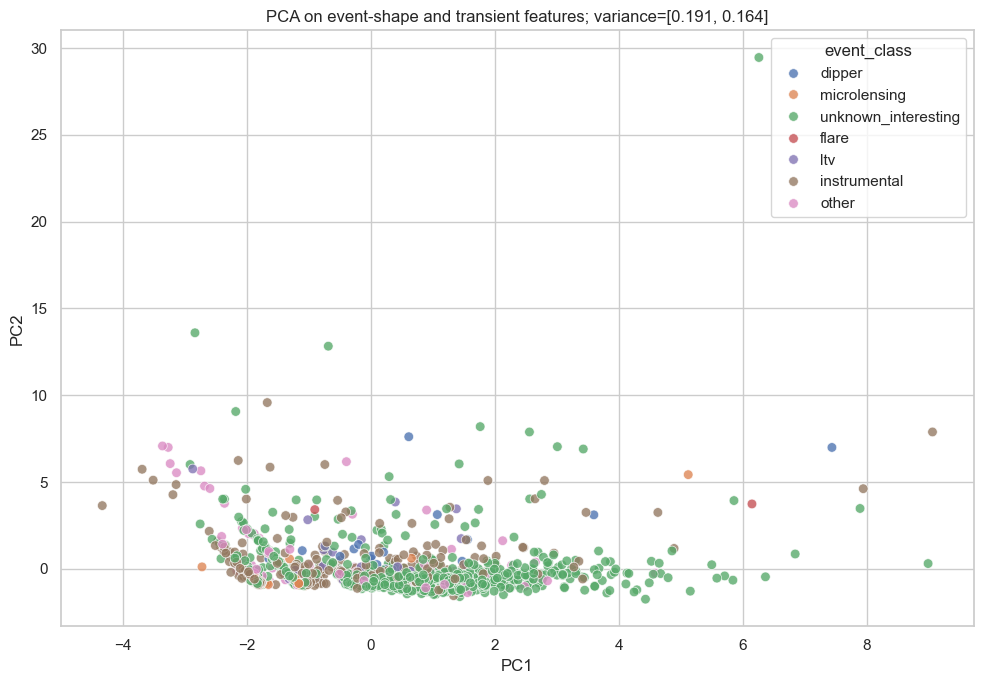

,candidate_id,event_class,review_family,PC1,PC2
0,103079849011,unknown_interesting,interesting,1.871084,-1.265090
1,111669286812,microlensing,interesting,-1.423607,-1.771849
2,111669540052,unknown_interesting,interesting,4.514644,-1.209432
3,111669732408,unknown_interesting,interesting,-2.613059,2.262467
4,111669796466,unknown_interesting,interesting,-2.559396,1.977669


In [35]:
def pca_plot(features: list[str], *, title: str) -> pd.DataFrame:
    features = [f for f in features if f in analysis.columns and f in numeric_cols]
    features = [f for f in features if analysis[f].notna().sum() >= 25]
    if len(features) < 3:
        raise ValueError("Need at least three numeric features for PCA")
    data = analysis.loc[analysis["event_class"].isin(LABEL_ORDER), ["candidate_id", "event_class", "review_family"] + features].copy()
    X = data[features].apply(pd.to_numeric, errors="coerce")
    X = SimpleImputer(strategy="median").fit_transform(X)
    X = StandardScaler().fit_transform(X)
    pca = PCA(n_components=2, random_state=42)
    coords = pca.fit_transform(X)
    out = data[["candidate_id", "event_class", "review_family"]].copy()
    out["PC1"] = coords[:, 0]
    out["PC2"] = coords[:, 1]
    fig, ax = plt.subplots(figsize=(10, 7))
    sns.scatterplot(data=out, x="PC1", y="PC2", hue="event_class", hue_order=[x for x in LABEL_ORDER if x in out["event_class"].unique()], alpha=0.78, s=48, ax=ax)
    ax.set_title(f"{title}; variance={pca.explained_variance_ratio_.round(3).tolist()}")
    fig.tight_layout()
    plt.show()
    return out

agg_top_features = test_tables["interesting_vs_background"].head(35)["feature"].tolist() if "interesting_vs_background" in test_tables and not test_tables["interesting_vs_background"].empty else INTERPRETABLE_FEATURES[:35]
pca_aggregate = pca_plot(agg_top_features, title="PCA on top interesting-vs-background features")

event_shape_features = [
    "dipper_score", "dip_best_log_bf", "dip_best_delta_bic", "dip_best_amp", "dip_symmetry_score", "dip_count", "dip_run_count",
    "dip_max_run_points", "dip_max_run_duration", "dip_inter_event_spacing_median", "dip_amplitude_consistency", "dip_duration_consistency",
    "jumper_score", "jump_best_log_bf", "jump_best_amp", "periodicity_score", "stats_amplitude", "stats_max_slope",
    "stats_variability_stetson_J", "stats_variability_von_neumann_ratio", "microlens_te_days", "microlens_sep_arcsec",
]
pca_event_shape = pca_plot(event_shape_features, title="PCA on event-shape and transient features")

display(pca_aggregate.head())


## Rare-Label Nearest Neighbors

For each dipper, microlensing, flare, and LTV row, this finds nearest reviewed candidates in top aggregate feature space. This helps identify whether rare labels cluster with each other, with unknown-interesting rows, or with likely contaminants.


In [36]:
neighbor_features = agg_top_features[:40]
neighbor_features = [f for f in neighbor_features if f in analysis.columns and f in numeric_cols and analysis[f].notna().sum() >= 25]
neighbor_data = analysis.loc[analysis["event_class"].isin(LABEL_ORDER), ["candidate_id", "event_class", "review_status", "interest_score", "notes"] + neighbor_features].copy()
Xn = neighbor_data[neighbor_features].apply(pd.to_numeric, errors="coerce")
Xn = SimpleImputer(strategy="median").fit_transform(Xn)
Xn = StandardScaler().fit_transform(Xn)
knn = NearestNeighbors(n_neighbors=8, metric="euclidean")
knn.fit(Xn)
distances, indices = knn.kneighbors(Xn)
rare_mask = neighbor_data["event_class"].isin(RARE_INTERESTING_LABELS)
neighbor_rows = []
for local_idx in np.where(rare_mask.to_numpy())[0]:
    row = neighbor_data.iloc[local_idx]
    for rank, (dist, neighbor_idx) in enumerate(zip(distances[local_idx][1:], indices[local_idx][1:]), start=1):
        nrow = neighbor_data.iloc[neighbor_idx]
        neighbor_rows.append({
            "candidate_id": row["candidate_id"],
            "event_class": row["event_class"],
            "interest_score": row["interest_score"],
            "neighbor_rank": rank,
            "neighbor_candidate_id": nrow["candidate_id"],
            "neighbor_event_class": nrow["event_class"],
            "neighbor_interest_score": nrow["interest_score"],
            "distance": dist,
        })
neighbors = pd.DataFrame(neighbor_rows)
display(neighbors)
display(pd.crosstab(neighbors["event_class"], neighbors["neighbor_event_class"], normalize="index").round(3))


,candidate_id,event_class,interest_score,neighbor_rank,neighbor_candidate_id,neighbor_event_class,neighbor_interest_score,distance
0,111669286812,microlensing,1,1,34360800532,microlensing,1,0.377881
1,111669286812,microlensing,1,2,481037066830,instrumental,1,0.508247
2,111669286812,microlensing,1,3,103079263205,microlensing,3,0.510365
3,111669286812,microlensing,1,4,25771219762,microlensing,2,0.533819
4,111669286812,microlensing,1,5,163208930428,flare,4,0.550183
...,...,...,...,...,...,...,...,...
639,85900768138,ltv,1,3,223338997633,dipper,1,0.630389
640,85900768138,ltv,1,4,274878488762,other,4,0.656286
641,85900768138,ltv,1,5,8591303502,dipper,1,0.660140
642,85900768138,ltv,1,6,523986929122,instrumental,2,0.690985


neighbor_event_class,dipper,flare,instrumental,ltv,microlensing,other,unknown_interesting
event_class,,,,,,,
dipper,0.068,0.000,0.346,0.105,0.008,0.060,0.414
flare,0.000,0.000,0.476,0.000,0.333,0.000,0.190
ltv,0.044,0.000,0.341,0.099,0.012,0.099,0.405
microlensing,0.000,0.034,0.160,0.008,0.336,0.076,0.387


## High-Probability And Confusing Cases

These tables are useful for model-guided inspection: likely positives, likely false positives, and likely false negatives for the aggregate interesting-vs-background contrast.


In [37]:
if "interesting_vs_background" in binary_models:
    agg = binary_models["interesting_vs_background"]
    scored = agg["scored"].copy()
    scored["true_positive_family"] = scored["event_class"].isin(INTERESTING_LABELS)
    display(Markdown("### Highest model probability for interesting"))
    display(scored.sort_values("cv_positive_probability", ascending=False).head(60))
    display(Markdown("### Background rows that look interesting to the model"))
    display(scored.loc[~scored["true_positive_family"]].sort_values("cv_positive_probability", ascending=False).head(60))
    display(Markdown("### Interesting rows that look background-like to the model"))
    display(scored.loc[scored["true_positive_family"]].sort_values("cv_positive_probability", ascending=True).head(60))
else:
    print("Aggregate model was not fit.")


### Highest model probability for interesting

,candidate_id,asas_sn_id,event_class,review_status,interest_score,review_pass,notes,lc_path,review_family,updated_at,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d,cv_positive_probability,true_positive_family
347,171799406263,171799406263,unknown_interesting,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,interesting,2026-03-19 23:52:06.568484+00:00,21.605886,167.0,17.0,1,noise,None,0.000000,NaN,NaN,24.0,11.0,3.0,32.96962,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.399510,852.0,5.0,2889.97917,1.168940,0.014854,0.012398,0.030440,0.004706,2.188157,0.081390,0.075750,0.498192,0.196214,3.326824,0,,,,SB*,,0,1.091365,None,0.000000e+00,NaN,1.000000,True
27,146029670219,146029670219,other,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,background,2026-03-19 18:29:48.492442+00:00,19.401162,226.0,82.0,1,noise,None,0.000000,NaN,NaN,4.0,1.0,4.0,11.97575,NaN,1,19.237648,1,None,-1.447175,6.0,None,None,None,None,None,3.0,None,0,0.412450,2.0,None,None,0.412450,None,None,12.823462,768.0,4.0,2825.58534,1.977730,0.148937,0.180785,0.230438,0.027006,220.563091,7.149392,7.880539,0.511759,0.353501,4.895520,1,asassn_var,EW,,EB*,EW,1,NaN,None,1.285679e-01,4.147352e-02,1.000000,False
5,111670316162,111670316162,unknown_interesting,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,interesting,2026-03-20 05:31:05.947457+00:00,19.813838,112.0,11.0,1,gaussian,None,34.818495,0.798640,8071.034925,13.0,5.0,3.0,137.41798,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.926263,590.0,4.0,2891.06517,2.003790,0.022464,0.020015,0.044144,0.007349,5.011961,0.692903,0.661815,0.591232,0.411801,0.392874,0,,,,,,1,NaN,None,3.627300e-01,1.170097e-01,1.000000,True
4,111669796466,111669796466,unknown_interesting,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,interesting,2026-03-20 06:04:54.810093+00:00,19.220883,199.0,14.0,1,noise,None,0.000000,NaN,NaN,37.0,12.0,5.0,55.84903,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.799203,1028.0,2.0,3087.80651,1.026400,0.015927,0.013343,0.032551,0.005922,2.536168,0.257949,0.239527,0.540472,0.667444,0.597859,0,,,,EB?,,1,NaN,None,8.742336e-02,2.820108e-02,1.000000,True
133,429497533861,429497533861,unknown_interesting,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,interesting,2026-03-19 09:06:15.448659+00:00,0.000000,0.0,0.0,0,none,None,0.000000,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,0.373994,1,None,-0.039793,61.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.856183,1140.0,5.0,2890.96950,1.015350,0.090748,0.035310,0.155760,0.029805,81.508227,6.180484,5.369140,14.237804,-1.370457,1.099104,0,,,,V*,,1,NaN,None,2.247910e+00,7.251323e-01,0.999953,True
657,249109084130,249109084130,dipper,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,interesting,2026-03-19 05:19:56.656011+00:00,0.000000,0.0,0.0,0,none,None,0.000000

### Background rows that look interesting to the model

,candidate_id,asas_sn_id,event_class,review_status,interest_score,review_pass,notes,lc_path,review_family,updated_at,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d,cv_positive_probability,true_positive_family
27,146029670219,146029670219,other,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,background,2026-03-19 18:29:48.492442+00:00,19.401162,226.0,82.0,1,noise,None,0.000000,NaN,NaN,4.0,1.0,4.0,11.97575,NaN,1,19.237648,1,None,-1.447175,6.0,None,None,None,None,None,3.0,None,0,0.412450,2.0,None,None,0.412450,None,None,12.823462,768.0,4.0,2825.58534,1.977730,0.148937,0.180785,0.230438,0.027006,220.563091,7.149392,7.880539,0.511759,0.353501,4.895520,1,asassn_var,EW,,EB*,EW,1,NaN,None,1.285679e-01,4.147352e-02,1.000000,False
488,575526332641,575526332641,instrumental,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,background,2026-03-20 06:56:02.308089+00:00,15.463151,80.0,59.0,1,noise,None,0.000000,NaN,NaN,19.0,5.0,5.0,58.91222,0.439197,0,19.492976,1,None,NaN,52.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.033000,1408.0,4.0,3019.73175,1.004030,0.951898,0.914219,1.816500,0.280258,6212.505233,28.805186,31.134745,0.678438,-0.068896,314.516129,0,,,,,,0,1.035739,None,8.743341e-02,2.820433e-02,0.999937,False
1234,481037352139,481037352139,instrumental,reviewed,3,2,,/home/calder/code/malca/output/runs/runs_march...,background,2026-03-20 05:41:07.409174+00:00,19.646099,308.0,54.0,1,skew_gaussian,None,38.694046,0.279106,7040.018403,69.0,32.0,4.0,14.94119,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.436503,1963.0,9.0,2890.99584,0.827485,0.064200,0.044640,0.137736,0.019014,41.025608,1.817566,1.610362,0.642984,1.205443,11189.100283,0,,,,,,0,NaN,None,1.064122e-01,3.432652e-02,0.999256,False
883,549756363947,549756363947,instrumental,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,background,2026-03-20 02:15:02.697130+00:00,20.173787,245.0,23.0,1,noise,None,0.000000,NaN,NaN,66.0,20.0,7.0,65.77746,0.189098,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.786603,1006.0,3.0,2824.09449,1.122950,0.027314,0.020756,0.058781,0.008196,6.745376,0.493592,0.438918,0.535912,1.040832,15.873016,0,,,,,,0,NaN,None,0.000000e+00,NaN,0.998309,False
479,549756460341,549756460341,other,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,background,2026-03-19 18:17:11.693910+00:00,21.662735,558.0,89.0,1,noise,None,0.000000,NaN,NaN,58.0,26.0,4.0,20.08519,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,3.0,None,0,1.114300,1.0,None,None,1.114300,None,None,12.477626,2365.0,6.0,3081.04643,0.832290,0.072850,0.044964,0.136945,0.021847,53.070245,1.219975,1.125625,0.576908,1.414244,473.024990,1,asassn_var,,,,,0,NaN,None,0.000000e+00,NaN,0.998172,False
466,532576667815,532576667815,instrumental,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,background,2026-03-20 06:30:01.415097+00:00,18.632200,84.0,48.0,1,n

### Interesting rows that look background-like to the model

,candidate_id,asas_sn_id,event_class,review_status,interest_score,review_pass,notes,lc_path,review_family,updated_at,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d,cv_positive_probability,true_positive_family
391,317827673348,317827673348,unknown_interesting,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,interesting,2026-03-20 00:14:54.496379+00:00,21.090340,125.0,59.0,1,noise,None,0.000000,NaN,NaN,2.0,1.0,2.0,4.98880,NaN,1,21.596882,1,None,NaN,21.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,11.672449,967.0,6.0,3005.94946,1.780245,0.107837,0.093404,0.224799,0.041519,116.287855,4.407375,4.079570,0.627793,0.085690,6.010577,0,,,,,,0,0.865045,None,1.440433e-01,4.646558e-02,0.000019,True
923,60130665647,60130665647,ltv,reviewed,2,2,,/home/calder/code/malca/output/runs/runs_march...,interesting,2026-03-20 06:26:06.720031+00:00,18.825373,131.0,74.0,1,gaussian,None,27.267714,0.109589,8822.178649,11.0,2.0,9.0,51.68284,NaN,0,19.546117,1,None,-5.801475e+08,12.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.430760,1122.0,5.0,3092.80029,1.016440,0.116383,0.090837,0.235219,0.031362,80.788419,4.762237,4.561100,1.208493,0.362266,14813.100374,0,,,,,,0,NaN,None,1.133337e-01,3.655925e-02,0.000023,True
465,532576835760,532576835760,unknown_interesting,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,interesting,2026-03-20 19:52:02.112738+00:00,2.104636,3.0,3.0,1,gaussian,None,741.352845,10441.393742,10796.505675,135.0,8.0,63.0,123.99356,-0.647131,0,-0.161330,1,None,-5.009437e+00,187.0,None,None,None,None,None,3.0,None,0,353.089996,1.0,None,None,353.089996,None,None,14.859661,2313.0,6.0,3101.35402,0.783605,1.050156,0.338271,1.641596,0.246899,7466.792048,73.082604,78.610355,57.456394,-1.221231,641.476921,1,asassn_var,,,,,0,NaN,None,0.000000e+00,NaN,0.000501,True
445,481036839646,481036839646,unknown_interesting,reviewed,4,2,,/home/calder/code/malca/output/runs/runs_march...,interesting,2026-03-20 20:03:26.684096+00:00,0.759167,28.0,20.0,1,gaussian,None,54.803824,0.263649,8275.716991,43.0,6.0,26.0,37.90984,NaN,0,0.957754,1,None,-8.973841e-01,3.0,None,None,None,None,None,3.0,None,0,269.000000,2.0,None,None,269.000000,None,None,12.367461,1281.0,4.0,2754.79650,1.013860,0.067075,0.052574,0.139067,0.023113,44.982500,4.635098,4.238930,11.322854,1.535380,21.301399,1,vsx,VAR,,Em*,,1,0.960608,None,1.676146e+00,5.406922e-01,0.000515,True
595,171799302731,171799302731,unknown_interesting,reviewed,4,1,,/home/calder/code/malca/output/runs/runs_march...,interesting,2026-03-19 21:23:07.577570+00:00,19.875586,144.0,40.0,1,skew_gaussian,None,25.894042,0.137428,7097.045543,55.0,16.0,7.0,58.72977,-0.947201,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,3.0,None,0,0.995164,2.0,None,None,0.995164,None,None,13.528697,923.0,5.0,2887.18394,1.103905,0.064753,0.032617,0.127908,0.019939,38.110898,1.753274,1.471520,0.620665,1.491522,61.879167,1,gaia_eb,EA,ECL,EB*,,1,NaN,None,4.441897e-01,1.432870e-01,0.000680,True
467,541166281548,541

## Light-Curve Inspection Helpers

Use `plot_candidate_lightcurve("...")` or `plot_class_examples("dipper", n=4)`. The y-axis is inverted because these are magnitudes. If `dip_best_t0` or `jump_best_t0` falls inside the plotted time range, the helper marks it.


In [ ]:
(malca) [lenhart.106@ast-sahadeva malca]$ python -m malca pipeline --stage full --mag-bin 14_14.5 --extension dat3 --output-dir output/runs/14_14.5_dat3_premay13 --workers 40 -v
/home/lenhart.106/miniforge3/envs/malca/lib/python3.10/site-packages/lightkurve/prf/__init__.py:7: UserWarning: Warning: the tpfmodel submodule is not available without oktopus installed, which requires a current version of autograd. See #1452 for details.
  warnings.warn(
Loading existing manifest from output/runs/14_14.5_dat3_premay13/manifests/lc_manifest_14_14.5.parquet
Loaded 0 sources

Loading existing filtered manifest from output/runs/14_14.5_dat3_premay13/tags/lc_filtered_14_14.5.parquet
Loaded 0 filtered sources

Loading cached camera median results from output/runs/14_14.5_dat3_premay13/tags/camera_medians_14_14.5.parquet
Found 0/0 sources with raw median suspect cameras

No stochastic-branch sources to process after filtering.

No event-branch results were produced.

Run summary saved to output/runs/14_14.5_dat3_premay13/run_summary.json

=== Step 6: Enriching with light curve stats ===
Warning: No filter output found at output/runs/14_14.5_dat3_premay13/results/lc_events_filtered_14_14.5.parquet

=== Merging per-mag-bin outputs ===
Merge step completed in 0.0s
Warning: downstream stage requires filtered results at output/runs/14_14.5_dat3_premay13/results/lc_events_filtered.parquet. Skipping characterization.
Warning: downstream stage requires filtered results at output/runs/14_14.5_dat3_premay13/results/lc_events_filtered.parquet. Skipping classification.
Warning: downstream stage requires filtered results at output/runs/14_14.5_dat3_premay13/results/lc_events_filtered.parquet. Skipping neighbor enrichment.
Warning: downstream stage requires filtered results at output/runs/14_14.5_dat3_premay13/results/lc_events_filtered.parquet. Skipping spectra enrichment.

=== Step 12: Post-review vetting ===
Warning: no suitable input found for vetting, skipping

=== Exporting bundle to output/runs/14_14.5_dat3_premay13/14_14.5_dat3_premay13_bundle_14_14.5.zip ===
Bundling 5 files with ZIP_DEFLATED compression...
Exported bundle to output/runs/14_14.5_dat3_premay13/14_14.5_dat3_premay13_bundle_14_14.5.zip with 5 files
(malca) [lenhart.106@ast-sahadeva malca]$ 




## Example Light Curves By Class

This cell intentionally plots only a few examples per class to keep the notebook responsive. Increase `n` or call `plot_candidate_lightcurve()` directly for deeper inspection.


### dipper examples

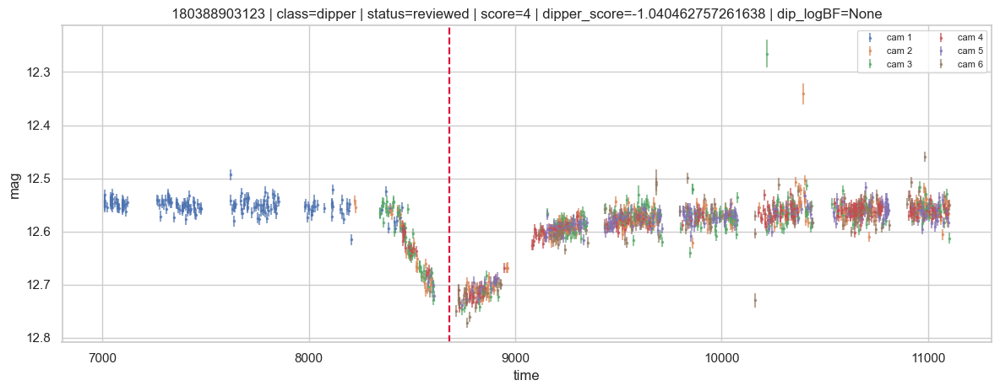

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
33,180388903123,180388903123,dipper,interesting,reviewed,4,2,2026-03-19 04:41:57.365051+00:00,,/home/calder/code/malca/output/runs/runs_march...,-1.040463,69.0,4.0,1,gaussian,None,39.545482,68.4503,8679.175932,54.0,4.0,44.0,144.78118,NaN,0,0.0,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.572548,1104.0,5.0,2881.65095,1.02065,0.025575,0.021371,0.053543,0.008988,6.464754,1.16696,1.057203,1.504952,0.827104,6.580769,0,,,,*,,1,NaN,None,0.0,NaN


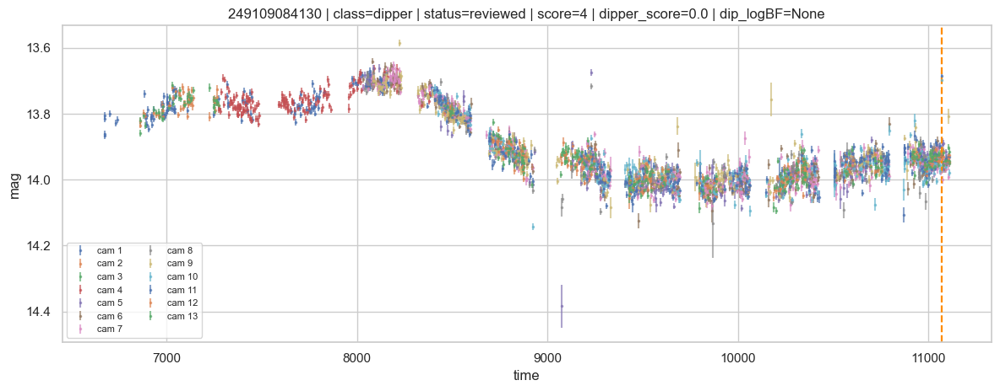

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
657,249109084130,249109084130,dipper,interesting,reviewed,4,2,2026-03-19 05:19:56.656011+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.0,0.0,0.0,0,none,None,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.404836,1,None,-0.282496,6.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.954414,2644.0,9.0,3088.80214,0.52139,0.094767,0.063132,0.177998,0.026403,82.629246,5.907611,5.342541,6.004137,-1.157189,10061.200254,0,,,,Y*O,,0,NaN,None,0.467228,0.150719


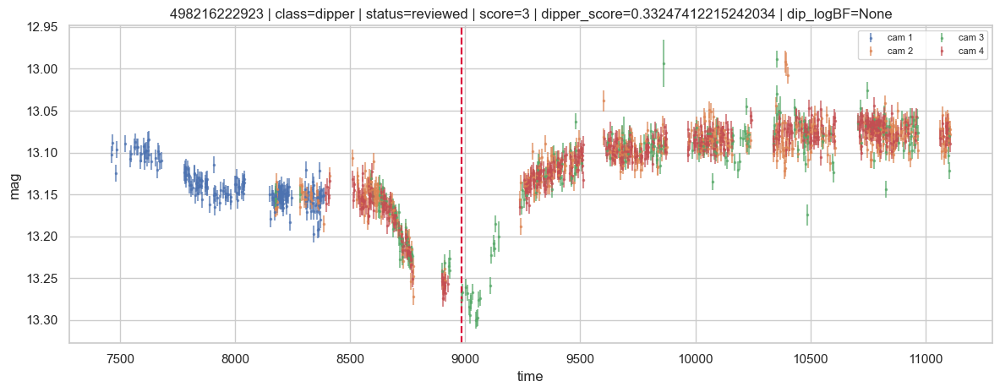

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
1223,498216222923,498216222923,dipper,interesting,reviewed,3,3,2026-03-20 20:06:46.892226+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.332474,52.0,35.0,1,gaussian,None,106.108764,0.022553,8983.78328,16.0,2.0,14.0,26.06195,-0.85544,0,0.0,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.097669,1115.0,3.0,2933.89483,1.01918,0.049686,0.036116,0.09866,0.015499,24.32987,3.329462,2.992795,5.800892,1.275839,5.342637,0,,,,,,0,NaN,None,0.0,NaN


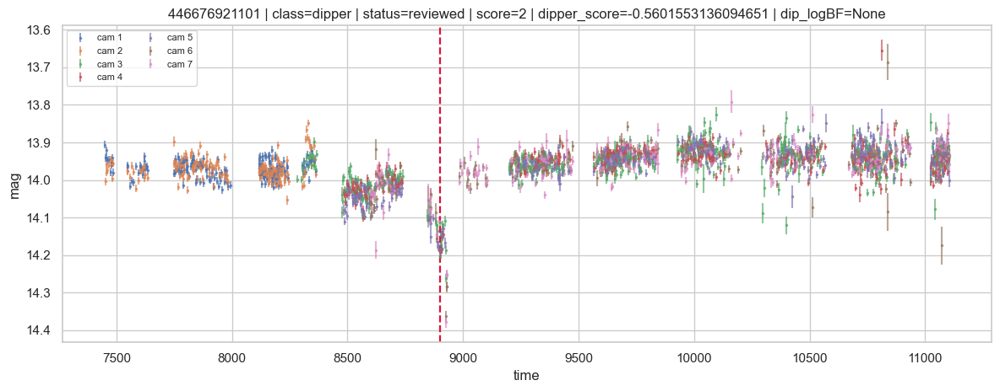

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
794,446676921101,446676921101,dipper,interesting,reviewed,2,2,2026-03-19 04:43:02.388097+00:00,,/home/calder/code/malca/output/runs/runs_march...,-0.560155,143.0,28.0,1,gaussian,None,88.878621,0.189052,8899.936998,10.0,1.0,10.0,13.01852,-0.613886,1,0.0,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.949305,1729.0,5.0,2822.03763,0.940105,0.047936,0.036734,0.097869,0.014537,18.131603,1.922555,1.786259,1.334949,0.961538,7806.900197,0,,,,,,0,NaN,None,0.969858,0.312858


### microlensing examples

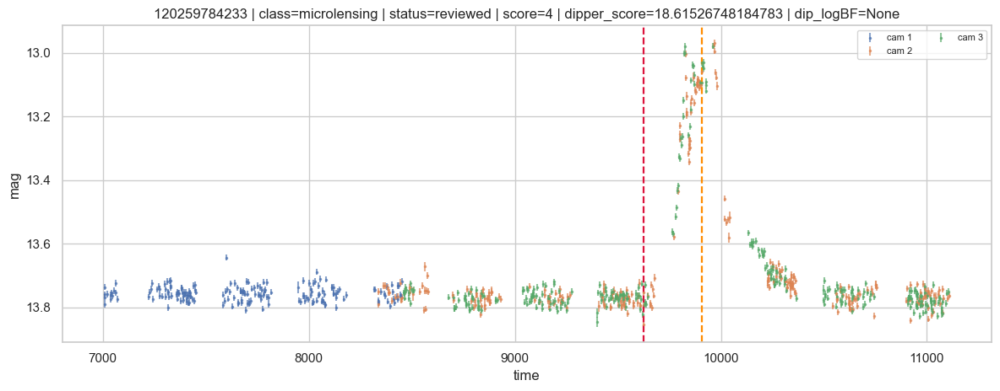

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
554,120259784233,120259784233,microlensing,interesting,reviewed,4,2,2026-03-20 06:30:14.291908+00:00,,/home/calder/code/malca/output/runs/runs_march...,18.615267,73.0,12.0,1,gaussian,None,75.55076,0.803099,9625.052969,6.0,1.0,6.0,58.78362,NaN,1,-1.929648,1,None,-1.403154,54.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.76609,507.0,2.0,2772.64745,1.991685,0.034453,0.029519,0.070772,0.01046,11.453628,1.662557,1.535177,1.130358,-0.891288,0.487721,0,,,,SB*,,0,NaN,None,0.0,NaN


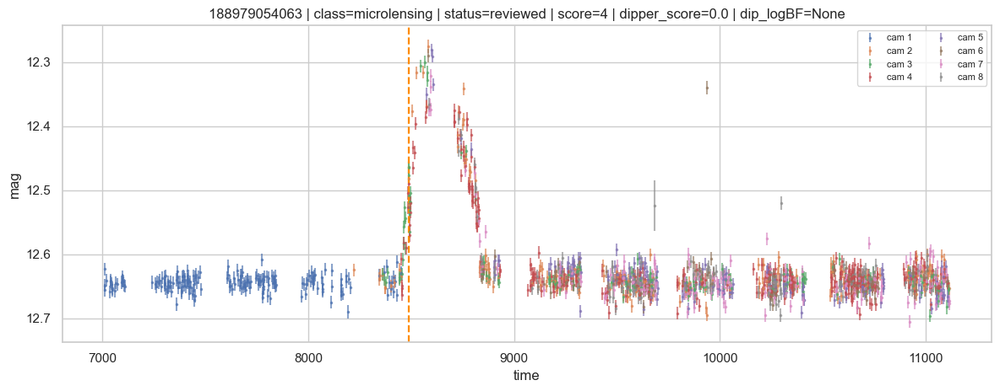

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
36,188979054063,188979054063,microlensing,interesting,reviewed,4,2,2026-03-19 05:06:26.081986+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.0,0.0,0.0,0,none,None,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.45606,1,None,-0.121097,60.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.64212,1051.0,7.0,2889.9801,1.000755,0.017853,0.015947,0.036309,0.005693,3.177648,0.306739,0.295359,0.571573,-0.074318,50.62439,0,,,,V*,,1,NaN,None,0.0,NaN


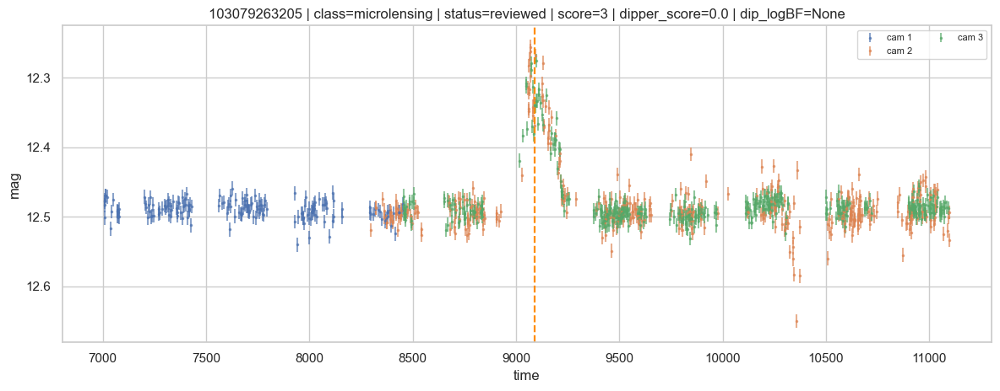

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
321,103079263205,103079263205,microlensing,interesting,reviewed,3,1,2026-03-19 19:53:03.364041+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.0,0.0,0.0,0,none,None,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-2.127812,1,None,-0.438476,31.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.493,678.0,2.0,2799.69881,1.904,0.017827,0.014151,0.03725,0.005887,3.157507,0.398058,0.360947,0.711265,-0.33503,5.67145,0,,,DSCT|GDOR|SXPHE,*,,1,1.275005,None,0.0,NaN


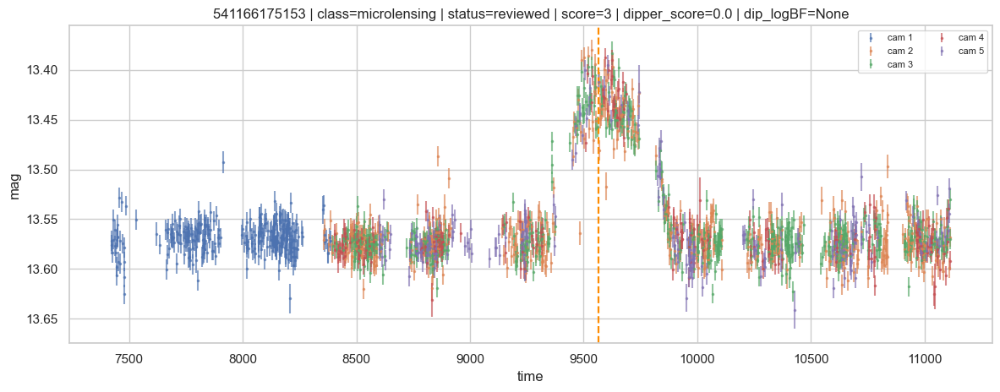

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
870,541166175153,541166175153,microlensing,interesting,reviewed,3,2,2026-03-20 20:24:47.695830+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.0,0.0,0.0,0,none,None,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.105657,1,None,-144.823549,47.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.573989,1121.0,4.0,2757.77923,1.012815,0.018599,0.014977,0.03809,0.005878,3.214441,0.243313,0.225665,0.622324,-0.641946,12.516084,0,,,,,,0,NaN,None,1.723404,0.555937


### unknown_interesting examples

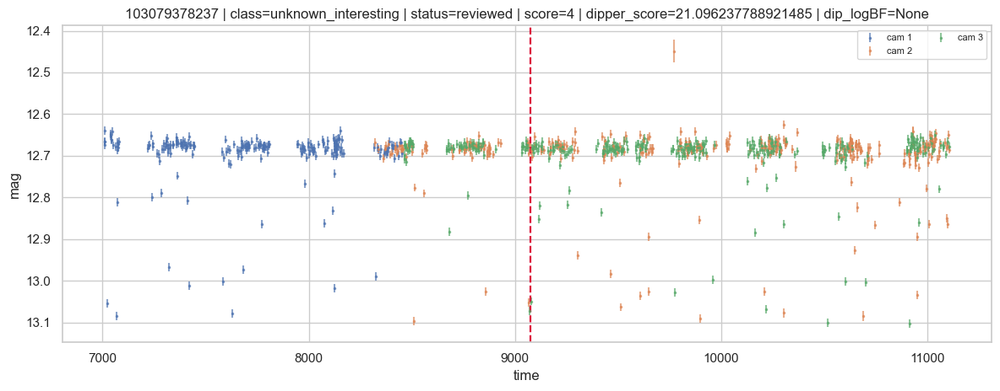

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
11,103079378237,103079378237,unknown_interesting,interesting,reviewed,4,2,2026-03-20 00:14:27.172933+00:00,,/home/calder/code/malca/output/runs/runs_march...,21.096238,130.0,28.0,1,gaussian,None,10.487376,199.309246,9075.566959,16.0,7.0,3.0,116.45466,-0.705237,0,0.0,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.680647,594.0,2.0,2785.71875,2.00714,0.014609,0.012558,0.03097,0.004296,2.107814,0.186907,0.176439,0.613688,0.216022,0.140569,0,,,,,,0,NaN,None,0.0,NaN


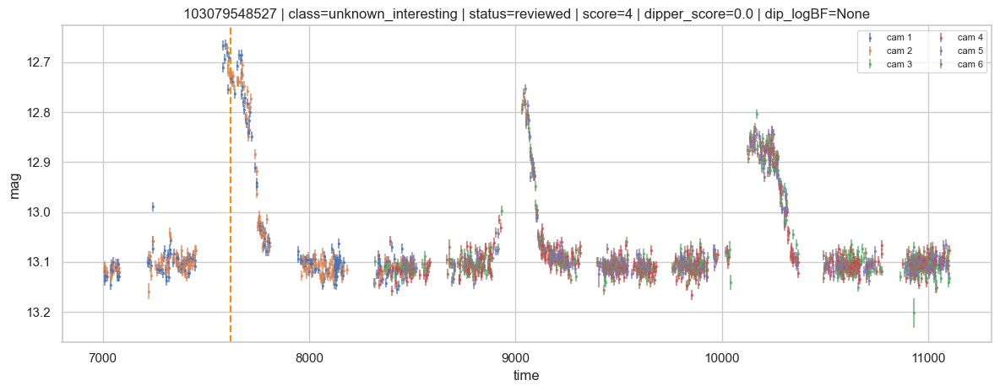

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
10,103079548527,103079548527,unknown_interesting,interesting,reviewed,4,2,2026-03-19 04:49:38.271690+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.0,0.0,0.0,0,none,None,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,0.125323,1,None,-1108.587144,161.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.105375,1158.0,4.0,2781.74762,0.99287,0.018806,0.015397,0.036,0.006897,3.513126,0.429935,0.397477,0.797745,-0.846716,12.951452,0,,,,V*,,1,NaN,None,2.140619,0.690522


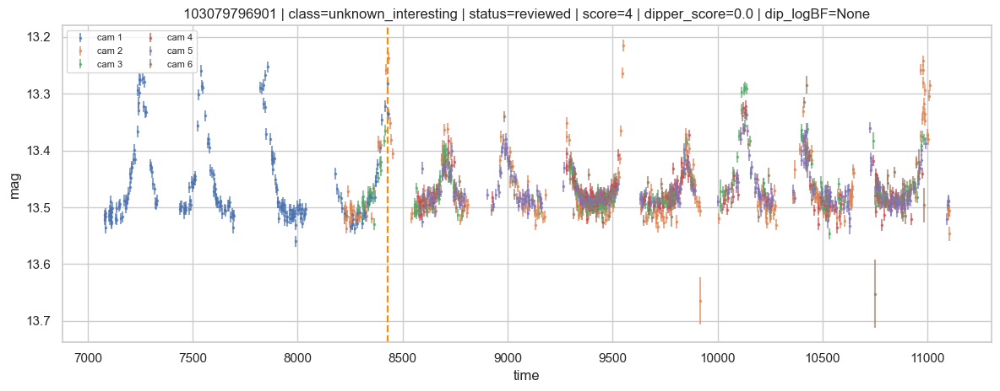

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
1009,103079796901,103079796901,unknown_interesting,interesting,reviewed,4,2,2026-03-19 04:49:46.573214+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.0,0.0,0.0,0,none,None,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.353461,1,None,-0.244179,53.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.482558,1180.0,5.0,2881.0991,1.08122,0.036215,0.021584,0.0725,0.011514,12.799428,1.895258,1.614509,1.992152,-1.36196,16.182243,0,,,,,,0,NaN,None,0.393589,0.126964


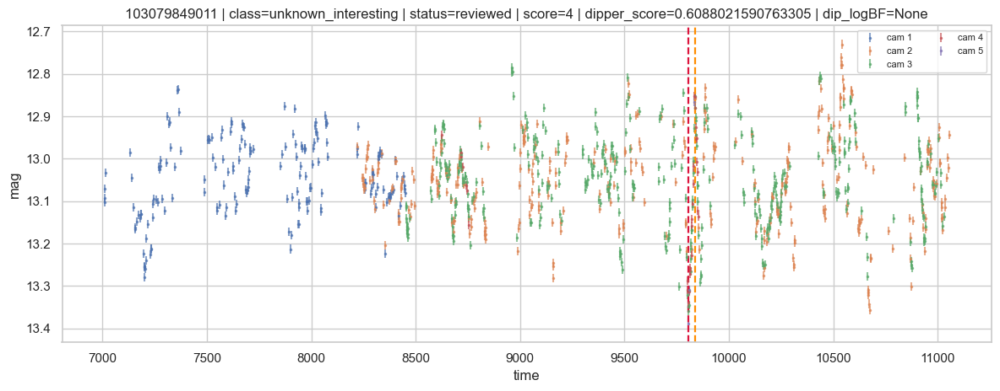

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
0,103079849011,103079849011,unknown_interesting,interesting,reviewed,4,2,2026-03-20 20:04:21.499047+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.608802,34.0,34.0,1,gaussian,None,137.063579,0.318144,9806.460993,9.0,1.0,9.0,20.95306,-0.136303,1,23.50589,1,None,-1.593717,7.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.055219,810.0,4.0,2833.58998,1.97568,0.110376,0.11152,0.218,0.025486,121.522365,8.462197,8.432822,5.320337,0.075851,0.239321,0,,,,,,0,NaN,None,0.0,NaN


### instrumental examples

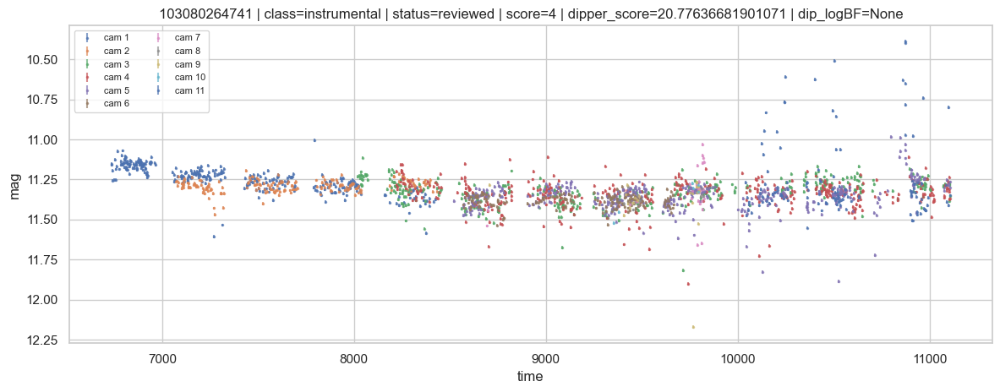

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
1012,103080264741,103080264741,instrumental,background,reviewed,4,2,2026-03-20 00:32:17.293707+00:00,,/home/calder/code/malca/output/runs/runs_march...,20.776367,289.0,48.0,1,noise,None,0.0,NaN,NaN,2.0,1.0,2.0,1.97375,NaN,1,20.097535,1,None,NaN,13.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,11.342491,1519.0,9.0,3088.49404,0.996145,0.078381,0.066005,0.155251,0.034852,61.436303,2.319028,2.134214,0.642783,-0.252945,60.921429,0,,,,,,0,NaN,None,0.076689,0.024738


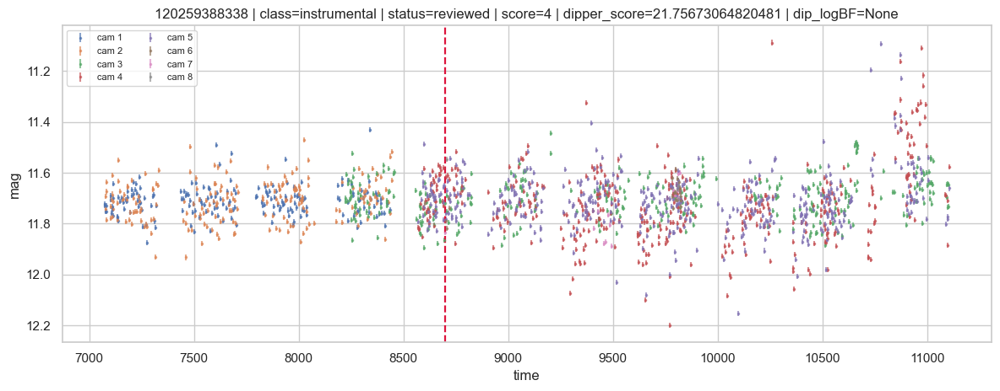

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
553,120259388338,120259388338,instrumental,background,reviewed,4,2,2026-03-19 23:26:56.152728+00:00,,/home/calder/code/malca/output/runs/runs_march...,21.756731,164.0,65.0,1,gaussian,None,11.5185,0.592825,8700.375657,5.0,2.0,3.0,6.99871,NaN,0,0.0,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,11.712818,1244.0,6.0,2881.22578,1.02241,0.10656,0.089409,0.222878,0.034086,113.550149,3.982374,3.736416,0.7502,-0.178264,62.019346,0,,,,,,0,NaN,None,0.094076,0.030347


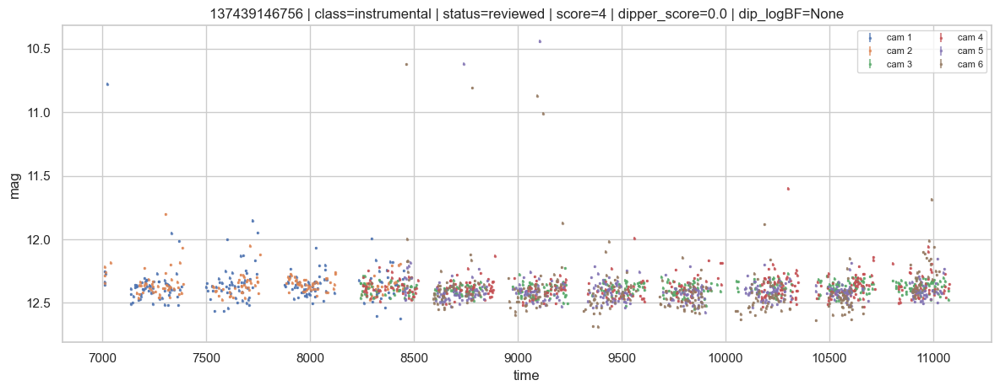

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
1027,137439146756,137439146756,instrumental,background,reviewed,4,2,2026-03-19 04:54:54.637868+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.0,0.0,0.0,0,none,None,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,21.38995,1,None,NaN,4.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.404439,1484.0,4.0,2836.61738,0.98758,0.077359,0.066766,0.157795,0.027571,59.843988,1.961846,1.829485,0.584155,-0.449118,218.728824,0,,,,,,0,NaN,None,0.614108,0.198099


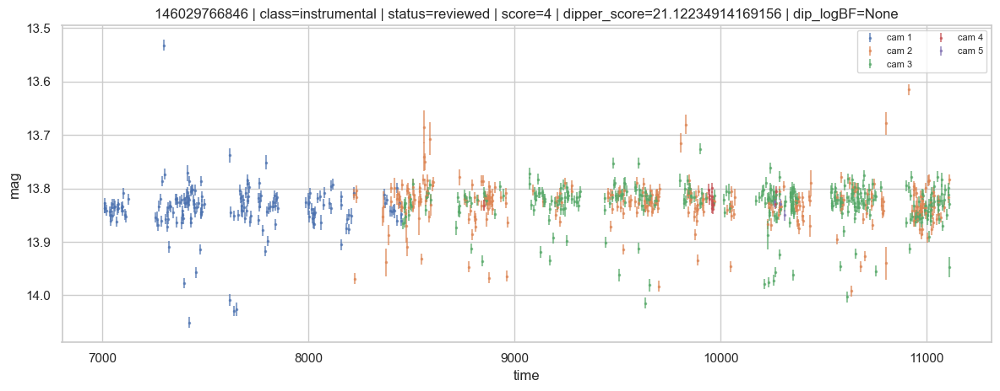

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
567,146029766846,146029766846,instrumental,background,reviewed,4,2,2026-03-20 00:13:22.992253+00:00,,/home/calder/code/malca/output/runs/runs_march...,21.122349,131.0,17.0,1,noise,None,0.0,NaN,NaN,4.0,2.0,2.0,21.89792,NaN,0,0.0,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.823035,607.0,4.0,2888.0226,1.99576,0.028236,0.020756,0.059,0.008464,6.866235,0.74506,0.661369,0.53649,0.906319,1.11827,0,,,,,,0,NaN,None,0.493468,0.159183


### other examples

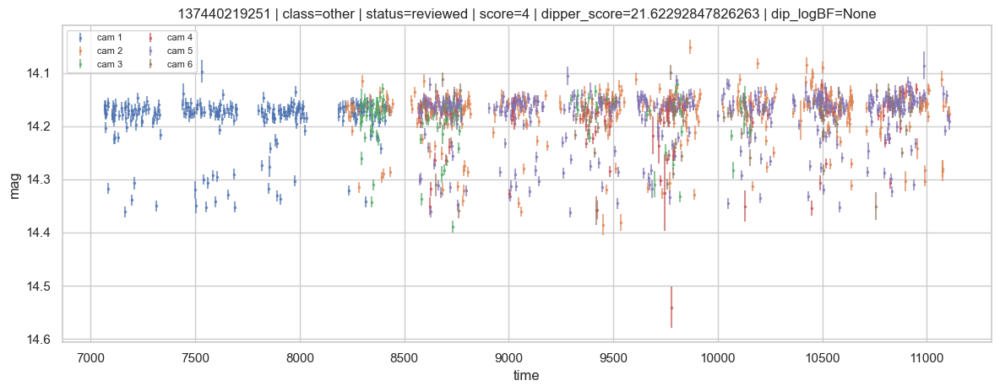

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
574,137440219251,137440219251,other,background,reviewed,4,2,2026-03-19 18:17:33.147342+00:00,,/home/calder/code/malca/output/runs/runs_march...,21.622928,247.0,37.0,1,noise,None,0.0,NaN,NaN,51.0,18.0,5.0,67.85037,-0.550265,0,0.0,0,None,NaN,0.0,None,None,None,None,None,3.0,None,0,1.5079,1.0,None,None,1.5079,None,None,14.165201,948.0,5.0,2883.14036,1.81144,0.038676,0.020756,0.081504,0.010172,13.108218,0.727681,0.592345,0.496205,1.421412,3.278449,1,asassn_var,,,,,0,NaN,None,0.0,NaN


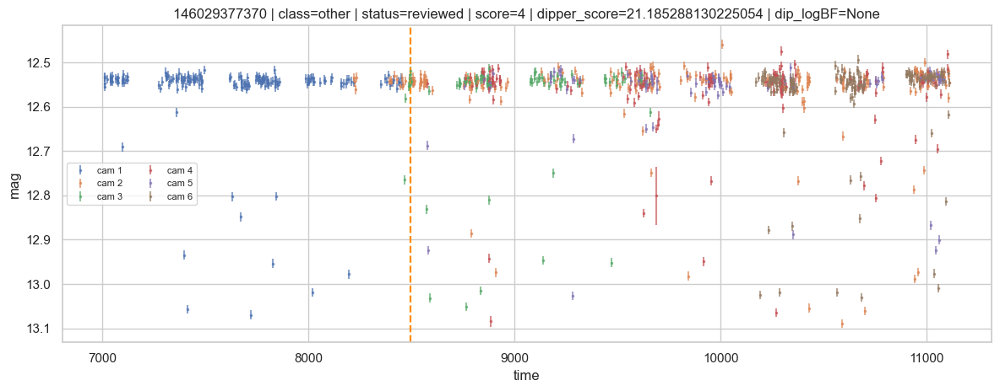

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
23,146029377370,146029377370,other,background,reviewed,4,2,2026-03-20 00:09:29.439308+00:00,,/home/calder/code/malca/output/runs/runs_march...,21.185288,142.0,11.0,1,noise,None,0.0,NaN,NaN,22.0,9.0,5.0,38.94669,NaN,0,13.942484,1,None,-0.037891,2.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.540868,612.0,5.0,2887.07867,1.90025,0.014893,0.012602,0.031754,0.004764,2.209296,0.101096,0.095636,0.539376,0.256789,0.394286,0,,ROT:,,EB*,,1,NaN,None,0.453942,0.146433


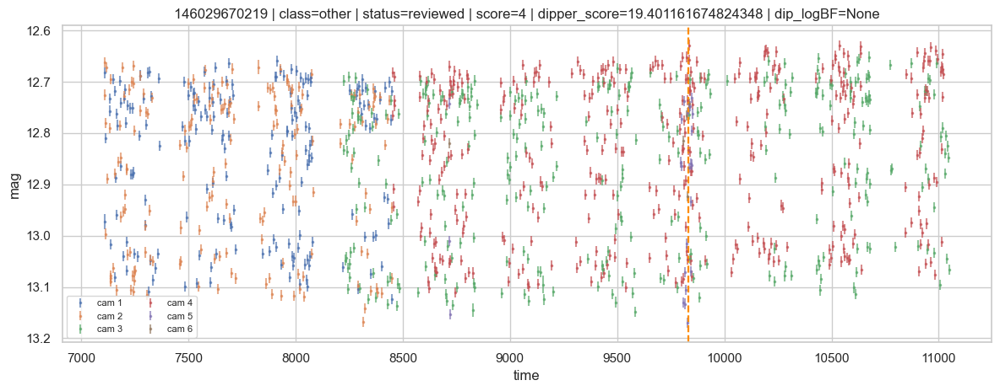

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
27,146029670219,146029670219,other,background,reviewed,4,2,2026-03-19 18:29:48.492442+00:00,,/home/calder/code/malca/output/runs/runs_march...,19.401162,226.0,82.0,1,noise,None,0.0,NaN,NaN,4.0,1.0,4.0,11.97575,NaN,1,19.237648,1,None,-1.447175,6.0,None,None,None,None,None,3.0,None,0,0.41245,2.0,None,None,0.41245,None,None,12.823462,768.0,4.0,2825.58534,1.97773,0.148937,0.180785,0.230438,0.027006,220.563091,7.149392,7.880539,0.511759,0.353501,4.89552,1,asassn_var,EW,,EB*,EW,1,NaN,None,0.128568,0.041474


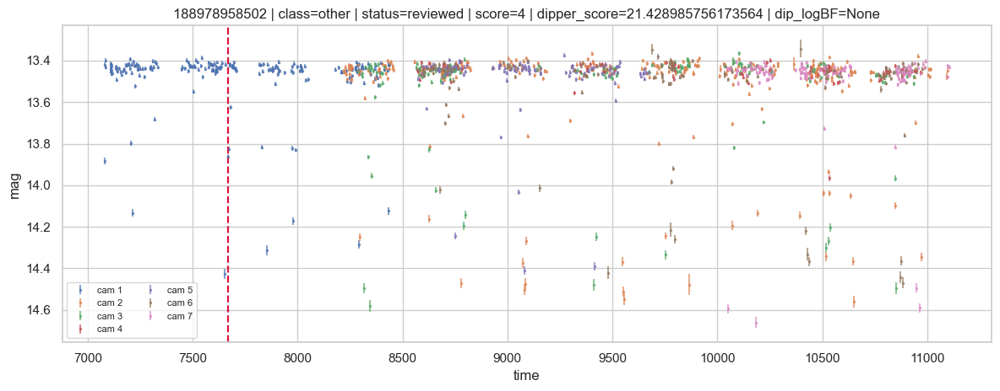

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
1050,188978958502,188978958502,other,background,reviewed,4,2,2026-03-19 18:20:30.660757+00:00,,/home/calder/code/malca/output/runs/runs_march...,21.428986,199.0,19.0,1,gaussian,None,13.826292,0.399131,7670.610454,6.0,3.0,2.0,8.95657,NaN,0,0.0,0,None,NaN,0.0,None,None,None,None,None,3.0,None,0,2.972988,2.0,None,None,2.972988,None,None,13.445424,845.0,6.0,2883.22701,1.85121,0.028273,0.025736,0.054858,0.008596,7.57142,0.87079,0.839919,0.571464,0.440111,0.877165,1,vsx,,,,,1,NaN,None,0.0,NaN


### flare examples

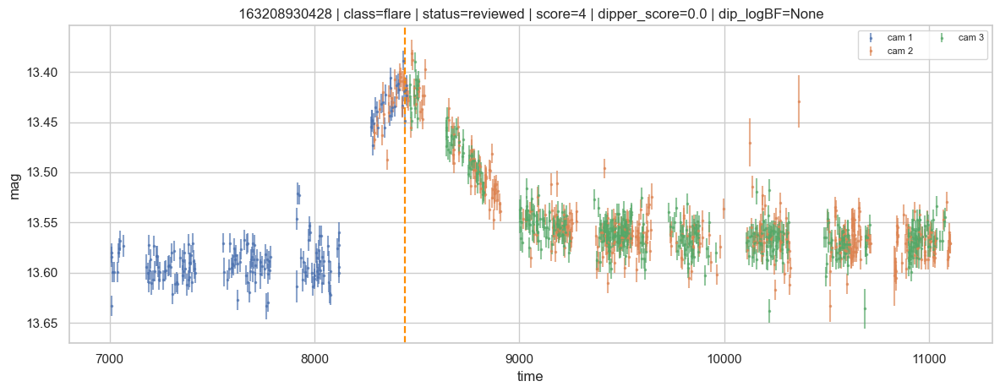

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
576,163208930428,163208930428,flare,interesting,reviewed,4,2,2026-03-19 04:56:50.694826+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.0,0.0,0.0,0,none,None,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.711125,1,None,-86.452765,14.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.561159,734.0,2.0,2811.64198,1.94534,0.0377,0.019274,0.0825,0.011208,13.551382,1.683791,1.312324,2.4777,-1.736522,1.616104,0,,,,,,0,NaN,None,0.0,NaN


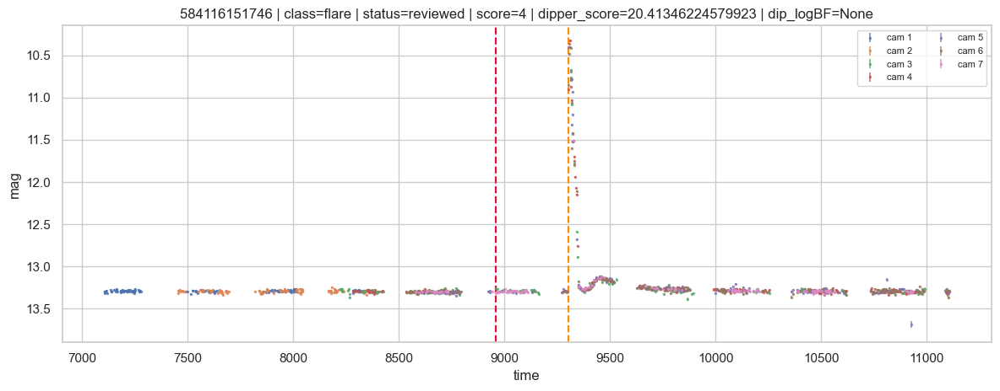

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
1277,584116151746,584116151746,flare,interesting,reviewed,4,2,2026-03-20 01:57:43.750097+00:00,,/home/calder/code/malca/output/runs/runs_march...,20.413462,115.0,2.0,1,skew_gaussian,None,23.034751,0.014318,8960.0783,118.0,12.0,53.0,167.18873,NaN,0,21.5812,1,None,-5.553832,52.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.289909,894.0,5.0,2882.89762,1.09483,0.022463,0.019219,0.0455,0.006818,4.904324,0.800908,0.745149,0.993334,-0.720642,1.741517,0,,,,,,0,NaN,None,0.493247,0.159112


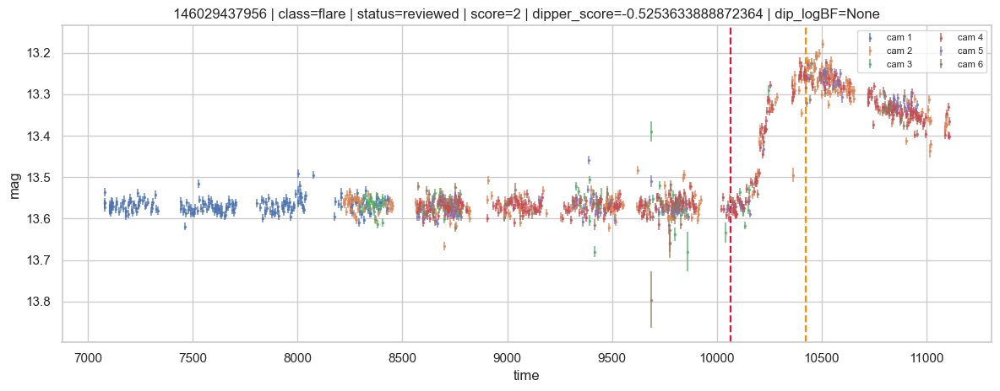

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
566,146029437956,146029437956,flare,interesting,reviewed,2,2,2026-03-19 04:44:06.044892+00:00,,/home/calder/code/malca/output/runs/runs_march...,-0.525363,77.0,10.0,1,gaussian,None,98.541123,0.02959,10064.698653,14.0,2.0,9.0,48.86042,0.839909,0,21.037343,1,None,-0.166645,82.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.557998,997.0,5.0,2887.2058,1.73756,0.126571,0.035585,0.182704,0.027954,154.974899,8.680712,7.525155,15.719182,-0.844398,0.517185,0,,,,*,,0,NaN,None,1.870512,0.603391


### ltv examples

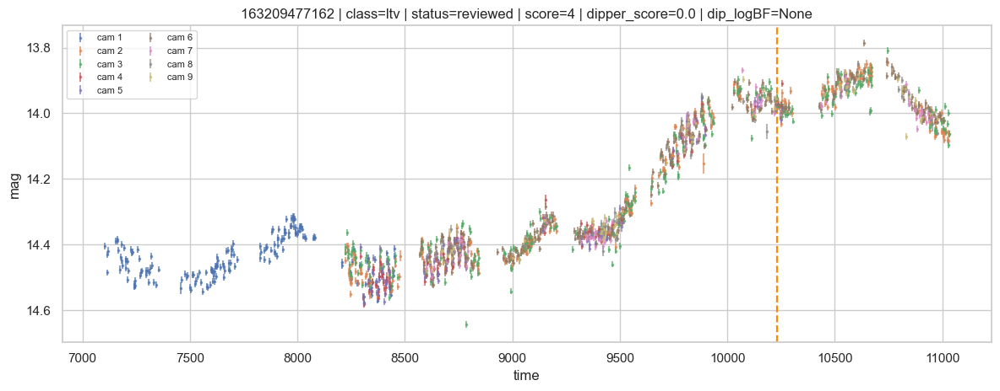

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
1037,163209477162,163209477162,ltv,interesting,reviewed,4,2,2026-03-19 04:57:01.548433+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.0,0.0,0.0,0,none,None,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,2.217345,1,None,-133.693816,5.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,14.298272,1409.0,8.0,2810.59134,0.996385,0.220918,0.279193,0.321215,0.035769,464.672577,20.078822,23.638781,43.872641,-0.131243,6072.800153,0,,ROT:,,*,,1,NaN,None,0.0,0.0


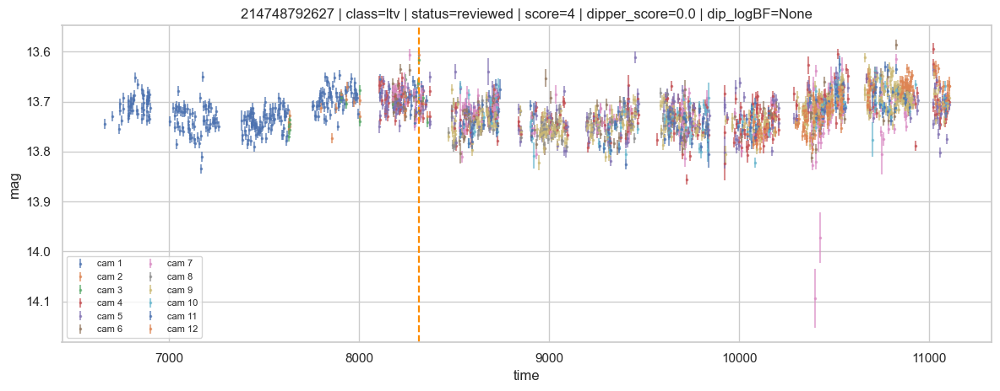

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
632,214748792627,214748792627,ltv,interesting,reviewed,4,2,2026-03-19 05:10:19.777130+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.0,0.0,0.0,0,none,None,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-0.056984,1,None,-0.062918,2.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.722225,1739.0,9.0,2998.11635,0.59782,0.036699,0.036975,0.072731,0.009882,11.875248,1.813857,1.810882,1.0515,-0.091368,5560.199129,0,,,,,,0,NaN,None,0.0,NaN


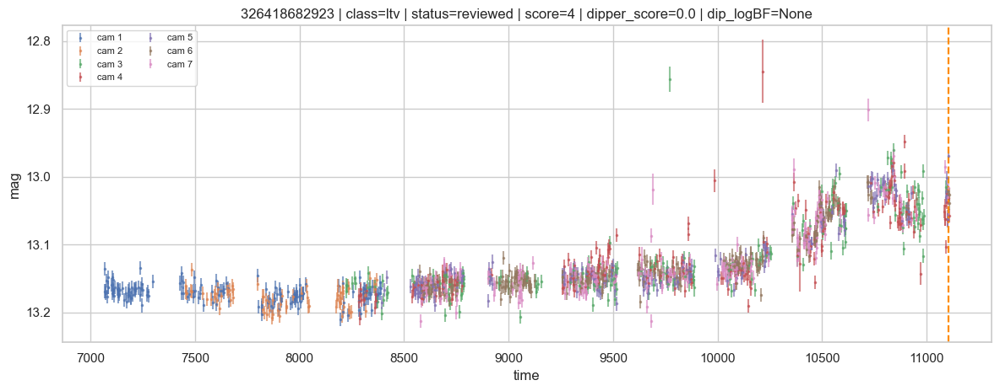

,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
1130,326418682923,326418682923,ltv,interesting,reviewed,4,2,2026-03-19 08:51:35.261872+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.0,0.0,0.0,0,none,None,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,1,-1.364057,1,None,-1.596679,10.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,13.139028,1025.0,5.0,2887.1981,1.12971,0.052408,0.034651,0.088607,0.01807,26.66424,3.511844,3.281525,3.801338,-0.937308,3.160526,0,,,,,,0,NaN,None,0.0,NaN


In [39]:
for label, n in [("dipper", 4), ("microlensing", 4), ("unknown_interesting", 4), ("instrumental", 4), ("other", 4), ("flare", 3), ("ltv", 3)]:
    if label in set(analysis["event_class"]):
        display(Markdown(f"### {label} examples"))
        _ = plot_class_examples(label, n=n, sort_by="interest_score")


## Candidate Rule Sandbox

Edit `rule_terms` and `positive_labels` to test human-readable selection cuts. The output reports recovery/composition for the selected subset and shows selected candidates.


In [40]:
def apply_rule_terms(data: pd.DataFrame, rule_terms: list[tuple[str, str, object]]) -> pd.Series:
    mask = pd.Series(True, index=data.index)
    for col, op, value in rule_terms:
        if col not in data.columns:
            print(f"Skipping missing column: {col}")
            continue
        s = data[col]
        if op == "==":
            mask &= s.eq(value)
        elif op == "!=":
            mask &= ~s.eq(value)
        elif op == ">":
            mask &= pd.to_numeric(s, errors="coerce").gt(float(value))
        elif op == ">=":
            mask &= pd.to_numeric(s, errors="coerce").ge(float(value))
        elif op == "<":
            mask &= pd.to_numeric(s, errors="coerce").lt(float(value))
        elif op == "<=":
            mask &= pd.to_numeric(s, errors="coerce").le(float(value))
        elif op == "in":
            mask &= s.isin(value)
        elif op == "not in":
            mask &= ~s.isin(value)
        else:
            raise ValueError(f"Unknown op: {op}")
    return mask

def evaluate_rule(rule_terms: list[tuple[str, str, object]], *, positive_labels: list[str], background_labels: list[str] = BACKGROUND_LABELS) -> tuple[pd.DataFrame, pd.DataFrame]:
    data = analysis.loc[analysis["event_class"].isin(positive_labels + background_labels)].copy()
    selected_mask = apply_rule_terms(data, rule_terms)
    selected = data.loc[selected_mask].copy()
    rows = []
    for label in positive_labels + background_labels:
        label_total = int(data["event_class"].eq(label).sum())
        label_selected = int(selected["event_class"].eq(label).sum())
        rows.append({
            "event_class": label,
            "selected": label_selected,
            "total": label_total,
            "recall_within_label": label_selected / label_total if label_total else np.nan,
            "composition_of_selected": label_selected / len(selected) if len(selected) else np.nan,
        })
    summary = pd.DataFrame(rows)
    return summary, selected

# Edit these after looking at the tests, coefficients, and light curves.
positive_labels = ["dipper"]
rule_terms = [
    ("dipper_score", ">", 0),
    # ("dip_best_log_bf", ">", 10),
    # ("dip_count", ">=", 1),
    # ("microlens_match", "!=", 1),
    # ("stats_points_kept_fraction", ">", 0.8),
]

rule_summary, rule_selected = evaluate_rule(rule_terms, positive_labels=positive_labels)
display(rule_summary)
display(rule_selected[KEY_DISPLAY_COLS].head(120))


,event_class,selected,total,recall_within_label,composition_of_selected
0,dipper,15,19,0.789474,0.060484
1,instrumental,184,404,0.455446,0.741935
2,other,49,96,0.510417,0.197581


,candidate_id,asas_sn_id,event_class,review_family,review_status,interest_score,review_pass,updated_at,notes,lc_path,dipper_score,dipper_n_dips,dipper_n_valid_dips,dip_significant,dip_best_morph,dip_best_log_bf,dip_best_delta_bic,dip_best_amp,dip_best_t0,dip_count,dip_run_count,dip_max_run_points,dip_max_run_duration,dip_symmetry_score,dip_is_single_event,jumper_score,jump_significant,jump_best_log_bf,jump_best_amp,jump_count,microlens_match,microlens_catalog,microlens_name,microlens_te_days,microlens_sep_arcsec,periodicity_score,periodicity_is_significant,periodic_flag,period_consensus_days,period_n_sources,phase_quality_score,lsp_power,lsp_period,pdm_snr,ce_snr,baseline_mag,n_points,n_cameras,stats_time_span_days,cadence_median_days,stats_photometry_std_mag,stats_photometry_robust_sigma_mag,stats_amplitude,stats_percent_amplitude,stats_variability_reduced_chi2_vs_constant,stats_variability_stetson_J,stats_variability_stetson_L,stats_variability_von_neumann_ratio,stats_skew,stats_max_slope,catalog_match,catalog_source,asassn_var_type,gaia_var_class,simbad_otype,ztf_var_type,vetting_likely_known,ruwe,pm_total,A_v_3d,ebv_3d
21,146029419304,146029419304,dipper,interesting,reviewed,1,2,2026-03-20 05:25:36.391339+00:00,,/home/calder/code/malca/output/runs/runs_march...,21.255792,86.0,31.0,1,gaussian,None,43.290860,1.857892e-01,8360.332817,7.0,3.0,3.0,5.97242,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.713999,955.0,5.0,2879.08105,1.784090,0.035245,0.031532,0.069026,0.012469,12.419886,2.096899,2.006437,1.624373,0.890436,4.945556,0,,YSO,,*,,1,NaN,None,5.450872e-01,1.758346e-01
22,146029473537,146029473537,instrumental,background,reviewed,3,2,2026-03-20 06:45:18.411651+00:00,,/home/calder/code/malca/output/runs/runs_march...,17.510799,77.0,29.0,1,noise,None,0.000000,NaN,NaN,4.0,2.0,2.0,13.01050,NaN,0,21.019143,1,None,NaN,6.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.387209,415.0,3.0,2876.09677,2.968915,0.080005,0.069682,0.168000,0.024541,64.002205,3.338954,3.154752,0.541395,-0.857134,0.359331,0,,,,*,,0,NaN,None,0.000000e+00,NaN
23,146029377370,146029377370,other,background,reviewed,4,2,2026-03-20 00:09:29.439308+00:00,,/home/calder/code/malca/output/runs/runs_march...,21.185288,142.0,11.0,1,noise,None,0.000000,NaN,NaN,22.0,9.0,5.0,38.94669,NaN,0,13.942484,1,None,-0.037891,2.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.540868,612.0,5.0,2887.07867,1.900250,0.014893,0.012602,0.031754,0.004764,2.209296,0.101096,0.095636,0.539376,0.256789,0.394286,0,,ROT:,,EB*,,1,NaN,None,4.539422e-01,1.464330e-01
27,146029670219,146029670219,other,background,reviewed,4,2,2026-03-19 18:29:48.492442+00:00,,/home/calder/code/malca/output/runs/runs_march...,19.401162,226.0,82.0,1,noise,None,0.000000,NaN,NaN,4.0,1.0,4.0,11.97575,NaN,1,19.237648,1,None,-1.447175,6.0,None,None,None,None,None,3.0,None,0,0.412450,2.0,None,None,0.412450,None,None,12.823462,768.0,4.0,2825.58534,1.977730,0.148937,0.180785,0.230438,0.027006,220.563091,7.149392,7.880539,0.511759,0.353501,4.895520,1,asassn_var,EW,,EB*,EW,1,NaN,None,1.285679e-01,4.147352e-02
41,197569299151,197569299151,instrumental,background,reviewed,4,2,2026-03-20 02:23:37.580627+00:00,,/home/calder/code/malca/output/runs/runs_march...,20.022617,163.0,50.0,1,noise,None,0.000000,NaN,NaN,5.0,2.0,3.0,12.95696,NaN,0,0.000000,0,None,NaN,0.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,11.476195,1464.0,6.0,3083.27728,1.001640,0.087754,0.070550,0.183877,0.029919,77.008356,3.107415,2.885652,0.799155,-0.392531,64.844357,0,,,,,,0,NaN,None,0.000000e+00,NaN
47,214749289462,214749289462,instrumental,background,reviewed,4,2,2026-03-20 20:04:11.230840+00:00,,/home/calder/code/malca/output/runs/runs_march...,0.692294,1.0,1.0,1,noise,None,0.000000,NaN,NaN,4.0,2.0,2.0,4.01180,NaN,0,20.845753,1,None,NaN,70.0,None,None,None,None,None,NaN,None,0,NaN,0.0,None,None,NaN,None,None,12.458843,1004.0,5.0,2888.9

## Optional Exports

Uncomment this cell to write CSV snapshots for review outside the notebook.


In [41]:
# out_dir = RUN_DIR / "analysis_tables"
# out_dir.mkdir(parents=True, exist_ok=True)
# candidate_table(None, max_rows=len(reviewed)).to_csv(out_dir / "reviewed_candidate_table.csv", index=False)
# all_numeric_tests.to_csv(out_dir / "review_numeric_contrast_tests.csv", index=False)
# for name, table in cat_tables.items():
#     table.to_csv(out_dir / f"categorical_tests_{name}.csv", index=False)
# for name, result in binary_models.items():
#     result["coef_table"].to_csv(out_dir / f"logit_coefficients_{name}.csv", index=False)
#     result["scored"].to_csv(out_dir / f"cv_scores_{name}.csv", index=False)
# print(f"Wrote analysis tables to {out_dir}")
